In [2]:
# Definimos path de carpeta del proyecto
path_relativo =  r"../SET DE DATOS/UNIDO/CLIMA/Provinciales"
destino_archivos =  "../SET DE DATOS/PROCESADOS/"

In [4]:
# Comprobamos los archivos disponibles
!ls "../SET DE DATOS/UNIDO/CLIMA/Provinciales"

 ARCHIVOS		       'LA RIOJA - ESTACIONES.zip'
 BSAS-ESTACIONES.zip	       'MENDOZA - ESTACIONES.zip'
 CATAMARCA-ESTACIONES.zip       MISIONES-ESTACIONES.zip
'CHUBUT - ESTACIONES.zip'      'NEUQUEN - ESTACIONES.zip'
 CORDOBA-ESTACIONES.zip        'RIO NEGRO - ESTACIONES.zip'
 CORRIENTES-ESTACIONES.zip     'SALTA - ESTACIONES.zip'
'ENTRE RIOS - ESTACIONES.zip'  'SAN JUAN - ESTACIONES.zip'
 FORMOSA-ESTACIONES.zip        'SANTA CRUZ - ESTACIONES.zip'
 JUJUY-ESTACIONES.zip	       'SANTA FE - ESTACIONES.zip'
'LA PAMPA - ESTACIONES.zip'    'SANTIAGO DEL ESTERO - ESTACIONES.zip'


In [6]:
import os
import zipfile
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
from scipy.stats import skew, kurtosis


from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [8]:
def listar_archivos_zip(directorio):
  """
  Lista todos los archivos .xls en el directorio especificado.

  Args:
    directorio: La ruta del directorio a listar.
  """

  archivos_xls = []
  try:
    for archivo in os.listdir(directorio):
      if archivo.endswith(".zip"):
        archivos_xls.append(archivo)
    return archivos_xls
  except FileNotFoundError:
    print(f"Error: El directorio '{directorio}' no existe.")
    return []


def listar_archivos_xls(directorio):
  """
  Lista todos los archivos .xls en el directorio especificado.

  Args:
    directorio: La ruta del directorio a listar.
  """

  archivos_xls = []
  try:
    for archivo in os.listdir(directorio):
      if archivo.endswith(".xls"):
        archivos_xls.append(archivo)
    return archivos_xls
  except FileNotFoundError:
    print(f"Error: El directorio '{directorio}' no existe.")
    return []






def descomprimir_zip(archivo_zip, directorio_destino):
    """
    Descomprime un archivo ZIP en el directorio de destino especificado.

    Args:
        archivo_zip: La ruta del archivo ZIP que se va a descomprimir.
        directorio_destino: La ruta del directorio donde se extraerán los archivos.
    """

    try:
        with zipfile.ZipFile(archivo_zip, 'r') as zip_ref:
            zip_ref.extractall(directorio_destino)
        print(f"El archivo '{archivo_zip}' se ha descomprimido correctamente en '{directorio_destino}'.")
    except FileNotFoundError:
        print(f"Error: El archivo '{archivo_zip}' no se encontró.")
    except zipfile.BadZipFile:
        print(f"Error: El archivo '{archivo_zip}' no es un archivo ZIP válido.")
    except Exception as e:
        print(f"Ocurrió un error inesperado: {e}")

# Organizamos los datos del dataframe para obtener datos sobre los registros que tiene
def control_reg_utiles(df) -> dict:
    inicio = df['Fecha'].min()
    fin = df['Fecha'].max()
    n_registros= df_tmp.shape[0]

    dic_parametros = {}
    for columna in df.columns:
        reg = (df[~df[columna].isnull()].shape[0]*100)/n_registros
        dic_parametros[columna] = reg
        print(f"{columna} : {reg:.2f}% validos")
    return dic_parametros


def eliminar_archivos(lista_archivos):
    """
    Elimina los archivos especificados en la lista.

    Args:
        lista_archivos: Una lista de rutas de archivos a eliminar.
    """
    for archivo in lista_archivos:
        try:
            os.remove(archivo)
            print(f"Archivo eliminado: {archivo}")
        except FileNotFoundError:
            print(f"Error: El archivo no fue encontrado: {archivo}")
        except Exception as e:
            print(f"Error al eliminar el archivo {archivo}: {e}")

def correlaciones(df: pd.DataFrame,var_relacionadas:list):

    # Eliminamos registros con NA para analizar la correlacion
    df_largo_predictores = df[var_relacionadas].dropna()
    matriz_correlacion = df_largo_predictores.corr()

    # Configuración del estilo de seaborn
    sns.set(style="white")

    # Creación de la máscara para la mitad superior de la matriz
    mask = np.triu(np.ones_like(matriz_correlacion, dtype=bool))

    # Configuración de la figura matplotlib
    f, ax = plt.subplots(figsize=(9, 6))

    # Creación del mapa de calor con seaborn
    cmap = sns.diverging_palette(230, 20, as_cmap=True) # Paleta de colores divergente
    sns.heatmap(matriz_correlacion, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f")

    # Título y ajustes adicionales
    plt.title('Matriz de Correlación de Predictores', fontsize=16)
    plt.xticks(rotation=45, ha='right') # Rotación de etiquetas del eje x
    plt.yticks(rotation=0) # Asegura que las etiquetas del eje y no estén rotadas
    plt.tight_layout() # Ajusta los parámetros de subtrama para un diseño compacto
    plt.show()



def ver_correlacion(matriz_correlacion):
    # Configuración del estilo de seaborn
    sns.set(style="white")

    # Creación de la máscara para la mitad superior de la matriz
    mask = np.triu(np.ones_like(matriz_correlacion, dtype=bool))

    # Configuración de la figura matplotlib
    f, ax = plt.subplots(figsize=(11, 9))

    # Creación del mapa de calor con seaborn
    cmap = sns.diverging_palette(230, 20, as_cmap=True) # Paleta de colores divergente
    sns.heatmap(matriz_correlacion, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f")

    # Título y ajustes adicionales
    plt.title('Matriz de Correlación de Predictores', fontsize=16)
    plt.xticks(rotation=45, ha='right') # Rotación de etiquetas del eje x
    plt.yticks(rotation=0) # Asegura que las etiquetas del eje y no estén rotadas
    plt.tight_layout() # Ajusta los parámetros de subtrama para un diseño compacto
    plt.show()


def plot_por_provincia_total(provincias:list,df,variable:str):
    """
    Funcion para graficar un grid de boxplot de valor de la variable en la sumatoria de todos los meses
    """
    
    # Cantidad de provincias
    n = len(provincias)

    # Organizamos el grid
    cols = 3
    rows = math.ceil(n / cols)

    # Crear figura y ejes
    fig, axs = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
    axs = axs.flatten()  # Para acceder a los ejes fácilmente en 1D

    # Generar los boxplots
    for i, provincia in enumerate(provincias):
        datos = df[df['Provincia'] == provincia][variable].dropna()
    
        axs[i].boxplot(datos, vert=True)
        axs[i].set_title(f'{provincia}')
        axs[i].set_ylabel(variable)
        axs[i].grid(True)

    # Eliminar los subplots vacíos si hay menos provincias que cuadros
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    fig.suptitle(f'Distribución de {variable} por Provincia', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Deja espacio para el título general
    plt.show()



#------
def plot_por_provincia_mensual(provincias:list,df,variable:str):
    """
    Funcion para graficar un grid de boxplot de valor de la variable desagregado por mes
    """

    plt.figure(figsize=(12, 8))  # Ajusta el tamaño de la figura para mejor visualización

    for provincia in provincias:
        df_provincia = df[df['Provincia'] == provincia]
        # Agrupa por MES y calcula el promedio de la variable
        promedio_variable = df_provincia.groupby('MES')[variable].mean()
        plt.plot(promedio_variable.index, promedio_variable.values, label=provincia)

    plt.title(f'{variable} promedio por Mes y Provincia')
    plt.xlabel('Mes')
    plt.ylabel(variable)
    plt.xticks(range(1, 13))  
    plt.legend()  
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()




def crear_dic_estadisticos(df,variables):
    diccionario_estadisticos = {}
    provincias = df["Provincia"].unique()
    for provincia in provincias:
        diccionario_estadisticos[provincia] = {}  # Inicializa el diccionario para la provincia
        for mes in list(df["MES"].unique()):
            diccionario_estadisticos[provincia][mes] = {} # Inicializa el diccionario para el mes
            for variable in variables:
                datos = df[(df['Provincia'] == provincia) & (df['MES'] == mes)][variable].dropna()  # Obtiene los datos de la variable y provincia, eliminando valores nulos
                if not datos.empty:  # Verifica que no este vacio el dataframe
                    Q1 = datos.quantile(0.25)
                    Q3 = datos.quantile(0.75)
                    IQR = Q3 - Q1
                    media = datos.mean()
                    desviacion_estandar = datos.std()
                    diccionario_estadisticos[provincia][mes][variable] = {
                        'Q1': Q1,
                        'Q3': Q3,
                        'IQR': IQR,
                        'Media': media,
                        'Desviacion_estandar': desviacion_estandar
                    }
                else:
                    diccionario_estadisticos[provincia][mes][variable] = None  # En caso de que el dataframe este vacio, le asigno None al diccionario.
    print(diccionario_estadisticos)
    return diccionario_estadisticos



def completar_valores_medios(df,variable:str,provincias:list):
    # Asignamos el valor medio mensual de variable por provincia para completar los valores faltantes
    dic_prov_media = {}

    for provincia in provincias:
        # Obtenemos el valor medio por mes por provicincia de la variable deseada , y lo cargamos en el diccionario como una lista de meses
        dic_prov_media[provincia] = df[df['Provincia'] == provincia].groupby('MES')[variable].mean().to_list()


    for provincia in provincias: 
        for mes in range(1, 13):  # Iteramos sobre los meses (1 a 12)
            valor_medio = dic_prov_media[provincia][mes - 1]  # Obtenemos el valor medio del mes correspondiente
            df.loc[(df['Provincia'] == provincia) & (df['MES'] == mes) & (df[variable].isnull()), variable] = valor_medio
    return df






def regresion_lineal_total(df: pd.DataFrame, variables_predictoras: list,variable_objetivo: str):
    """
    Funcion para obtener un regresor con sus metricas
    """

    # Filtrar registros sin valores nulos en variables predictoras y objetivo
    df_filtrado = df.dropna(subset=variables_predictoras + [variable_objetivo])

    # Separar variables predictoras (X) y variable objetivo (y)
    X = df_filtrado[variables_predictoras]
    y = df_filtrado[variable_objetivo]

    #División de los datos en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    #Creación y entrenamiento del modelo de regresión lineal
    modelo = LinearRegression()
    modelo.fit(X_train, y_train)

    #Predicciones y evaluación del modelo
    y_pred = modelo.predict(X_test)

    # Calcular métricas de evaluación
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Error Cuadrático Medio (MSE): {mse}")
    print(f"Coeficiente de Determinación (R2): {r2}")

    #Visualización de los resultados


    plt.scatter(y_test, y_pred)
    plt.xlabel("Valores reales")
    plt.ylabel("Valores predichos")
    plt.title("Valores reales vs. Valores predichos")
    plt.show()

    return modelo




def regresion_lineal_provincial(df: pd.DataFrame ,prov,variables_predictoras: list,variable_objetivo: str):
    """
    Funcion para obtener un regresor con sus metricas
    """

    # Filtrar registros sin valores nulos en variables predictoras y objetivo
    df_filtrado = df.dropna(subset=variables_predictoras + [variable_objetivo])

    # Separar variables predictoras (X) y variable objetivo (y)
    X = df_filtrado[df_filtrado['Provincia']==prov][variables_predictoras]
    y = df_filtrado[df_filtrado['Provincia']==prov][variable_objetivo]

    #División de los datos en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    #Creación y entrenamiento del modelo de regresión lineal
    modelo = LinearRegression()
    modelo.fit(X_train, y_train)

    #Predicciones y evaluación del modelo
    y_pred = modelo.predict(X_test)

    # Calcular métricas de evaluación
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Error Cuadrático Medio (MSE): {mse}")
    print(f"Coeficiente de Determinación (R2): {r2}")

    #Visualización de los resultados


    plt.scatter(y_test, y_pred)
    plt.xlabel("Valores reales")
    plt.ylabel("Valores predichos")
    plt.title("Valores reales vs. Valores predichos")
    plt.show()

    return modelo


def regresion_lineal_provincial_mensual(df: pd.DataFrame ,prov,variables_predictoras: list,variable_objetivo: str,mes=int):
    """
    Funcion para obtener un regresor con sus metricas
    """

    # Filtrar registros sin valores nulos en variables predictoras y objetivo
    df_filtrado = df[ (df['Provincia']==prov) & (df['MES']==mes)].dropna(subset=variables_predictoras + [variable_objetivo])

    # Separar variables predictoras (X) y variable objetivo (y)
    X = df_filtrado[variables_predictoras]
    y = df_filtrado[variable_objetivo]

    #División de los datos en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    #Creación y entrenamiento del modelo de regresión lineal
    modelo = LinearRegression()
    modelo.fit(X_train, y_train)

    #Predicciones y evaluación del modelo
    y_pred = modelo.predict(X_test)

    # Calcular métricas de evaluación
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Error Cuadrático Medio (MSE): {mse}")
    print(f"Coeficiente de Determinación (R2): {r2}")

    #Visualización de los resultados


    plt.scatter(y_test, y_pred)
    plt.xlabel("Valores reales")
    plt.ylabel("Valores predichos")
    plt.title("Valores reales vs. Valores predichos")
    plt.show()

    return modelo


def crear_boxplot_grid(df, provincia_col:str, mes_col:str, valor_col:str):
    """Crea una grid de boxplots
    in: 
        df: DataFrame a analizar
        provincia_col: nombre de la columna donde estan listadas las provincias
        mes_col: nombre de la columna donde estan listados los meses
        valor_col: nombre de la columna a analizar
    
    """

    # Cada grupo tenga todos los meses
    grupos_completos = []
    for provincia in df[provincia_col].unique():
        for mes in range(1, 13):
            grupos_completos.append((provincia, mes))

    df_grupos_completos = pd.DataFrame(grupos_completos, columns=[provincia_col, mes_col])
    df_completo = pd.merge(df_grupos_completos, df, on=[provincia_col, mes_col], how='left')

    # Crear FacetGrid con datos completos
    g = sns.FacetGrid(df_completo, col=provincia_col, col_wrap=3, height=4, aspect=1.2)

    # Crear boxplots
    def boxplot_con_manejo_de_errores(data, **kwargs):
        try:
            sns.boxplot(data=data, x=mes_col, y=valor_col, **kwargs)
        except ValueError as e:
            print(f"Error en boxplot: {e}")

    g.map_dataframe(boxplot_con_manejo_de_errores)

    g.set_axis_labels('Mes', valor_col)
    g.set_titles(col_template='{col_name}')
    g.set_xticklabels(range(1, 13))

    plt.tight_layout()
    plt.show()



def completar_valores_normal(df: pd.DataFrame,variable:str,provincias:list) -> pd.DataFrame:
    """
    Funcion para completar los valores NA de la columna variable con los valores Normales de dicha columna por MES por Provincia
    """
    # Obtenemos el valor medio mensual de humedad por provincia para completar los valores faltantes
    dic_prov_normal = {}
    # Obtengo la mediana o el valor normal mensual por provincia de la variable
    for provincia in provincias:
        dic_prov_normal[provincia] = df[df['Provincia'] == provincia].groupby('MES')[variable].median().to_list()


    for provincia in provincias: 
        for mes in range(1, 13):  # Iteramos sobre los meses (1 a 12)
            # Obtenemos el valor medio del mes correspondiente
            valor_normal = dic_prov_normal[provincia][mes - 1]  
            # Asignamos el valor medio del mes correspondiente para cada Provincia
            df.loc[(df['Provincia'] == provincia) & (df['MES'] == mes) & (df[variable].isnull()), variable] = valor_normal
    return df




def asignar_precipitacion_global(df):
    """
    Asigna valores de 'Precipitacion_Pluviometrica' de registros válidos a registros nulos
    en la misma fecha y provincia, pero en diferente localidad, latitud o longitud.

    Args:
        df: El DataFrame a modificar.

    Returns:
        El DataFrame modificado con los valores nulos de 'Precipitacion_Pluviometrica' actualizados.
    """
    # 1. Agrupar por 'Provincia' y 'Fecha'
    grouped = df.groupby(['Provincia', 'Fecha'])

    # 2. Función para aplicar a cada grupo
    def asignar_grupo(grupo):
        # 3. Verificar si hay algún valor no nulo de 'Precipitacion_Pluviometrica' en el grupo
        existen_validos = grupo['Precipitacion_Pluviometrica'].notnull().any()

        if existen_validos:
            # 4. Filtrar los registros nulos de 'Precipitacion_Pluviometrica' en el grupo
            df_nulos = grupo[grupo['Precipitacion_Pluviometrica'].isnull()]

            # 5. Filtrar los registros no nulos de 'Precipitacion_Pluviometrica' en el grupo
            df_no_nulos = grupo[grupo['Precipitacion_Pluviometrica'].notnull()]

            # 6. Verificar si existen registros no nulos con diferente Localidad, Latitud o Longitud
            if not df_nulos.empty:
                registros_validos_distintos = df_no_nulos[
                    (~df_no_nulos['Localidad'].isin(df_nulos['Localidad'].unique())) |
                    (~df_no_nulos['Latitud'].isin(df_nulos['Latitud'].unique())) |
                    (~df_no_nulos['Longitud'].isin(df_nulos['Longitud'].unique()))
                ]
                if not registros_validos_distintos.empty:
                    # 7. Asignar el primer valor no nulo de 'Precipitacion_Pluviometrica' a los registros nulos
                    valor_asignar = registros_validos_distintos.iloc[0]['Precipitacion_Pluviometrica']
                    grupo.loc[grupo['Precipitacion_Pluviometrica'].isnull(), 'Precipitacion_Pluviometrica'] = valor_asignar
        return grupo

    # 8. Aplicar la función a cada grupo y concatenar los resultados
    df_modificado = grouped.apply(asignar_grupo).reset_index(level=[0,1], drop=True)
    return df_modificado


def identificar_outliers(df, diccionario_estadisticos, variables,delta):
    """
    Identifica outliers en un DataFrame utilizando los estadísticos proporcionados en un diccionario.

    Args:
        df: El DataFrame a analizar.
        diccionario_estadisticos: Un diccionario que contiene los estadísticos por provincia, mes y variable.
        variables: Lista de las variables a analizar.

    Returns:
        El DataFrame original con columnas adicionales indicando si cada valor es un outlier.
    """
    for variable in variables:
        nombre_columna_outlier = f'{variable}_outlier'  # Nombre de la nueva columna
        df[nombre_columna_outlier] = False  # Inicializa la columna con False

    for index, row in df.iterrows():
        provincia = row['Provincia']
        mes = row['MES']

        if provincia in diccionario_estadisticos and mes in diccionario_estadisticos[provincia]:
            for variable in variables:
                if variable in diccionario_estadisticos[provincia][mes] and diccionario_estadisticos[provincia][mes][variable] is not None:
                    Q1 = diccionario_estadisticos[provincia][mes][variable]['Q1']
                    Q3 = diccionario_estadisticos[provincia][mes][variable]['Q3']
                    IQR = diccionario_estadisticos[provincia][mes][variable]['IQR']
                    valor = row[variable]
                    limite_inferior = Q1 - delta * IQR
                    limite_superior = Q3 + delta * IQR

                    if valor < limite_inferior or valor > limite_superior:
                        nombre_columna_outlier = f'{variable}_outlier'
                        df.at[index, nombre_columna_outlier] = True  # Marca el registro como outlier

    return df



def contar_outliers_por_anio(df, variables):
    """
    Cuenta los valores atípicos (True) por año y variable en un DataFrame.

    Args:
        df: El DataFrame a analizar.
        variables: Lista de las variables originales (sin el sufijo '_outlier').

    Returns:
        Un DataFrame con el conteo de outliers por año y variable.
    """
    # Crear una lista de las columnas de outliers
    columnas_outliers = [f'{var}_outlier' for var in variables]

    # Agrupar por año y contar los valores True en las columnas de outliers
    conteo_outliers = df.groupby(df['Fecha'].dt.year)[columnas_outliers].sum().reset_index()
    conteo_outliers = conteo_outliers.melt(id_vars='Fecha', value_vars=columnas_outliers, var_name='Variable_Outlier', value_name='Conteo_Outliers')
    conteo_outliers['Variable'] = conteo_outliers['Variable_Outlier'].str.replace('_outlier','')
    return conteo_outliers


def graficar_outliers_por_anio(df, titulo):
    """
    Grafica el conteo de outliers por año para cada variable.

    Args:
        df: DataFrame con el conteo de outliers por año y variable.
        titulo: El título del gráfico.
    """
    plt.figure(figsize=(12, 6))
    sns.lineplot(x='Fecha', y='Conteo_Outliers', hue='Variable', marker='o', data=df)
    plt.title(titulo)
    plt.xlabel('Año')
    plt.ylabel('Conteo de Outliers')
    plt.xticks(df['Fecha'].unique())  # Mostrar ticks para cada año
    plt.legend(title='Variable')
    plt.grid(True)
    plt.tight_layout()
    plt.show()









def visualizar_estadisticos_filtro_mes(mes,data_dict):
    # Se evalua los estadisticos por provincia segun un mes especifico
    mes = mes  

    # Paso 1: Convertir el diccionario a un DataFrame para un MES específico
    records = []
    for provincia, meses in data_dict.items():
        if mes in meses:
            for variable, stats in meses[mes].items():
                records.append({
                    'Provincia': provincia,
                    'Variable': variable,
                    'Q1': stats.get('Q1', None),
                    'Q3': stats.get('Q3', None),
                    'IQR': stats.get('IQR', None),
                    'Media': stats.get('Media', None),
                    'Desviacion_estandar': stats.get('Desviacion_estandar', None),
                })

    df_stats = pd.DataFrame(records)

    # Paso 2: Crear gráficos de barras para Q1, Q3, Media, IQR por variable
    variables = df_stats['Variable'].unique()
    n_vars = len(variables)
    fig, axes = plt.subplots(n_vars, 1, figsize=(10, n_vars * 4), constrained_layout=True)

    for i, var in enumerate(variables):
        sub_df = df_stats[df_stats['Variable'] == var]
        sub_df = sub_df.set_index('Provincia')
        sub_df[['Q1', 'Media', 'Q3']].plot(kind='bar', ax=axes[i], colormap='viridis')
        axes[i].set_title(f'{var} - Cuartiles y Media ({mes})')
        axes[i].set_ylabel(var)
        axes[i].set_xlabel("Provincia")
        axes[i].legend(loc='upper right')

    plt.suptitle(f'Estadísticos (Q1, Media, Q3) por Provincia - Mes {mes}', fontsize=16)
    plt.tight_layout()
    plt.show()

    # Paso 3: Gráfico de barras para la Desviación Estándar
    fig, axes = plt.subplots(n_vars, 1, figsize=(10, n_vars * 3), constrained_layout=True)

    for i, var in enumerate(variables):
        sub_df = df_stats[df_stats['Variable'] == var]
        sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
        axes[i].set_title(f'{var} - Desviación Estándar ({mes})')
        axes[i].set_ylabel("Desviación estándar")
        axes[i].set_xlabel("Provincia")
        axes[i].tick_params(axis='x', rotation=45)

    plt.suptitle(f'Desviación Estándar por Variable y Provincia - Mes {mes}', fontsize=16)
    plt.tight_layout()
    plt.show()


In [ ]:
# Descomprimimos los archivos zip con los xls
for archivo in listar_archivos_zip(path_relativo):
    descomprimir_zip(path_relativo+'/'+archivo, path_relativo+'/ARCHIVOS')


In [10]:
# Listamos los archivos obtenidos
listar_archivos_xls(path_relativo+'/ARCHIVOS')

['INTA - Mercedes Ctes (EMC).xls',
 'San Vicente - EEA Cerro Azul.xls',
 'INTA - Alpachiri (Imetos).xls',
 'INTA - Gral Villegas (EMC).xls',
 'INTA - Alto Valle (EMC).xls',
 '5001.xls',
 'INTA - Cerrillos.xls',
 'INTA - Trelew (EMC).xls',
 'Trevelin - EEA Esquel.xls',
 'INTA - San Gustavo.xls',
 'INTA DELTA del Parana (EMC).xls',
 'INTA - Cuchilla.xls',
 'Gob. Virasoro - EEA Mercedes.xls',
 'Alfonso - EEA Pergamino.xls',
 'Cañada Ombu - EEA Reconquista.xls',
 'INTA - Lago Posadas.xls',
 'INTA - Añatuya.xls',
 'INTA - Oliveros (EMC).xls',
 'INTA - Salta Forestal.xls',
 '997 - LAB.xls',
 'Rosario de Lerma.xls',
 'Paso de Indios - EEA Chubut.xls',
 'La Dulce - EEA Balcarce.xls',
 'M Juarez - EEA Marcos Juarez.xls',
 'INTA - Hilario Ascasubi.xls',
 'INTA - Anguil (EMC).xls',
 'S.J. Frontera - EEA Concordia.xls',
 'P de Los Llanos - EEA La Rioja.xls',
 'INTA - Potrok Aike.xls',
 'Algarrobo.xls',
 'INTA - San Pedro (EMC).xls',
 'INTA - La Maria S.Estero (EMC).xls',
 'Junín - EEA Junin Mendoz

In [12]:
# Abro unos de los archivos xls para ver el formato - convierto en DataFrame
df_tmp = pd.read_excel(path_relativo+'/ARCHIVOS/'+listar_archivos_xls(path_relativo+'/ARCHIVOS')[1])

In [14]:
df_tmp.columns

Index(['Fecha', 'Temperatura_Abrigo_150cm', 'Temperatura_Abrigo_150cm_Maxima',
       'Temperatura_Abrigo_150cm_Minima', 'Temperatura_Intemperie_5cm_Minima',
       'Temperatura_Intemperie_50cm_Minima', 'Temperatura_Suelo_5cm_Media',
       'Temperatura_Suelo_10cm_Media', 'Temperatura_Inte_5cm',
       'Temperatura_Intemperie_150cm_Minima', 'Humedad_Suelo',
       'Precipitacion_Pluviometrica', 'Precipitacion_Cronologica',
       'Precipitacion_Maxima_30minutos', 'Heliofania_Efectiva',
       'Heliofania_Relativa', 'Tesion_Vapor_Media', 'Humedad_Media',
       'Humedad_Media_8_14_20', 'Rocio_Medio', 'Duracion_Follaje_Mojado',
       'Velocidad_Viento_200cm_Media', 'Direccion_Viento_200cm',
       'Velocidad_Viento_1000cm_Media', 'Direccion_Viento_1000cm',
       'Velocidad_Viento_Maxima', 'Presion_Media', 'Radiacion_Global',
       'Horas_Frio', 'Unidades_Frio'],
      dtype='object')

In [16]:
df_tmp

,Fecha,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Maxima,Temperatura_Abrigo_150cm_Minima,Temperatura_Intemperie_5cm_Minima,Temperatura_Intemperie_50cm_Minima,Temperatura_Suelo_5cm_Media,Temperatura_Suelo_10cm_Media,Temperatura_Inte_5cm,Temperatura_Intemperie_150cm_Minima,...,Duracion_Follaje_Mojado,Velocidad_Viento_200cm_Media,Direccion_Viento_200cm,Velocidad_Viento_1000cm_Media,Direccion_Viento_1000cm,Velocidad_Viento_Maxima,Presion_Media,Radiacion_Global,Horas_Frio,Unidades_Frio
0,2013-08-24 00:00:00.0,NaN,NaN,NaN,NaN,NaN,NaN,13.50936,NaN,NaN,...,NaN,NaN,C,NaN,C,NaN,NaN,NaN,7.137997,19.920020
1,2013-08-25 00:00:00.0,8.154165,9.6,7.2,NaN,NaN,NaN,12.33263,NaN,NaN,...,NaN,NaN,C,NaN,C,NaN,NaN,NaN,0.000000,NaN
2,2013-08-26 00:00:00.0,5.669443,8.7,3.6,NaN,NaN,NaN,10.81736,NaN,NaN,...,NaN,NaN,C,NaN,C,NaN,NaN,NaN,22.742030,NaN
3,2013-08-27 00:00:00.0,5.315279,13.0,0.5,NaN,NaN,NaN,10.69445,NaN,NaN,...,NaN,NaN,C,NaN,C,NaN,NaN,NaN,15.770010,17.513020
4,2013-08-28 00:00:00.0,8.274303,18.0,1.3,NaN,NaN,NaN,11.11597,NaN,NaN,...,NaN,NaN,C,NaN,C,NaN,NaN,NaN,7.801996,9.960003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,2022-08-30 00:00:00.0,12.880560,24.6,5.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,C,NaN,C,NaN,NaN,NaN,6.141997,0.830000
2600,2022-08-31 00:00:00.0,17.009030,26.4,8.8,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,C,NaN,C,NaN,NaN,NaN,0.000000,-11.454000
2601,2022-09-01 00:00:00.0,22.488890,29.8,16.9,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,C,NaN,C,NaN,NaN,NaN,0.000000,-21.165020
2602,2022-09-02 00:00:00.0,17.034260,25.0,14.2,NaN,NaN,NaN,18.55000,NaN,NaN,...,NaN,NaN,C,NaN,C,NaN,NaN,NaN,0.000000,-6.225003


In [19]:

control_reg_utiles(df_tmp)

Fecha : 100.00% validos
Temperatura_Abrigo_150cm : 94.35% validos
Temperatura_Abrigo_150cm_Maxima : 94.20% validos
Temperatura_Abrigo_150cm_Minima : 94.20% validos
Temperatura_Intemperie_5cm_Minima : 0.00% validos
Temperatura_Intemperie_50cm_Minima : 0.00% validos
Temperatura_Suelo_5cm_Media : 0.00% validos
Temperatura_Suelo_10cm_Media : 78.26% validos
Temperatura_Inte_5cm : 0.00% validos
Temperatura_Intemperie_150cm_Minima : 0.00% validos
Humedad_Suelo : 0.00% validos
Precipitacion_Pluviometrica : 66.59% validos
Precipitacion_Cronologica : 66.74% validos
Precipitacion_Maxima_30minutos : 71.04% validos
Heliofania_Efectiva : 0.00% validos
Heliofania_Relativa : 0.00% validos
Tesion_Vapor_Media : 94.05% validos
Humedad_Media : 94.05% validos
Humedad_Media_8_14_20 : 95.20% validos
Rocio_Medio : 94.05% validos
Duracion_Follaje_Mojado : 0.00% validos
Velocidad_Viento_200cm_Media : 0.00% validos
Direccion_Viento_200cm : 100.00% validos
Velocidad_Viento_1000cm_Media : 0.00% validos
Direccion_V

{'Fecha': 100.0,
 'Temperatura_Abrigo_150cm': 94.35483870967742,
 'Temperatura_Abrigo_150cm_Maxima': 94.20122887864824,
 'Temperatura_Abrigo_150cm_Minima': 94.20122887864824,
 'Temperatura_Intemperie_5cm_Minima': 0.0,
 'Temperatura_Intemperie_50cm_Minima': 0.0,
 'Temperatura_Suelo_5cm_Media': 0.0,
 'Temperatura_Suelo_10cm_Media': 78.2642089093702,
 'Temperatura_Inte_5cm': 0.0,
 'Temperatura_Intemperie_150cm_Minima': 0.0,
 'Humedad_Suelo': 0.0,
 'Precipitacion_Pluviometrica': 66.58986175115207,
 'Precipitacion_Cronologica': 66.74347158218126,
 'Precipitacion_Maxima_30minutos': 71.04454685099846,
 'Heliofania_Efectiva': 0.0,
 'Heliofania_Relativa': 0.0,
 'Tesion_Vapor_Media': 94.04761904761905,
 'Humedad_Media': 94.04761904761905,
 'Humedad_Media_8_14_20': 95.19969278033794,
 'Rocio_Medio': 94.04761904761905,
 'Duracion_Follaje_Mojado': 0.0,
 'Velocidad_Viento_200cm_Media': 0.0,
 'Direccion_Viento_200cm': 100.0,
 'Velocidad_Viento_1000cm_Media': 0.0,
 'Direccion_Viento_1000cm': 100.0,
 '

In [21]:
# Listamos todas las columnas que encontramos entre todos los archivos y mostramos aquellos que no tienen formatu usable
eliminar = []
columnas=[]
# Listamos los archivos
for archivo in listar_archivos_xls(path_relativo+'/ARCHIVOS'):
    try:
        # Abrimos los archivos y los convertimos en DataFrame
        df_tmp = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo)
        # Listamos todas las columnas de cada archivo y lo guardamos en una lista
        for columna in df_tmp.columns:
            columnas.append(columna)
    except:
        # Aquellos archivos que no puedan ser abiertos se los guarda en un listado para eliminarlos
        print(archivo)
        eliminar.append(path_relativo+'/ARCHIVOS/'+archivo)


In [23]:
# Se eliminan archivos que no pueden ser utilizados por errores en su formateo de origen
eliminar_archivos(eliminar)

In [25]:
# Obtenemos el listado unico de atributos
columnas = list(set(columnas))

len(columnas)

37

In [27]:
print(columnas)

['Presion_Media', 'Nieve', 'Precipitacion_Maxima_30minutos', 'Velocidad_Viento_Maxima', 'Temperatura_Intemperie_150cm_Minima', 'Humedad_Media', 'Temperatura_Intemperie_5cm_Minima', 'Granizo', 'Radiacion_Global', 'Direccion_Viento_200cm', 'Temperatura_Abrigo_150cm_Maxima', 'Temperatura_Suelo_10cm_Media', 'Velocidad_Viento_200cm_Media', 'Velocidad_Viento_1000cm_Media', 'Direccion_Viento_1000cm', 'Rocio_Medio', 'Heliofania_Relativa', 'Precipitacion_Pluviometrica', 'Temperatura_Inte_5cm', 'Temperatura_Abrigo_150cm', 'Profundidad_Napa', 'Horas_Frio', 'Precipitacion_Cronologica', 'Unidades_Frio', 'Duracion_Follaje_Mojado', 'Tesion_Vapor_Media', 'Evapotranspiracion_Potencial', 'Temperatura_Suelo_5cm_Media', 'Humedad_Suelo', 'Temperatura_Abrigo_150cm_Minima', 'Radiacion_Neta', 'Temperatura_Intemperie_50cm_Minima', 'Heliofania_Efectiva', 'Evaporacion_Tanque', 'Fecha', 'Humedad_Media_8_14_20', 'Unidad_Frio']


In [29]:
# Seleccionamos las variables que queremos analizar
variables_de_interes= ['Radiacion_Global','Heliofania_Efectiva','Radiacion_Neta','Velocidad_Viento_200cm_Media','Temperatura_Abrigo_150cm_Maxima','Temperatura_Inte_5cm','Humedad_Media','Tesion_Vapor_Media','Rocio_Medio','Precipitacion_Pluviometrica','Precipitacion_Maxima_30minutos','Temperatura_Intemperie_5cm_Minima','Temperatura_Suelo_10cm_Media','Temperatura_Suelo_5cm_Media','Humedad_Media_8_14_20','Temperatura_Intemperie_50cm_Minima','Velocidad_Viento_Maxima','Temperatura_Abrigo_150cm','Evapotranspiracion_Potencial','Temperatura_Intemperie_150cm_Minima','Granizo','Temperatura_Abrigo_150cm_Minima']

In [36]:
len(variables_de_interes)

22

In [42]:
# Columnas descartadas

columnas_restantes = [col for col in columnas if col not in variables_de_interes]
print(columnas_restantes)

['Presion_Media', 'Nieve', 'Direccion_Viento_200cm', 'Velocidad_Viento_1000cm_Media', 'Direccion_Viento_1000cm', 'Heliofania_Relativa', 'Profundidad_Napa', 'Horas_Frio', 'Precipitacion_Cronologica', 'Unidades_Frio', 'Duracion_Follaje_Mojado', 'Humedad_Suelo', 'Evaporacion_Tanque', 'Fecha', 'Unidad_Frio']


In [45]:

# Analizamos la disponibilidad porcentual de datos sobre las columnas a eliminar

# Creamos un diccionario de las variables y seteamos su valor en 0
dic_variables ={}
for i in columnas_restantes:
    dic_variables[i] = 0
print(dic_variables)

# Iteramos los archivos y acumulamos sobre el diccionario en cuantos archivos (estaciones meteorologicas) podemos encontrar cada atributo
cantidad_archivos = 0
lista_descripcion_archivo=[]
for archivo in listar_archivos_xls(path_relativo+'/ARCHIVOS'):
    print(archivo)
    df_tmp = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo)
    cantidad_archivos=cantidad_archivos+1
    inicio = df_tmp['Fecha'].min()
    fin = df_tmp['Fecha'].max()
    n_registros= df_tmp.shape[0]
    lista_descripcion_archivo.append((archivo,inicio,fin,n_registros))

    print(f"-----{archivo}----------")
    for columna in columnas_restantes:
        try:
            print(f"{columna} : {(df_tmp[~df_tmp[columna].isnull()].shape[0]*100)/n_registros:.2f}% validos")    
            print(f"Primer registro: {inicio} - Ultimo Registro: {fin}")
            dic_variables[columna] = dic_variables[columna] + 1
        except:
            pass
    print("----------------------")

{'Presion_Media': 0, 'Nieve': 0, 'Direccion_Viento_200cm': 0, 'Velocidad_Viento_1000cm_Media': 0, 'Direccion_Viento_1000cm': 0, 'Heliofania_Relativa': 0, 'Profundidad_Napa': 0, 'Horas_Frio': 0, 'Precipitacion_Cronologica': 0, 'Unidades_Frio': 0, 'Duracion_Follaje_Mojado': 0, 'Humedad_Suelo': 0, 'Evaporacion_Tanque': 0, 'Fecha': 0, 'Unidad_Frio': 0}
INTA - Mercedes Ctes (EMC).xls
-----INTA - Mercedes Ctes (EMC).xls----------
Presion_Media : 0.00% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Nieve : 65.07% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Direccion_Viento_200cm : 0.00% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Velocidad_Viento_1000cm_Media : 58.11% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Direccion_Viento_1000cm : 0.00% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:0

In [51]:
# Creamos un diccionario de las variables y seteamos su valor en 0
dic_variables ={}
for i in variables_de_interes:
    dic_variables[i] = 0
print(dic_variables)

{'Radiacion_Global': 0, 'Heliofania_Efectiva': 0, 'Radiacion_Neta': 0, 'Velocidad_Viento_200cm_Media': 0, 'Temperatura_Abrigo_150cm_Maxima': 0, 'Temperatura_Inte_5cm': 0, 'Humedad_Media': 0, 'Tesion_Vapor_Media': 0, 'Rocio_Medio': 0, 'Precipitacion_Pluviometrica': 0, 'Precipitacion_Maxima_30minutos': 0, 'Temperatura_Intemperie_5cm_Minima': 0, 'Temperatura_Suelo_10cm_Media': 0, 'Temperatura_Suelo_5cm_Media': 0, 'Humedad_Media_8_14_20': 0, 'Temperatura_Intemperie_50cm_Minima': 0, 'Velocidad_Viento_Maxima': 0, 'Temperatura_Abrigo_150cm': 0, 'Evapotranspiracion_Potencial': 0, 'Temperatura_Intemperie_150cm_Minima': 0, 'Granizo': 0, 'Temperatura_Abrigo_150cm_Minima': 0}


In [55]:
# Iteramos los archivos y acumulamos sobre el diccionario en cuantos archivos (estaciones meteorologicas) podemos encontrar cada atributo
cantidad_archivos = 0
lista_descripcion_archivo=[]
for archivo in listar_archivos_xls(path_relativo+'/ARCHIVOS'):
    print(archivo)
    df_tmp = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo)
    cantidad_archivos=cantidad_archivos+1
    inicio = df_tmp['Fecha'].min()
    fin = df_tmp['Fecha'].max()
    n_registros= df_tmp.shape[0]
    lista_descripcion_archivo.append((archivo,inicio,fin,n_registros))

    print(f"-----{archivo}----------")
    for columna in variables_de_interes:
        try:
            print(f"{columna} : {(df_tmp[~df_tmp[columna].isnull()].shape[0]*100)/n_registros:.2f}% validos")    
            print(f"Primer registro: {inicio} - Ultimo Registro: {fin}")
            dic_variables[columna] = dic_variables[columna] + 1
        except:
            pass
    print("----------------------")

INTA - Mercedes Ctes (EMC).xls
-----INTA - Mercedes Ctes (EMC).xls----------
Radiacion_Global : 77.73% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Heliofania_Efectiva : 93.14% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Radiacion_Neta : 0.00% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Velocidad_Viento_200cm_Media : 58.11% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Temperatura_Abrigo_150cm_Maxima : 95.30% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Temperatura_Inte_5cm : 0.00% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Humedad_Media : 0.00% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-08-31 00:00:00.0
Tesion_Vapor_Media : 79.43% validos
Primer registro: 1968-01-01 00:00:00.0 - Ultimo Registro: 2022-

In [57]:
# Vemos que las columnas esten presentes en todos los archivos
dic_variables

{'Radiacion_Global': 209,
 'Heliofania_Efectiva': 209,
 'Radiacion_Neta': 36,
 'Velocidad_Viento_200cm_Media': 209,
 'Temperatura_Abrigo_150cm_Maxima': 209,
 'Temperatura_Inte_5cm': 209,
 'Humedad_Media': 209,
 'Tesion_Vapor_Media': 209,
 'Rocio_Medio': 209,
 'Precipitacion_Pluviometrica': 209,
 'Precipitacion_Maxima_30minutos': 173,
 'Temperatura_Intemperie_5cm_Minima': 209,
 'Temperatura_Suelo_10cm_Media': 209,
 'Temperatura_Suelo_5cm_Media': 209,
 'Humedad_Media_8_14_20': 209,
 'Temperatura_Intemperie_50cm_Minima': 209,
 'Velocidad_Viento_Maxima': 209,
 'Temperatura_Abrigo_150cm': 209,
 'Evapotranspiracion_Potencial': 36,
 'Temperatura_Intemperie_150cm_Minima': 209,
 'Granizo': 36,
 'Temperatura_Abrigo_150cm_Minima': 209}

In [49]:
cantidad_archivos

210

La mayoria de los archivos contienen los mismos registros, el problema que se plantea es que la variable Granizo solo esta presente en 26 de los archivos y es una variable de gran importancia, vamos a identificar cuales son los archivos y su procedencia para ver si el motivo es la falta de granizo en los otros 99 archivos.

In [59]:
for archivo in listar_archivos_xls(path_relativo+'/ARCHIVOS'):
    df_tmp = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo)
    if 'Granizo' in df_tmp.columns:
        print(archivo)


INTA - Mercedes Ctes (EMC).xls
INTA - Gral Villegas (EMC).xls
INTA - Alto Valle (EMC).xls
INTA - Trelew (EMC).xls
INTA DELTA del Parana (EMC).xls
INTA - Oliveros (EMC).xls
INTA - Anguil (EMC).xls
INTA - San Pedro (EMC).xls
INTA - La Maria S.Estero (EMC).xls
INTA - Hilario Ascasubi (EMC).xls
INTA - Reconquista (EMC).xls
INTA - Concordia (EMC).xls
INTA - Parana (EMC).xls
INTA - Marcos Juarez (EMC).xls
INTA - Abra Pampa (EMC).xls
INTA - Rafaela (EMC).xls
INTA - Corrientes (EMC).xls
INTA - Gral Pico (EMC).xls
INTA - Balcarce (EMC).xls
INTA - Castelar (EMC).xls
INTA - Bordenave (EMC).xls
INTA - El Colorado (EMC).xls
INTA - Mendoza (EMC).xls
INTA - Manfredi (EMC).xls
INTA - Cerro Azul (EMC).xls
INTA - Bella Vista (EMC).xls
INTA - Conc. del Uruguay (EMC).xls
INTA - Rama Caída (EMC).xls
Capilla del Monte (EMC).xls
INTA - Barrow (EMC).xls
INTA - Catamarca Sumalao (EMC).xls
INTA - San Juan (EMC).xls
UNR - Zavalla (EMC).xls
Pluviometro - Tostado.xls
Las Rosas (EMC).xls
INTA - Salta (EMC).xls


Se presenta el problema que solo algunos centros meteorologicos guardan registros sobre el granizo, por lo que podemos perder mucha información de utilidad

In [61]:
#Vemos el resumen de registros de todos los archivos
lista_descripcion_archivo

[('INTA - Mercedes Ctes (EMC).xls',
  '1968-01-01 00:00:00.0',
  '2022-08-31 00:00:00.0',
  19965),
 ('San Vicente - EEA Cerro Azul.xls',
  '2013-08-24 00:00:00.0',
  '2022-09-03 00:00:00.0',
  2604),
 ('INTA - Alpachiri (Imetos).xls',
  '2010-12-17 00:00:00.0',
  '2013-05-04 00:00:00.0',
  206),
 ('INTA - Gral Villegas (EMC).xls',
  '1973-04-01 00:00:00.0',
  '2020-03-16 00:00:00.0',
  16097),
 ('INTA - Alto Valle (EMC).xls',
  '1970-01-01 00:00:00.0',
  '2013-12-31 00:00:00.0',
  16035),
 ('5001.xls', '2019-11-20 00:00:00.0', '2025-03-22 00:00:00.0', 1572),
 ('INTA - Cerrillos.xls',
  '2012-04-17 00:00:00.0',
  '2020-03-25 00:00:00.0',
  1570),
 ('INTA - Trelew (EMC).xls',
  '1971-04-01 00:00:00.0',
  '2014-01-31 00:00:00.0',
  15610),
 ('Trevelin - EEA Esquel.xls',
  '2021-05-07 00:00:00.0',
  '2025-02-28 00:00:00.0',
  1306),
 ('INTA - San Gustavo.xls',
  '2010-12-17 00:00:00.0',
  '2016-09-06 00:00:00.0',
  1587),
 ('INTA DELTA del Parana (EMC).xls',
  '1967-01-01 00:00:00.0',
  '

No nos es de utilidad trabajar con registros truncos , buscamos la mayor amplitud de datos posible con una fecha de corte cercana a 2023

In [63]:
df_resumen_archivos = pd.DataFrame(lista_descripcion_archivo)

In [65]:
df_resumen_archivos.columns = ['Nombre','Inicio','Fin','Registros']
df_resumen_archivos.info()
df_resumen_archivos['Inicio'] = pd.to_datetime(df_resumen_archivos['Inicio'])
df_resumen_archivos['Fin'] = pd.to_datetime(df_resumen_archivos['Fin'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210 entries, 0 to 209
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Nombre     210 non-null    object
 1   Inicio     209 non-null    object
 2   Fin        209 non-null    object
 3   Registros  210 non-null    int64 
dtypes: int64(1), object(3)
memory usage: 6.7+ KB


In [67]:
df_resumen_archivos[df_resumen_archivos['Registros']==0]

,Nombre,Inicio,Fin,Registros
206,INTA - Naineck.xls,NaT,NaT,0


In [69]:
df_resumen_archivos[df_resumen_archivos['Registros']>0]

,Nombre,Inicio,Fin,Registros
0,INTA - Mercedes Ctes (EMC).xls,1968-01-01,2022-08-31,19965
1,San Vicente - EEA Cerro Azul.xls,2013-08-24,2022-09-03,2604
2,INTA - Alpachiri (Imetos).xls,2010-12-17,2013-05-04,206
3,INTA - Gral Villegas (EMC).xls,1973-04-01,2020-03-16,16097
4,INTA - Alto Valle (EMC).xls,1970-01-01,2013-12-31,16035
...,...,...,...,...
204,Reconquista - EEA Reconquista.xls,2011-11-11,2025-03-22,2422
205,Rauch - EEA Cuenca Salado.xls,2014-11-20,2025-03-22,3653
207,Las Rosas (EMC).xls,1975-01-01,2017-07-31,15553
208,Monte Quemado - EEA Quimilí.xls,2015-09-10,2024-11-26,2988


In [71]:
# Realizamos un vistazo de cuantos archivos tienen registros hasta determinada fecha
fecha_limite = pd.to_datetime('2021-12-31')
print(f"Archivos con registros hasta el 2021 incluido {df_resumen_archivos[df_resumen_archivos['Fin']>=fecha_limite].shape[0]}")
fecha_limite = pd.to_datetime('2022-12-31')
print(f"Archivos con registros hasta el 2022 incluido {df_resumen_archivos[df_resumen_archivos['Fin']>=fecha_limite].shape[0]}")
fecha_limite = pd.to_datetime('2023-12-31')
print(f"Archivos con registros hasta el 2023 incluido {df_resumen_archivos[df_resumen_archivos['Fin']>=fecha_limite].shape[0]}")

Archivos con registros hasta el 2021 incluido 130
Archivos con registros hasta el 2022 incluido 124
Archivos con registros hasta el 2023 incluido 115


In [73]:
# Generamos listado de archivos que vamos a conservar 
fecha_limite = pd.to_datetime('2022-12-31')
df_listado_archivos_validos = df_resumen_archivos[df_resumen_archivos['Fin']>=fecha_limite]

In [75]:
# Evaluamos ahora la fecha de inicio de los registros, mas antiguo sea el dato mejor sera
fecha_limite = pd.to_datetime('1970-01-01')
print(f"Archivos con registros desde el 1970 incluido {df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite].shape[0]}")
fecha_limite = pd.to_datetime('1980-01-01')
print(f"Archivos con registros desde el 1980 incluido {df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite].shape[0]}")
fecha_limite = pd.to_datetime('1990-01-01')
print(f"Archivos con registros desde el 1990 incluido {df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite].shape[0]}")
fecha_limite = pd.to_datetime('2000-01-01')
print(f"Archivos con registros desde el 2000 incluido {df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite].shape[0]}")
fecha_limite = pd.to_datetime('2010-01-01')
print(f"Archivos con registros desde el 2010 incluido {df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite].shape[0]}")

fecha_limite = pd.to_datetime('2012-01-01')
print(f"Archivos con registros desde el 2012 incluido {df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite].shape[0]}")
fecha_limite = pd.to_datetime('2013-01-01')
print(f"Archivos con registros desde el 2013 incluido {df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite].shape[0]}")
fecha_limite = pd.to_datetime('2014-01-01')
print(f"Archivos con registros desde el 2014 incluido {df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite].shape[0]}")




fecha_limite = pd.to_datetime('2020-01-01')
print(f"Archivos con registros desde el 2020 incluido {df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite].shape[0]}")


Archivos con registros desde el 1970 incluido 12
Archivos con registros desde el 1980 incluido 14
Archivos con registros desde el 1990 incluido 15
Archivos con registros desde el 2000 incluido 16
Archivos con registros desde el 2010 incluido 19
Archivos con registros desde el 2012 incluido 42
Archivos con registros desde el 2013 incluido 57
Archivos con registros desde el 2014 incluido 66
Archivos con registros desde el 2020 incluido 106


De los archivos iniciales nos quedamos con 209 que tenian formato valido, luego determinamos que uno de ellos no tenia registros, posterior a eso encontramos que entre 115 y 130 archivos tienen registros "actuales", de estos archivos tomamos aquellos con registros hasta el 31/12/2022 y verificamos que entre 12 y 19 archivos tienen registros de 1970 y 2010. Desde el 2012 comienzan a sumarse nuevas estaciones meteorologicas para registrar datos, llegando a 106 en 2020

Vamos a generar dos set de datos para poder trabajar en una etapa posterior con la intención de buscar desde una generalidad poder predecir la tendencia mas especifica, asi uniremos por un lado los 11 archivos con registros desde el 1970 hasta el 2022 inclusive, y por otro lado los archivos desde el 2020 hasta el 2022 inclusive. La intención en una primera instancia sera ver si un modelo mas general pero con registros mas antiguos puede ser predictor para registros posteriores usando el otro set de datos (considerando que las ubicaciones geograficas de los centros meteorologicos no son las mismas, pero esperamos que los datos de latitud y longitud puedan brindar una tendencia semejante)

Listado "largo" : Tendra mayor cantidad de registros historicos pero menor cantidad de provincias
Listado "corto" : Tendra menor cantidad de registros historicos pero mayor alcance en cantidad de provincias

In [77]:
# Definicion y creacion del DataFrame de mayor rango de fecha
fecha_limite = pd.to_datetime('1970-01-01')
df_listado_archivos_validos_largo = df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite]

# Definicion y creacion del DataFrame de menor rango de fecha
fecha_limite = pd.to_datetime('2020-01-01')
df_listado_archivos_validos_corto = df_listado_archivos_validos[df_listado_archivos_validos['Inicio']<=fecha_limite]

In [83]:
df_listado_archivos_validos_largo.shape

(12, 4)

In [79]:
df_listado_archivos_validos_corto

,Nombre,Inicio,Fin,Registros
5,5001.xls,2019-11-20,2025-03-22,1572
12,Gob. Virasoro - EEA Mercedes.xls,2018-06-22,2024-10-14,1014
13,Alfonso - EEA Pergamino.xls,1999-12-31,2025-03-22,4900
21,Paso de Indios - EEA Chubut.xls,2019-09-27,2025-04-05,1544
22,La Dulce - EEA Balcarce.xls,2010-11-12,2025-01-31,4762
...,...,...,...,...
200,Arrecifes - EEA Pergamino.xls,2010-10-11,2025-03-22,5036
202,Sombrerito - EEA Corrientes.xls,2013-12-16,2025-03-22,3547
204,Reconquista - EEA Reconquista.xls,2011-11-11,2025-03-22,2422
205,Rauch - EEA Cuenca Salado.xls,2014-11-20,2025-03-22,3653


In [85]:
# Evaluamos el formato de la segunda hoja para ver si todos los archivos tienen el mismo formato
columnas_extendido= []
for archivo in listar_archivos_xls(path_relativo+'/ARCHIVOS'):
    df_tmp = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo,sheet_name=1)
    columnas= list(df_tmp.columns)
    for col in columnas:
        if col not in columnas_extendido:
            columnas_extendido.append(col)
        else:
            pass
print(columnas_extendido)





['Id Interno', 'Nombre', 'Descripcion', 'Localidad', 'Provincia', 'Latitud', 'Longitud']


In [87]:

resumen_validos = []
for archivo_valido in list(df_listado_archivos_validos_corto['Nombre']):
    df_tmp = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo_valido)

    resumen_validos.append(control_reg_utiles(df_tmp) )
    

    
#

Fecha : 100.00% validos
Temperatura_Abrigo_150cm : 74.55% validos
Temperatura_Abrigo_150cm_Maxima : 75.13% validos
Temperatura_Abrigo_150cm_Minima : 75.13% validos
Temperatura_Intemperie_5cm_Minima : 0.00% validos
Temperatura_Intemperie_50cm_Minima : 0.00% validos
Temperatura_Suelo_5cm_Media : 0.00% validos
Temperatura_Suelo_10cm_Media : 0.00% validos
Temperatura_Inte_5cm : 0.00% validos
Temperatura_Intemperie_150cm_Minima : 85.88% validos
Humedad_Suelo : 0.00% validos
Precipitacion_Pluviometrica : 0.00% validos
Precipitacion_Cronologica : 0.00% validos
Precipitacion_Maxima_30minutos : 89.06% validos
Heliofania_Efectiva : 6.30% validos
Heliofania_Relativa : 5.41% validos
Tesion_Vapor_Media : 74.49% validos
Humedad_Media : 90.01% validos
Humedad_Media_8_14_20 : 90.97% validos
Rocio_Medio : 74.49% validos
Duracion_Follaje_Mojado : 0.00% validos
Velocidad_Viento_200cm_Media : 89.06% validos
Direccion_Viento_200cm : 100.00% validos
Velocidad_Viento_1000cm_Media : 89.06% validos
Direccion_V

In [89]:
dict_resumen = {}
for i in resumen_validos:
    for parametro in list(i.keys()):
        try:
            dict_resumen[parametro] = i[parametro] + dict_resumen[parametro]
        except:
            dict_resumen[parametro] = i[parametro]

In [91]:
# Obtenemos la media de la usabilidad de una columna sobre el total de los archivos 
for param,valor in dict_resumen.items():
    print(f"{param} {valor/len(resumen_validos)}")

Fecha 100.0
Temperatura_Abrigo_150cm 89.58588899911929
Temperatura_Abrigo_150cm_Maxima 89.87884166340912
Temperatura_Abrigo_150cm_Minima 90.07068051271835
Temperatura_Intemperie_5cm_Minima 10.214071875565319
Temperatura_Intemperie_50cm_Minima 6.990344750276872
Temperatura_Suelo_5cm_Media 1.5353549518875538
Temperatura_Suelo_10cm_Media 72.70141494042574
Temperatura_Inte_5cm 0.0
Temperatura_Intemperie_150cm_Minima 7.70049906043427
Humedad_Suelo 0.0
Precipitacion_Pluviometrica 86.2394040663194
Precipitacion_Cronologica 71.49064018270174
Precipitacion_Maxima_30minutos 70.85991187192177
Heliofania_Efectiva 26.166037123221933
Heliofania_Relativa 25.54773627999558
Tesion_Vapor_Media 87.43662189465395
Humedad_Media 76.72412916881959
Humedad_Media_8_14_20 88.72514933205092
Rocio_Medio 84.46025143350236
Duracion_Follaje_Mojado 16.88485815843894
Velocidad_Viento_200cm_Media 42.5293065160389
Direccion_Viento_200cm 86.26344197481097
Velocidad_Viento_1000cm_Media 42.539625650418465
Direccion_Viento_

In [93]:
# Obtenemos la media de la usabilidad de una columna sobre el total de los archivos 
for param,valor in dict_resumen.items():
    indice = valor/len(resumen_validos)
    if indice > 70:
        print(f"{param} {indice}")

Fecha 100.0
Temperatura_Abrigo_150cm 89.58588899911929
Temperatura_Abrigo_150cm_Maxima 89.87884166340912
Temperatura_Abrigo_150cm_Minima 90.07068051271835
Temperatura_Suelo_10cm_Media 72.70141494042574
Precipitacion_Pluviometrica 86.2394040663194
Precipitacion_Cronologica 71.49064018270174
Precipitacion_Maxima_30minutos 70.85991187192177
Tesion_Vapor_Media 87.43662189465395
Humedad_Media 76.72412916881959
Humedad_Media_8_14_20 88.72514933205092
Rocio_Medio 84.46025143350236
Direccion_Viento_200cm 86.26344197481097
Direccion_Viento_1000cm 88.09408718292026
Horas_Frio 85.97554893830659
Unidades_Frio 71.62048488693176


In [95]:
# Basado en el marco teorico seleccionamos las variables que puedan ser de interes a nuestro objetivo
columnas_utiles= ['Fecha','Humedad_Media','Tesion_Vapor_Media','Rocio_Medio','Precipitacion_Pluviometrica','Temperatura_Suelo_10cm_Media','Humedad_Media_8_14_20','Velocidad_Viento_Maxima','Temperatura_Abrigo_150cm','Temperatura_Abrigo_150cm_Minima','Velocidad_Viento_200cm_Media','Temperatura_Abrigo_150cm_Maxima']
                                                                        
archivos_utiles_corto = df_listado_archivos_validos_corto['Nombre'].to_list()
archivos_utiles_largo = df_listado_archivos_validos_largo['Nombre'].to_list()





In [97]:
# Creamos un DataFrame con todos los registros unidos de todos los archivos, seleccionando previamente los archivos que omitimos, las colunas de interes, y sumando datos de la estacion meteorologica
df_corto = pd.DataFrame()

for archivo in archivos_utiles_corto:
    df_tmp_h0 = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo)
    df_tmp_h1 = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo,sheet_name=1)
    df_tmp_h1 = df_tmp_h1[['Provincia','Localidad','Latitud','Longitud']]
    # Generamos el DataFrame con las columnas que vamos a rescatar de los registros
    df_tmp_h0 = df_tmp_h0[columnas_utiles]
    # Agregamos los datos de la segunda hoja
    df_tmp_h0[['Provincia','Localidad','Latitud','Longitud']] = df_tmp_h1.iloc[0].tolist()
    # Unimos todos los archivos en un unico dataframe
    df_corto = pd.concat([df_corto,df_tmp_h0])        
df_corto['Fecha'] = pd.to_datetime(df_corto['Fecha'])
#punto de respaldo y backup - generamos archivo
df_corto.to_csv(destino_archivos+"temp_registro_meteorologico_20al22.csv")

df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 618194 entries, 0 to 2987
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            618194 non-null  datetime64[ns]
 1   Humedad_Media                    278459 non-null  float64       
 2   Tesion_Vapor_Media               559677 non-null  float64       
 3   Rocio_Medio                      547288 non-null  float64       
 4   Precipitacion_Pluviometrica      573069 non-null  float64       
 5   Temperatura_Suelo_10cm_Media     272896 non-null  float64       
 6   Humedad_Media_8_14_20            565255 non-null  float64       
 7   Velocidad_Viento_Maxima          109980 non-null  float64       
 8   Temperatura_Abrigo_150cm         576332 non-null  float64       
 9   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 10  Velocidad_Viento_200cm_Media     389930 non-null  f

In [154]:
""" En caso de reiniciar el entorno se puede descomentar las siguientes 2 lineas y avanzar desde este punto"""
#df_corto = pd.read_csv("registro_meteorologico_20al22.csv")
#df_corto.drop(df_corto.columns[0],axis=1,inplace=True)

In [99]:

# Producimos el Data Frame largo
df_largo = pd.DataFrame()

for archivo in archivos_utiles_largo:
    df_tmp_h0 = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo)
    df_tmp_h1 = pd.read_excel(path_relativo+'/ARCHIVOS/'+archivo,sheet_name=1)
    df_tmp_h1 = df_tmp_h1[['Provincia','Localidad','Latitud','Longitud']]
    # Generamos el DataFrame con las columnas que vamos a rescatar de los registros
    df_tmp_h0 = df_tmp_h0[columnas_utiles]
    # Agregamos los datos de la segunda hoja
    df_tmp_h0[['Provincia','Localidad','Latitud','Longitud']] = df_tmp_h1.iloc[0].tolist()
    # Unimos todos los archivos en un unico dataframe
    df_largo = pd.concat([df_largo,df_tmp_h0])        

df_largo['Fecha'] = pd.to_datetime(df_largo['Fecha'])
# Respaldamos el archivo
df_largo.to_csv(destino_archivos+"temp_registro_meteorologico_70al22.csv")
df_largo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 264618 entries, 0 to 23704
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            264618 non-null  datetime64[ns]
 1   Humedad_Media                    1786 non-null    float64       
 2   Tesion_Vapor_Media               244538 non-null  float64       
 3   Rocio_Medio                      242705 non-null  float64       
 4   Precipitacion_Pluviometrica      256533 non-null  float64       
 5   Temperatura_Suelo_10cm_Media     5750 non-null    float64       
 6   Humedad_Media_8_14_20            246835 non-null  float64       
 7   Velocidad_Viento_Maxima          0 non-null       float64       
 8   Temperatura_Abrigo_150cm         252347 non-null  float64       
 9   Temperatura_Abrigo_150cm_Minima  253969 non-null  float64       
 10  Velocidad_Viento_200cm_Media     237601 non-null  

# INICIO ANALISIS DATAFRAME DE 2020 AL 2023

In [103]:
df_corto.describe()

,Fecha,Humedad_Media,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Temperatura_Suelo_10cm_Media,Humedad_Media_8_14_20,Velocidad_Viento_Maxima,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Latitud,Longitud
count,618194,278459.000000,559677.000000,547288.000000,573069.000000,272896.000000,565255.000000,109980.000000,576332.000000,579457.000000,389930.000000,578137.000000,618194.000000,618194.000000
mean,2005-12-04 17:40:43.766843008,67.646027,14.946982,11.666280,2.392107,20.087032,68.202068,24.871724,17.793538,11.456784,7.216278,24.651882,-33.598552,-61.069276
min,1951-01-01 00:00:00,0.000000,0.000549,-30.190000,0.000000,-10.000000,0.000000,0.000000,-26.788400,-30.000000,0.000000,-29.400000,-90.000000,-70.504211
25%,1992-10-12 00:00:00,56.000000,9.862708,6.782098,0.000000,14.599999,57.000000,17.200000,12.800000,6.400000,4.000000,19.300000,-36.500000,-62.619999
50%,2014-10-18 00:00:00,71.000000,14.200000,12.193789,0.000000,20.422920,69.000000,23.300000,18.250000,12.000000,6.346182,25.000000,-33.020000,-60.536201
75%,2020-03-14 00:00:00,83.000000,19.354490,16.966327,0.000000,25.346530,81.000000,31.200000,22.977080,16.900000,9.300000,30.100000,-29.195829,-58.770000
max,2025-04-05 00:00:00,100.000000,88.721490,44.244000,441.250000,50.000000,100.000000,215.900000,53.320820,49.600000,122.900000,60.000000,-22.249800,0.000000
std,NaN,21.085160,6.451858,6.884535,9.312197,7.947859,17.437437,13.041879,6.664414,7.043181,4.817839,7.355994,6.291026,4.080485


In [ ]:
# Hay valores a controlar como el rocio medio cuyo minimo es un valor negativo.

In [105]:
print(df_corto[df_corto['Rocio_Medio']<0])


          Fecha  Humedad_Media  Tesion_Vapor_Media  Rocio_Medio  \
406  2021-07-03           70.0            6.041353    -0.336054   
732  2022-05-31           80.0            6.055532    -0.352207   
742  2022-06-10           72.0            5.711673    -0.992759   
743  2022-06-11           62.0            5.957400    -0.415165   
811  2022-08-18           71.0            6.146164    -0.040347   
...         ...            ...                 ...          ...   
2852 2024-07-14           66.0            5.331087    -2.016637   
2878 2024-08-09           63.0            6.131528    -0.054293   
2879 2024-08-10           52.0            5.725016    -1.018166   
2880 2024-08-11           42.0            5.837872    -0.643957   
2881 2024-08-12           41.0            4.917808    -2.976763   

      Precipitacion_Pluviometrica  Temperatura_Suelo_10cm_Media  \
406                           NaN                           NaN   
732                           NaN                           N

In [107]:
# Quitamos los valores negativos de Rocio Medio 
condicion = df_corto['Rocio_Medio']<0
df_corto.loc[condicion, 'Rocio_Medio'] = 0

In [109]:
# Validamos que no hay valores negativo
df_corto[df_corto['Rocio_Medio']<0]

,Fecha,Humedad_Media,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Temperatura_Suelo_10cm_Media,Humedad_Media_8_14_20,Velocidad_Viento_Maxima,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Provincia,Localidad,Latitud,Longitud


In [119]:
provincias = list(df_corto['Provincia'].unique())

In [121]:
# Evaluamos la distribucion de nulos por provincia por parametro
for provincia in provincias:
    print(f"--------- {provincia}-----")
    print(df_corto[df_corto['Provincia']==provincia].info())
    print("================================")



--------- Buenos Aires-----
<class 'pandas.core.frame.DataFrame'>
Index: 219441 entries, 0 to 3652
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            219441 non-null  datetime64[ns]
 1   Humedad_Media                    95790 non-null   float64       
 2   Tesion_Vapor_Media               199436 non-null  float64       
 3   Rocio_Medio                      192705 non-null  float64       
 4   Precipitacion_Pluviometrica      200851 non-null  float64       
 5   Temperatura_Suelo_10cm_Media     92391 non-null   float64       
 6   Humedad_Media_8_14_20            200815 non-null  float64       
 7   Velocidad_Viento_Maxima          31403 non-null   float64       
 8   Temperatura_Abrigo_150cm         204419 non-null  float64       
 9   Temperatura_Abrigo_150cm_Minima  206133 non-null  float64       
 10  Velocidad_Viento_200cm_

In [123]:
# Volvemos a revisar los valores
df_corto.describe()

,Fecha,Humedad_Media,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Temperatura_Suelo_10cm_Media,Humedad_Media_8_14_20,Velocidad_Viento_Maxima,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Latitud,Longitud
count,618194,278459.000000,559677.000000,547288.000000,573069.000000,272896.000000,565255.000000,109980.000000,576332.000000,579457.000000,389930.000000,578137.000000,618194.000000,618194.000000
mean,2005-12-04 17:40:43.766843008,67.646027,14.946982,11.812346,2.392107,20.087032,68.202068,24.871724,17.793538,11.456784,7.216278,24.651882,-33.598552,-61.069276
min,1951-01-01 00:00:00,0.000000,0.000549,0.000000,0.000000,-10.000000,0.000000,0.000000,-26.788400,-30.000000,0.000000,-29.400000,-90.000000,-70.504211
25%,1992-10-12 00:00:00,56.000000,9.862708,6.782098,0.000000,14.599999,57.000000,17.200000,12.800000,6.400000,4.000000,19.300000,-36.500000,-62.619999
50%,2014-10-18 00:00:00,71.000000,14.200000,12.193789,0.000000,20.422920,69.000000,23.300000,18.250000,12.000000,6.346182,25.000000,-33.020000,-60.536201
75%,2020-03-14 00:00:00,83.000000,19.354490,16.966327,0.000000,25.346530,81.000000,31.200000,22.977080,16.900000,9.300000,30.100000,-29.195829,-58.770000
max,2025-04-05 00:00:00,100.000000,88.721490,44.244000,441.250000,50.000000,100.000000,215.900000,53.320820,49.600000,122.900000,60.000000,-22.249800,0.000000
std,NaN,21.085160,6.451858,6.572642,9.312197,7.947859,17.437437,13.041879,6.664414,7.043181,4.817839,7.355994,6.291026,4.080485


In [125]:
# Vemos el alcance de que provincias estan listadas
provincias = list(df_corto['Provincia'].unique())
provincias

['Buenos Aires',
 'Corrientes',
 'Chubut',
 'Córdoba',
 'La Pampa',
 'Entre Rios',
 'La Rioja',
 'Santiago del Estero',
 'Mendoza',
 'Santa Fe',
 'Misiones',
 'Tierra del Fuego',
 'Río Negro',
 'Catamarca',
 'Neuquen',
 'San Juan',
 'Jujuy',
 'Salta',
 'Santa Cruz']

In [127]:
# Revisamos como estan conformados los registros por cada provincia
for provincia in provincias:
    print(f"--------- {provincia}-----")
    print(df_corto[df_corto['Provincia']==provincia].info())
    print("================================")

--------- Buenos Aires-----
<class 'pandas.core.frame.DataFrame'>
Index: 219441 entries, 0 to 3652
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            219441 non-null  datetime64[ns]
 1   Humedad_Media                    95790 non-null   float64       
 2   Tesion_Vapor_Media               199436 non-null  float64       
 3   Rocio_Medio                      192705 non-null  float64       
 4   Precipitacion_Pluviometrica      200851 non-null  float64       
 5   Temperatura_Suelo_10cm_Media     92391 non-null   float64       
 6   Humedad_Media_8_14_20            200815 non-null  float64       
 7   Velocidad_Viento_Maxima          31403 non-null   float64       
 8   Temperatura_Abrigo_150cm         204419 non-null  float64       
 9   Temperatura_Abrigo_150cm_Minima  206133 non-null  float64       
 10  Velocidad_Viento_200cm_

Hay que evaluar como completar los registros faltantes de los campos que tienen valores nulos 

 1   Humedad_Media      

 2   Tesion_Vapor_Media
 
 3   Rocio_Medio       
 
 4   Precipitacion_Pluviometrica
 
 5   Temperatura_Suelo_10cm_Media 
 
 6   Humedad_Media_8_14_20        
 
 7   Velocidad_Viento_Maxima      
 
 8   Temperatura_Abrigo_150cm     
 
 9   Temperatura_Abrigo_150cm_Minima
 
 10  Velocidad_Viento_200cm_Media   
 
 11  Temperatura_Abrigo_150cm_Maxima


 Vamos a definir una tecnica para cada parametro que siga las caracteristicas de dicha variable
 
 Humedad_Media
 
Podriamos ver que parametros tenemos disponibles como no nulos para los valores nulos de humedad, y con esto armar un modelo simple de regresion lineal para obtener un valor estimado de humedad.

Para esto vamos a verificar la correlación

In [129]:
# Verificamos que parametros tienen valores validos para nulos de Humedad Media
df_corto[(df_corto['Humedad_Media'].isnull())].info()


<class 'pandas.core.frame.DataFrame'>
Index: 339735 entries, 0 to 2987
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            339735 non-null  datetime64[ns]
 1   Humedad_Media                    0 non-null       float64       
 2   Tesion_Vapor_Media               288484 non-null  float64       
 3   Rocio_Medio                      286650 non-null  float64       
 4   Precipitacion_Pluviometrica      309549 non-null  float64       
 5   Temperatura_Suelo_10cm_Media     10172 non-null   float64       
 6   Humedad_Media_8_14_20            293898 non-null  float64       
 7   Velocidad_Viento_Maxima          218 non-null     float64       
 8   Temperatura_Abrigo_150cm         299693 non-null  float64       
 9   Temperatura_Abrigo_150cm_Minima  303019 non-null  float64       
 10  Velocidad_Viento_200cm_Media     278399 non-null  f

In [131]:
var_relacionadas = ['Velocidad_Viento_200cm_Media',
                    'Velocidad_Viento_Maxima',
                    'Temperatura_Abrigo_150cm_Maxima',
                    'Humedad_Media',
                    'Tesion_Vapor_Media',
                    'Rocio_Medio',
                    'Temperatura_Abrigo_150cm',
                    'Temperatura_Abrigo_150cm_Minima',
                    'Precipitacion_Pluviometrica',
                    'Humedad_Media_8_14_20',
                    'Temperatura_Suelo_10cm_Media'
                   ]

In [133]:
# preparamos los parametros para poder evaluar la correlacion eliminando los null
df_corto_predictores = df_corto[var_relacionadas].dropna()

In [135]:
matriz_correlacion = df_corto_predictores.corr()


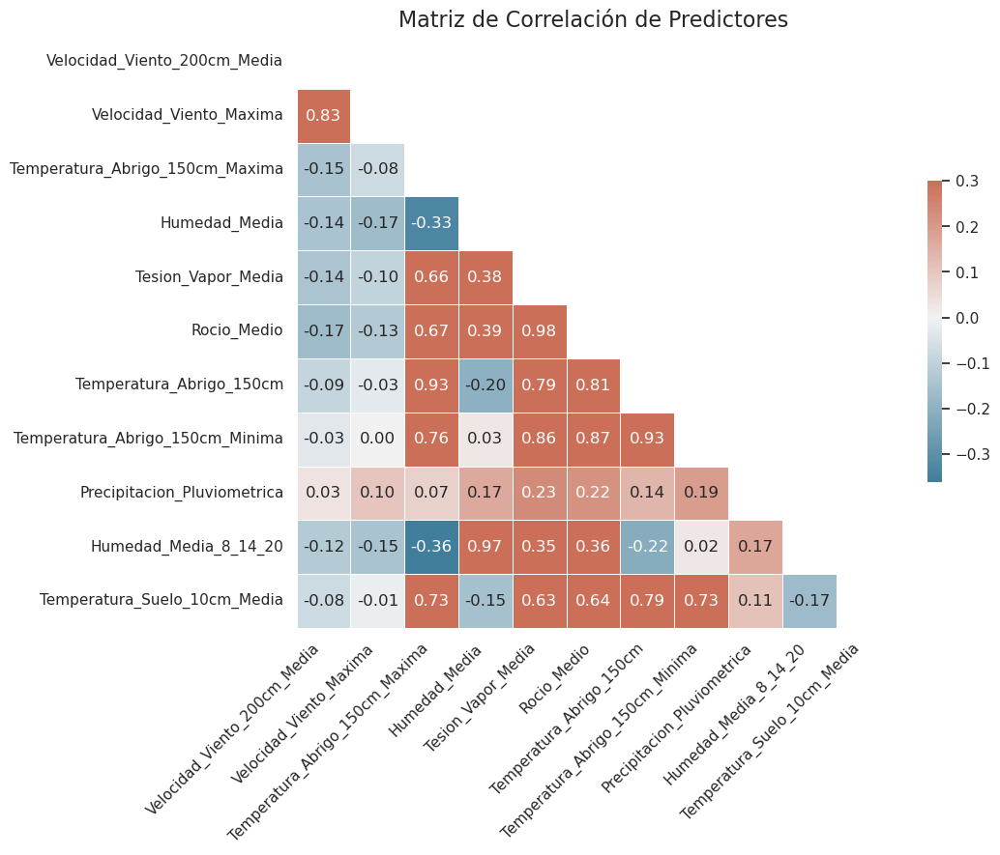

In [137]:
ver_correlacion(matriz_correlacion)

La humedad media tiene un grado de correlación muy alto con la humedad_media_8_14_20 , por lo que vamos a tomar una sola de estas variables para el analisis y de ser posible y necesario completaremos la misma con los  valores de la variable Humedad_Media

In [143]:
# Evaluamos los registros de Humedad Media 8 14 20 no nulos mientras Humedad Media  es nula
df_corto[(~df_corto['Humedad_Media_8_14_20'].isnull()) & (df_corto['Humedad_Media'].isnull()) ]

,Fecha,Humedad_Media,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Temperatura_Suelo_10cm_Media,Humedad_Media_8_14_20,Velocidad_Viento_Maxima,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Provincia,Localidad,Latitud,Longitud
70,2020-01-29,NaN,NaN,NaN,NaN,NaN,25.0,NaN,NaN,25.2,NaN,29.4,Buenos Aires,Hurlingham,-85.000000,-60.000000
154,2020-10-23,NaN,NaN,NaN,NaN,NaN,88.0,NaN,NaN,NaN,NaN,NaN,Buenos Aires,Hurlingham,-85.000000,-60.000000
365,2021-05-23,NaN,NaN,NaN,NaN,NaN,90.0,NaN,NaN,NaN,NaN,NaN,Buenos Aires,Hurlingham,-85.000000,-60.000000
430,2021-07-27,NaN,NaN,NaN,NaN,NaN,65.0,NaN,NaN,NaN,NaN,NaN,Buenos Aires,Hurlingham,-85.000000,-60.000000
431,2021-07-28,NaN,NaN,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,Buenos Aires,Hurlingham,-85.000000,-60.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2517,2023-07-14,NaN,NaN,NaN,NaN,NaN,79.0,NaN,NaN,NaN,NaN,NaN,Santiago del Estero,Monte Quemado,-25.858227,-62.707943
2529,2023-07-26,NaN,NaN,NaN,0.0,NaN,66.0,NaN,NaN,NaN,NaN,NaN,Santiago del Estero,Monte Quemado,-25.858227,-62.707943
2709,2024-01-22,NaN,NaN,NaN,0.0,NaN,60.0,NaN,NaN,NaN,NaN,NaN,Santiago del Estero,Monte Quemado,-25.858227,-62.707943
2723,2024-02-06,NaN,NaN,NaN,0.0,NaN,61.0,NaN,NaN,NaN,NaN,NaN,Santiago del Estero,Monte Quemado,-25.858227,-62.707943


In [139]:
# Evaluamos los registros de Humedad Media 8 14 20 nulos mientras Humedad Media no es nula
df_corto[(df_corto['Humedad_Media_8_14_20'].isnull()) & (~df_corto['Humedad_Media'].isnull()) ]

,Fecha,Humedad_Media,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Temperatura_Suelo_10cm_Media,Humedad_Media_8_14_20,Velocidad_Viento_Maxima,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Provincia,Localidad,Latitud,Longitud
159,2020-10-28,63.0,13.463210,11.37482,NaN,NaN,NaN,14.3,18.86231,NaN,NaN,NaN,Buenos Aires,Hurlingham,-85.000000,-60.000000
535,2021-11-15,74.0,19.674630,17.08098,NaN,NaN,NaN,24.6,21.59214,12.1,4.755001,30.1,Buenos Aires,Hurlingham,-85.000000,-60.000000
1048,2023-04-12,92.0,16.734340,14.61217,NaN,NaN,NaN,13.1,17.51888,12.8,4.244055,25.9,Buenos Aires,Hurlingham,-85.000000,-60.000000
144,2018-11-13,1.0,0.479931,NaN,NaN,24.90000,NaN,NaN,24.23333,21.0,NaN,26.4,Corrientes,Santo Tome,-28.268801,-55.862801
148,2018-11-17,2.0,0.465986,NaN,NaN,23.50000,NaN,NaN,21.46945,20.1,NaN,23.0,Corrientes,Santo Tome,-28.268801,-55.862801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2966,2024-11-05,0.0,NaN,NaN,3.00,25.93889,NaN,24.8,21.25625,18.5,6.649309,29.4,Santiago del Estero,Monte Quemado,-25.858227,-62.707943
2979,2024-11-18,1.0,0.261300,NaN,35.50,27.33958,NaN,2.0,19.79236,17.4,0.355556,25.8,Santiago del Estero,Monte Quemado,-25.858227,-62.707943
2980,2024-11-19,0.0,NaN,NaN,0.75,24.52707,NaN,1.7,19.82014,17.7,0.374305,23.4,Santiago del Estero,Monte Quemado,-25.858227,-62.707943
2981,2024-11-20,0.0,NaN,NaN,1.00,24.73263,NaN,0.6,21.35279,19.8,0.331944,23.5,Santiago del Estero,Monte Quemado,-25.858227,-62.707943


In [141]:
# Evaluamos el comportamiento estadistico de ambas variables
df_corto[(~df_corto['Humedad_Media_8_14_20'].isnull()) & (~df_corto['Humedad_Media'].isnull()) ][['Humedad_Media_8_14_20','Humedad_Media']].describe()

,Humedad_Media_8_14_20,Humedad_Media
count,271357.000000,271357.000000
mean,65.714321,69.278180
std,19.909692,18.520468
min,0.000000,0.000000
25%,52.000000,57.000000
50%,67.000000,71.000000
75%,81.000000,83.000000
max,100.000000,100.000000


In [ ]:
# La escala y valores de ambas caracteristicas es muy similar en los registros, por lo que vamos a realizar una asignacion directa de una variable a otra para los valores faltantes en vez de desarrollar una regresion para predecir los valores

In [145]:
# Le asignamos los valores disponibles en Humedad_Media a Humedad_Media_8_14_20
condicion = df_corto['Humedad_Media_8_14_20'].isnull() & (~df_corto['Humedad_Media'].isnull())
df_corto.loc[condicion, 'Humedad_Media_8_14_20'] = df_corto.loc[condicion, 'Humedad_Media']

In [147]:
# Verificamos que no queden valores de Humedad_Media_8_14_20 null que puedan ser asignados por Humedad_Media
df_corto[(df_corto['Humedad_Media_8_14_20'].isnull()) & (~df_corto['Humedad_Media'].isnull()) ]

,Fecha,Humedad_Media,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Temperatura_Suelo_10cm_Media,Humedad_Media_8_14_20,Velocidad_Viento_Maxima,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Provincia,Localidad,Latitud,Longitud


In [149]:
df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 618194 entries, 0 to 2987
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            618194 non-null  datetime64[ns]
 1   Humedad_Media                    278459 non-null  float64       
 2   Tesion_Vapor_Media               559677 non-null  float64       
 3   Rocio_Medio                      547288 non-null  float64       
 4   Precipitacion_Pluviometrica      573069 non-null  float64       
 5   Temperatura_Suelo_10cm_Media     272896 non-null  float64       
 6   Humedad_Media_8_14_20            572357 non-null  float64       
 7   Velocidad_Viento_Maxima          109980 non-null  float64       
 8   Temperatura_Abrigo_150cm         576332 non-null  float64       
 9   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 10  Velocidad_Viento_200cm_Media     389930 non-null  f

In [151]:
# Redefinimos las variables de interes quitando la humedad_media
df_corto = df_corto.drop(columns=['Humedad_Media'])


In [153]:
# Eliminamos los registros que tengan nulos en todas estas variables
columnas_a_evaluar = [
    'Tesion_Vapor_Media',
    'Rocio_Medio',
    'Precipitacion_Pluviometrica',
    'Temperatura_Suelo_10cm_Media',
    'Humedad_Media_8_14_20',
    'Velocidad_Viento_Maxima',
    'Temperatura_Abrigo_150cm',
    'Temperatura_Abrigo_150cm_Minima',
    'Velocidad_Viento_200cm_Media',
    'Temperatura_Abrigo_150cm_Maxima'
]

# Crear una máscara booleana para filas con nulos en TODAS las columnas
mascara_nulos_en_todas = df_corto[columnas_a_evaluar].isnull().all(axis=1)

# Eliminar las filas que cumplen la condición (tienen nulos en TODAS las columnas)
df_corto = df_corto[~mascara_nulos_en_todas]


print(df_corto.info())

<class 'pandas.core.frame.DataFrame'>
Index: 591877 entries, 70 to 2986
Data columns (total 15 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            591877 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               559677 non-null  float64       
 2   Rocio_Medio                      547288 non-null  float64       
 3   Precipitacion_Pluviometrica      573069 non-null  float64       
 4   Temperatura_Suelo_10cm_Media     272896 non-null  float64       
 5   Humedad_Media_8_14_20            572357 non-null  float64       
 6   Velocidad_Viento_Maxima          109980 non-null  float64       
 7   Temperatura_Abrigo_150cm         576332 non-null  float64       
 8   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 9   Velocidad_Viento_200cm_Media     389930 non-null  float64       
 10  Temperatura_Abrigo_150cm_Maxima  578137 non-null  

In [155]:
# Evaluamos la distribución de nulos en la Humedad por provincia
for provincia in provincias:
    print(f"{provincia} Nulos en Humedad Media 8 14 20: {df_corto[df_corto['Provincia']==provincia]['Humedad_Media_8_14_20'].isnull().sum()} sobre {df_corto[df_corto['Provincia']==provincia]['Humedad_Media_8_14_20'].shape[0]} registros")

Buenos Aires Nulos en Humedad Media 8 14 20: 5623 sobre 208890 registros
Corrientes Nulos en Humedad Media 8 14 20: 807 sobre 58657 registros
Chubut Nulos en Humedad Media 8 14 20: 103 sobre 10562 registros
Córdoba Nulos en Humedad Media 8 14 20: 4268 sobre 42321 registros
La Pampa Nulos en Humedad Media 8 14 20: 1684 sobre 22982 registros
Entre Rios Nulos en Humedad Media 8 14 20: 1654 sobre 40399 registros
La Rioja Nulos en Humedad Media 8 14 20: 41 sobre 6780 registros
Santiago del Estero Nulos en Humedad Media 8 14 20: 1546 sobre 30429 registros
Mendoza Nulos en Humedad Media 8 14 20: 75 sobre 18596 registros
Santa Fe Nulos en Humedad Media 8 14 20: 3470 sobre 81509 registros
Misiones Nulos en Humedad Media 8 14 20: 64 sobre 35992 registros
Tierra del Fuego Nulos en Humedad Media 8 14 20: 2 sobre 3108 registros
Río Negro Nulos en Humedad Media 8 14 20: 100 sobre 10855 registros
Catamarca Nulos en Humedad Media 8 14 20: 3 sobre 3428 registros
Neuquen Nulos en Humedad Media 8 14 20: 

In [157]:
def visualizar_nulos(serie):
    """Visualiza la ubicación de los valores nulos en una serie."""
    nulos = serie.isnull()
    plt.figure(figsize=(12, 4))
    plt.plot(nulos, marker='|', linestyle='None')
    plt.title('Ubicación de valores nulos')
    plt.xlabel('Índice')
    plt.ylabel('Nulo')
    plt.yticks([0, 1], ['No Nulo', 'Nulo'])
    plt.show()




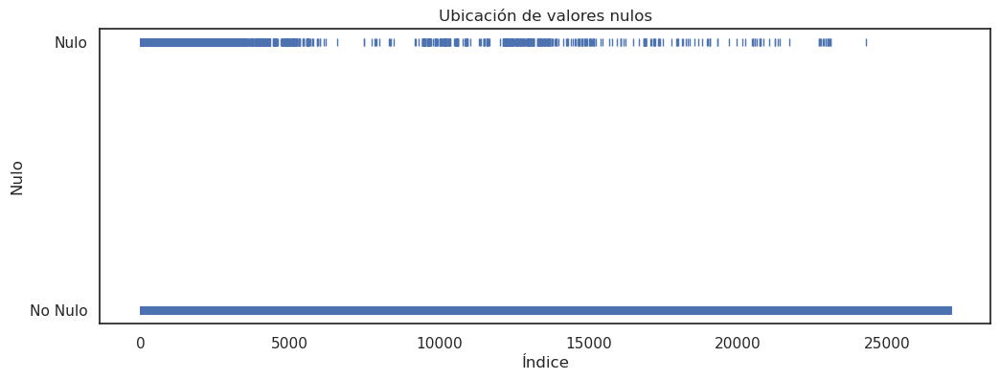

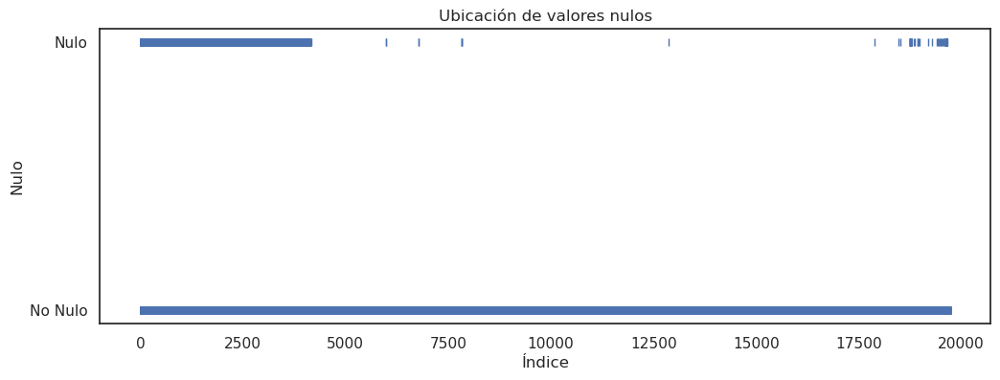

In [161]:
# Vamos a ver graficamente la distribución de nulos en las principales prinvicias
visualizar_nulos(df_corto[df_corto['Provincia']=='Buenos Aires']['Humedad_Media_8_14_20'])
visualizar_nulos(df_corto[df_corto['Provincia']=='Córdoba']['Humedad_Media_8_14_20'])

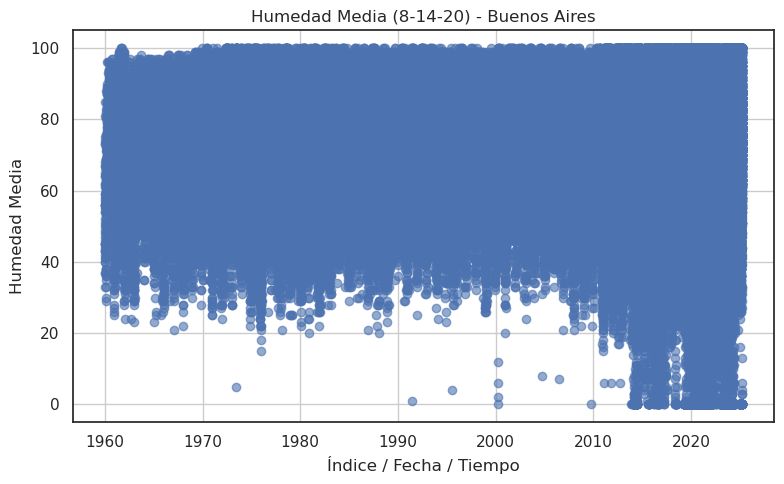

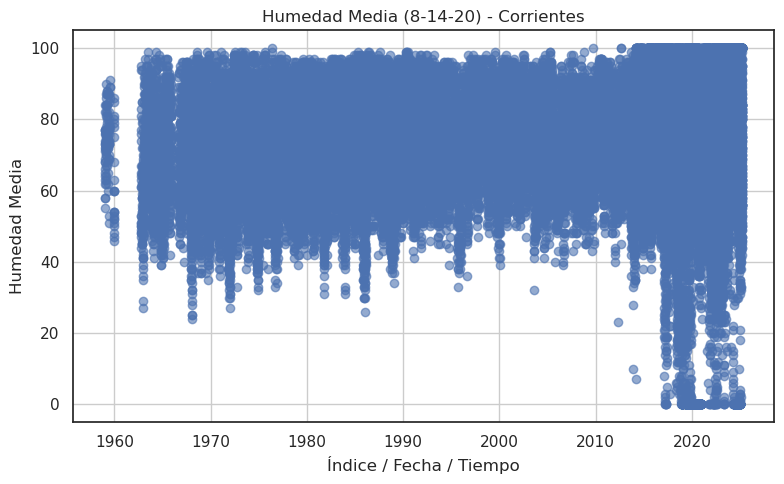

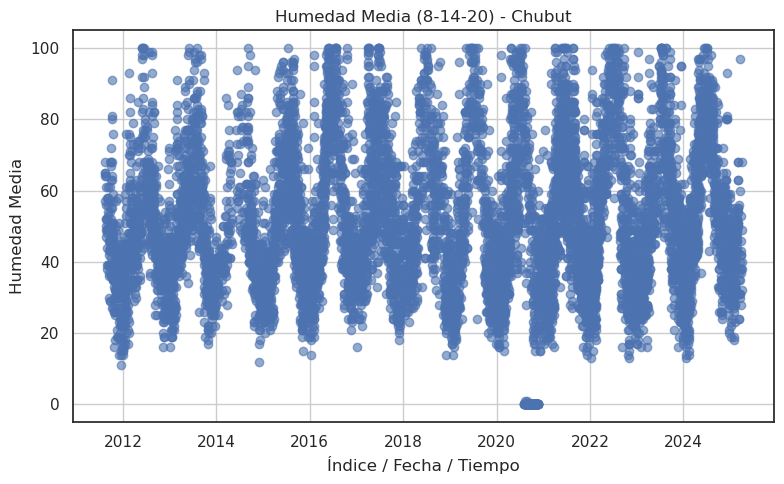

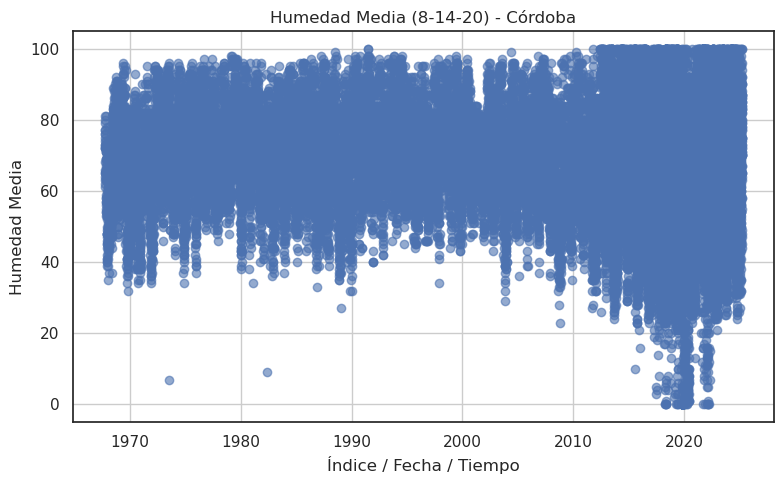

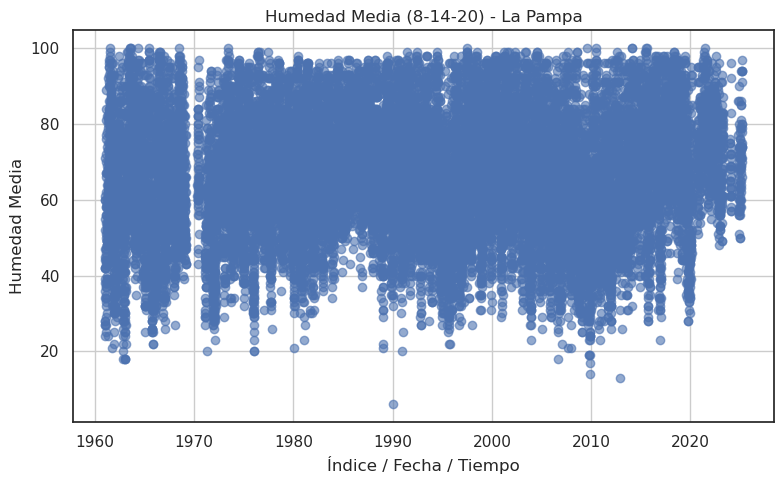

...

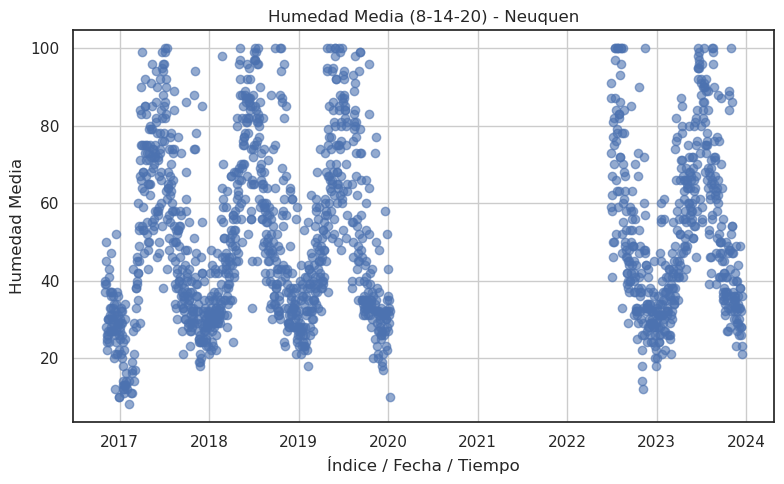

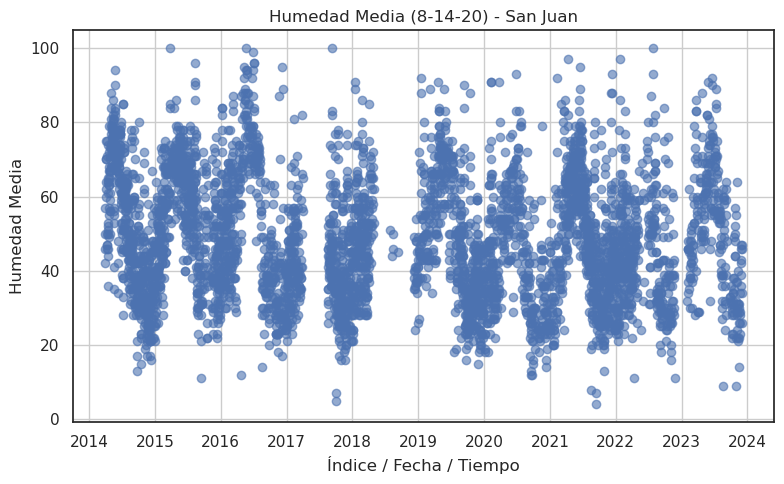

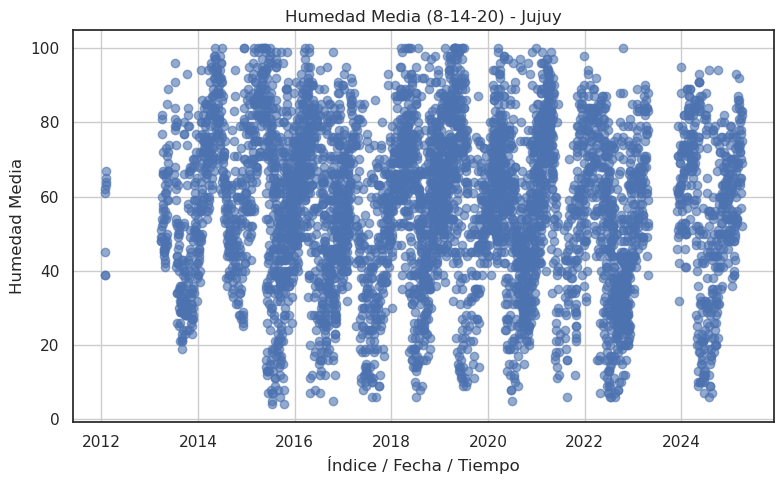

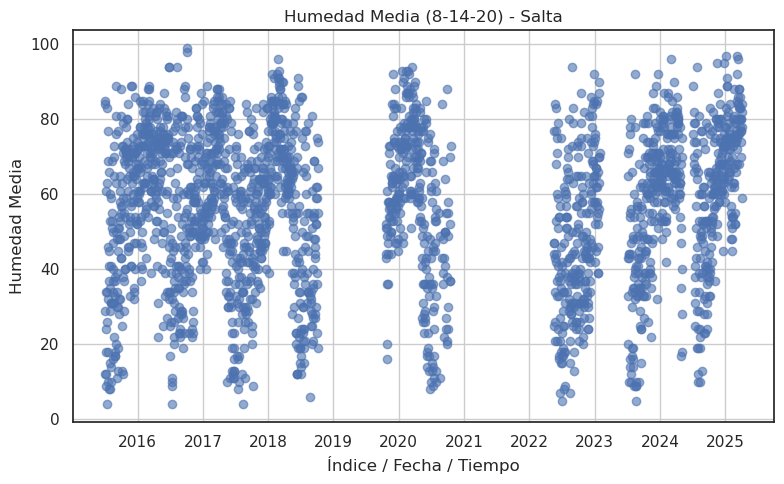

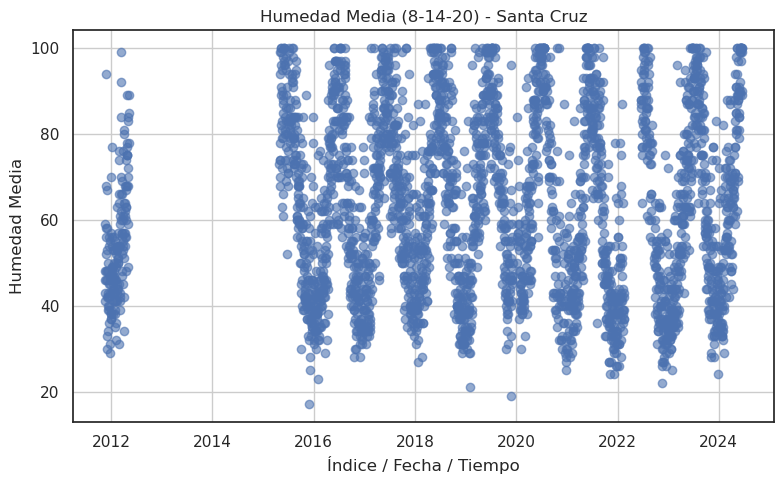

In [163]:
# Distribución de valores de humedad media en el tiempo por provincia
for provincia in provincias:
    datos = df_corto[df_corto['Provincia'] == provincia]
    
    plt.figure(figsize=(8, 5))
    plt.scatter(datos['Fecha'], datos['Humedad_Media_8_14_20'], alpha=0.6)
    plt.title(f'Humedad Media (8-14-20) - {provincia}')
    plt.xlabel('Índice / Fecha / Tiempo')
    plt.ylabel('Humedad Media')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

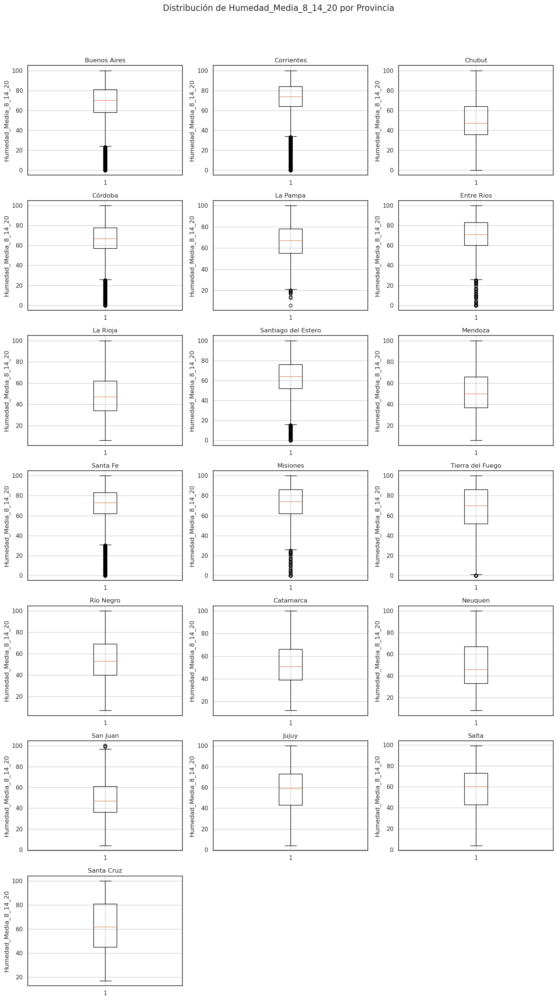

In [165]:
# Realizamos una muestra de boxplots por provincia por Humedad Media 8 14 20



plot_por_provincia_total(provincias,df_corto,'Humedad_Media_8_14_20')


In [169]:
# Vamos a reformatear el campo Fecha para poder crear nuevas agrupaciones
# Eliminar la hora en formato HH:MM:SS
patron = r'\d{2}:\d{2}:\d{2}'
df_corto['Fecha'] = df_corto['Fecha'].astype(str)

df_corto['Fecha'] = df_corto['Fecha'].str.replace(patron, "", regex=True)

# Eliminar espacios extra en cada string (aplicado correctamente con .str)
df_corto['Fecha'] = df_corto['Fecha'].str.strip()

# Convertir a datetime
df_corto['Fecha'] = pd.to_datetime(df_corto['Fecha'], format='%Y-%m-%d', errors='coerce')



In [171]:
# Creamos el campo MES
df_corto['MES'] = df_corto['Fecha'].dt.month

In [173]:
# Obtenemos el valor medio mensual de humedad por provincia para completar los valores faltantes
# Tomamos el valor medio mensual para el analisis debido a que el clima sigue patrones de series de tiempo regulares

# Creamos un diccionario para registrar la media mensual por provincia
dic_prov_humedad_media = {}

# Asignamos a dicho diccionario la agrupacion mensual de la humedad_media_8_14_20 media
for provincia in provincias:
    dic_prov_humedad_media[provincia] = df_corto[df_corto['Provincia'] == provincia].groupby('MES')['Humedad_Media_8_14_20'].mean().to_list()



In [175]:
# Iteramos por cada provincia, por cada mes y asignamos el valor obtenido en el proceso anterior
for provincia in provincias:
    for mes in range(1, 13):  # Iteramos sobre los meses (1 a 12)
        valor_medio = dic_prov_humedad_media[provincia][mes - 1]  # Obtenemos el valor medio del mes correspondiente
        df_corto.loc[(df_corto['Provincia'] == provincia) & (df_corto['MES'] == mes) & (df_corto['Humedad_Media_8_14_20'].isnull()), 'Humedad_Media_8_14_20'] = valor_medio



In [177]:
df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 591877 entries, 70 to 2986
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            591877 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               559677 non-null  float64       
 2   Rocio_Medio                      547288 non-null  float64       
 3   Precipitacion_Pluviometrica      573069 non-null  float64       
 4   Temperatura_Suelo_10cm_Media     272896 non-null  float64       
 5   Humedad_Media_8_14_20            591877 non-null  float64       
 6   Velocidad_Viento_Maxima          109980 non-null  float64       
 7   Temperatura_Abrigo_150cm         576332 non-null  float64       
 8   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 9   Velocidad_Viento_200cm_Media     389930 non-null  float64       
 10  Temperatura_Abrigo_150cm_Maxima  578137 non-null  

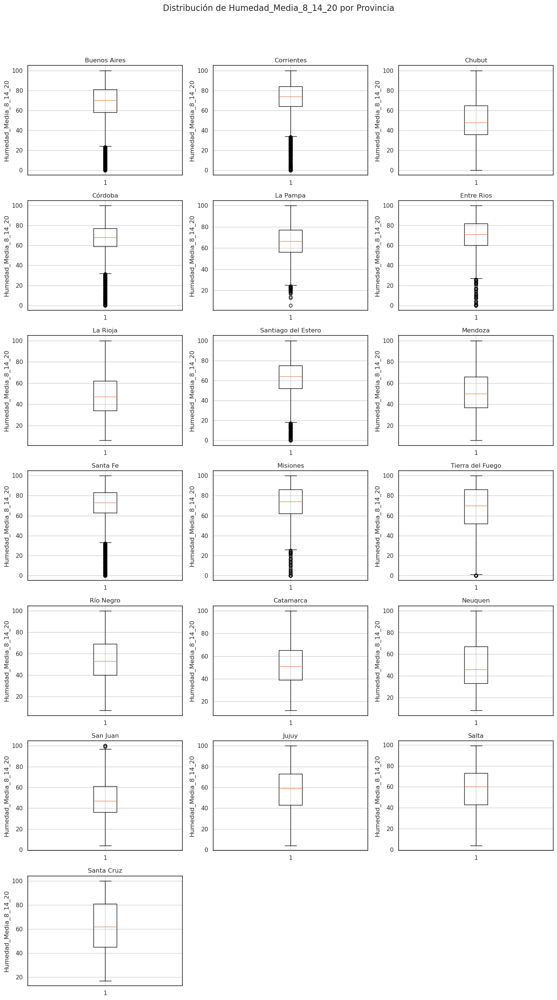

In [179]:
# Volvemos a verificar como queda la distrinución
plot_por_provincia_total(provincias,df_corto,'Humedad_Media_8_14_20')


In [181]:
# Asignamos los valores faltantes/nulos como media de las siguientes variables
df_corto = completar_valores_medios(df_corto,'Tesion_Vapor_Media',provincias)
df_corto = completar_valores_medios(df_corto,'Rocio_Medio',provincias)
df_corto = completar_valores_medios(df_corto,'Velocidad_Viento_200cm_Media',provincias)
df_corto = completar_valores_medios(df_corto,'Precipitacion_Pluviometrica',provincias)


In [183]:
df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 591877 entries, 70 to 2986
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            591877 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               591877 non-null  float64       
 2   Rocio_Medio                      591877 non-null  float64       
 3   Precipitacion_Pluviometrica      591877 non-null  float64       
 4   Temperatura_Suelo_10cm_Media     272896 non-null  float64       
 5   Humedad_Media_8_14_20            591877 non-null  float64       
 6   Velocidad_Viento_Maxima          109980 non-null  float64       
 7   Temperatura_Abrigo_150cm         576332 non-null  float64       
 8   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 9   Velocidad_Viento_200cm_Media     550582 non-null  float64       
 10  Temperatura_Abrigo_150cm_Maxima  578137 non-null  

In [185]:

df_corto[['Temperatura_Abrigo_150cm','Temperatura_Abrigo_150cm_Minima','Temperatura_Abrigo_150cm_Maxima','Temperatura_Suelo_10cm_Media']].corr()

,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Temperatura_Abrigo_150cm_Maxima,Temperatura_Suelo_10cm_Media
Temperatura_Abrigo_150cm,1.000000,0.931235,0.930046,0.744950
Temperatura_Abrigo_150cm_Minima,0.931235,1.000000,0.750055,0.665945
Temperatura_Abrigo_150cm_Maxima,0.930046,0.750055,1.000000,0.682950
Temperatura_Suelo_10cm_Media,0.744950,0.665945,0.682950,1.000000


In [187]:
df_corto[['Temperatura_Abrigo_150cm','Temperatura_Abrigo_150cm_Minima','Temperatura_Abrigo_150cm_Maxima','Temperatura_Suelo_10cm_Media']].dropna().corr()

,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Temperatura_Abrigo_150cm_Maxima,Temperatura_Suelo_10cm_Media
Temperatura_Abrigo_150cm,1.000000,0.925297,0.928844,0.745603
Temperatura_Abrigo_150cm_Minima,0.925297,1.000000,0.748598,0.687381
Temperatura_Abrigo_150cm_Maxima,0.928844,0.748598,1.000000,0.690074
Temperatura_Suelo_10cm_Media,0.745603,0.687381,0.690074,1.000000


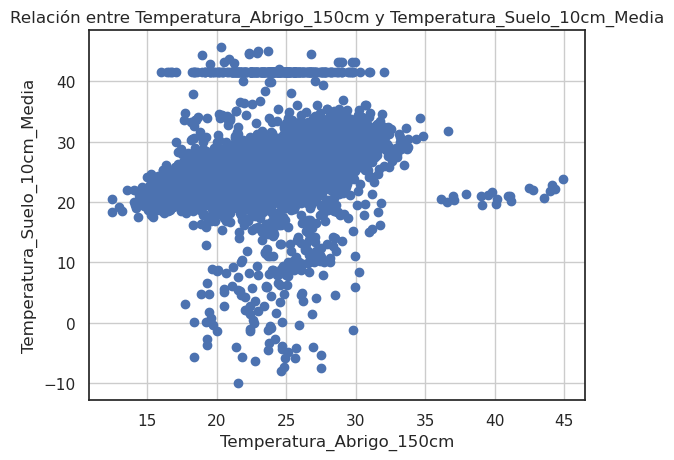

In [189]:
# Variables
variables_predictoras = 'Temperatura_Abrigo_150cm'
variable_objetivo = 'Temperatura_Suelo_10cm_Media'

# Eliminar nulos
df_filtrado = df_corto[(df_corto['Provincia']=='Buenos Aires') & (df_corto['MES']==1) ].dropna(subset=[variables_predictoras, variable_objetivo])

# Seleccionar columnas
X = df_filtrado[variables_predictoras]
y = df_filtrado[variable_objetivo]


# Graficar
plt.scatter(X, y)
plt.xlabel(variables_predictoras)
plt.ylabel(variable_objetivo)
plt.title('Relación entre ' + variables_predictoras + ' y ' + variable_objetivo)
plt.grid(True)
plt.show()

Error Cuadrático Medio (MSE): 36.06358635072409
Coeficiente de Determinación (R2): 0.4333533762783027


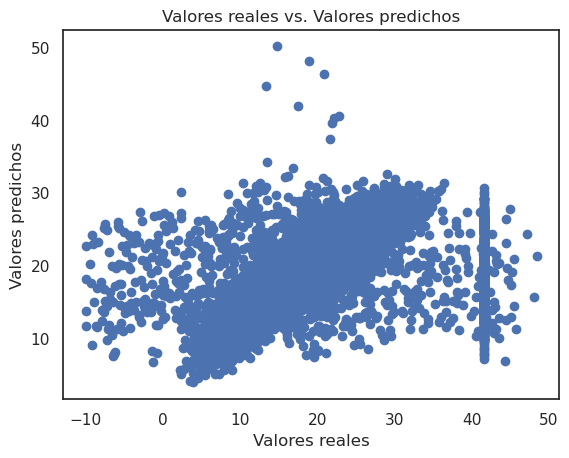

In [192]:
#Vamos a completar los datos faltantes de Temperatura Suelo a 10cm media, como faltan tantos valores vamos a intentar 
#aprovechar que las otras temperaturas tienen una correlacion aceptable e intentaremos hacer un regresor

variables_predictoras = [
    'Temperatura_Abrigo_150cm',
    'Temperatura_Abrigo_150cm_Minima',
    'Temperatura_Abrigo_150cm_Maxima'
                        ]

variable_objetivo = 'Temperatura_Suelo_10cm_Media'

prov="Buenos Aires"

modelo_bsas = regresion_lineal_provincial(df_corto ,prov,variables_predictoras,variable_objetivo)

Error Cuadrático Medio (MSE): 22.35310483703105
Coeficiente de Determinación (R2): 0.1510719293202637


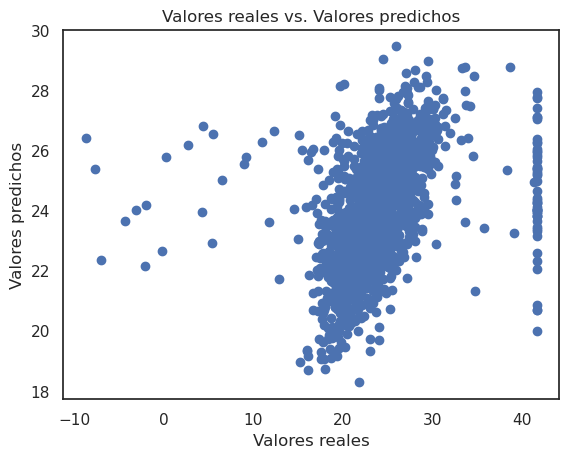

In [194]:

variables_predictoras = [
    'Temperatura_Abrigo_150cm',
    'Temperatura_Abrigo_150cm_Minima',
    'Temperatura_Abrigo_150cm_Maxima'
                        ]

variable_objetivo = 'Temperatura_Suelo_10cm_Media'

prov="Buenos Aires"

modelo_bsas = regresion_lineal_provincial_mensual(df_corto ,prov,variables_predictoras,variable_objetivo,12)

Vemos un valor de predicción bastante malo, intentaremos otra forma de regresión

Error Cuadrático Medio (MSE): 37.73698143305568
Coeficiente de Determinación (R2): 0.4127262158729992


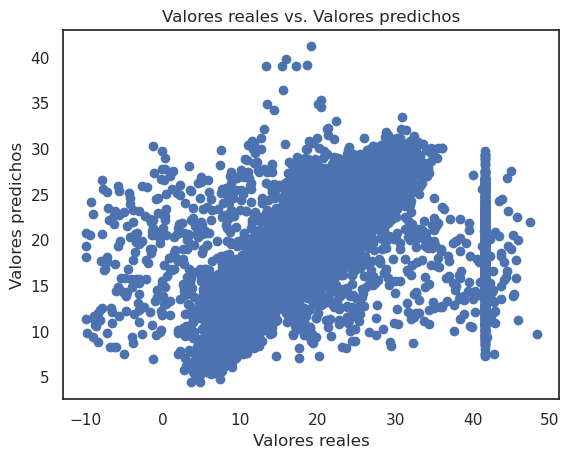

In [197]:
# Repetimos quitando las variables con menor correlacion y ejecutamos sobre todo el set de datos


variables_predictoras = [
    'Temperatura_Abrigo_150cm'
]

variable_objetivo = 'Temperatura_Suelo_10cm_Media'


prov="Buenos Aires"

modelo_bsas = regresion_lineal_provincial(df_corto ,prov,variables_predictoras,variable_objetivo)

Si bien logramos mejorar los resultados, siguen siendo muy bajos para que tenga sentido utilizar un regresor

In [199]:
# Los valores siguen siendo bajos por lo que vamos a utilizar directamente el valor medio estacional
df_corto = completar_valores_medios(df_corto,'Temperatura_Suelo_10cm_Media',provincias)

In [201]:
df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 591877 entries, 70 to 2986
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            591877 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               591877 non-null  float64       
 2   Rocio_Medio                      591877 non-null  float64       
 3   Precipitacion_Pluviometrica      591877 non-null  float64       
 4   Temperatura_Suelo_10cm_Media     591877 non-null  float64       
 5   Humedad_Media_8_14_20            591877 non-null  float64       
 6   Velocidad_Viento_Maxima          109980 non-null  float64       
 7   Temperatura_Abrigo_150cm         576332 non-null  float64       
 8   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 9   Velocidad_Viento_200cm_Media     550582 non-null  float64       
 10  Temperatura_Abrigo_150cm_Maxima  578137 non-null  

In [203]:
# Avanzamos con la variable Precipitacion_Pluviometrica, para esto realizamos una inspeccion de sus estadisticos
df_corto['Precipitacion_Pluviometrica'].describe()

count    591877.000000
mean          2.382276
std           9.166343
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         441.250000
Name: Precipitacion_Pluviometrica, dtype: float64

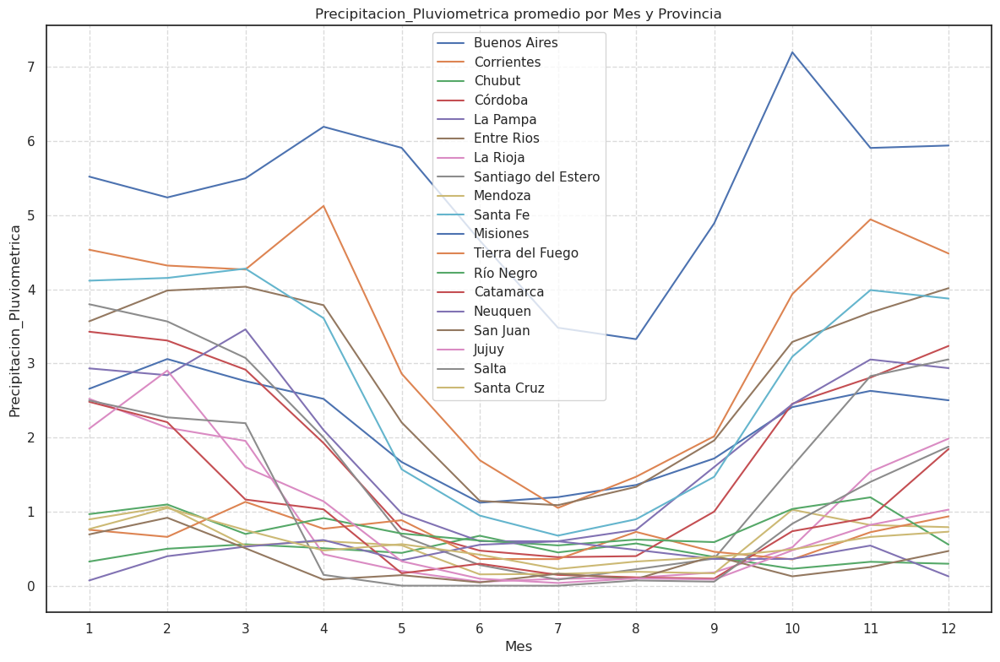

In [205]:
plot_por_provincia_mensual(provincias,df_corto,'Precipitacion_Pluviometrica')


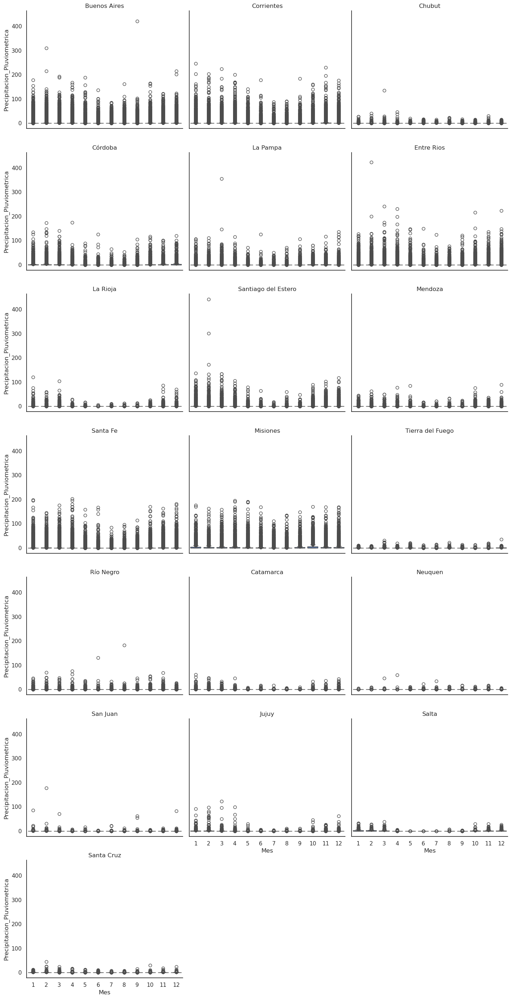

In [207]:

crear_boxplot_grid(df_corto, 'Provincia', 'MES', 'Precipitacion_Pluviometrica')



In [ ]:
# El evento lluvia sigue siendo atipico , sobre todo en los meses mas lluviosos, en los menos lluviosos es menor el indice de valores oultiers
# La matriz de correlacion no mostro ninguna correlacion lineal entre la lluvia y otras variables, por lo que vamos a tomar la normal mensual para completar los regisros.



In [209]:
# Completamos los NA de Precipitacion_Pluviometrica usando su valor normal mensua
df_corto = completar_valores_normal(df_corto,'Precipitacion_Pluviometrica',provincias)

In [211]:
df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 591877 entries, 70 to 2986
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            591877 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               591877 non-null  float64       
 2   Rocio_Medio                      591877 non-null  float64       
 3   Precipitacion_Pluviometrica      591877 non-null  float64       
 4   Temperatura_Suelo_10cm_Media     591877 non-null  float64       
 5   Humedad_Media_8_14_20            591877 non-null  float64       
 6   Velocidad_Viento_Maxima          109980 non-null  float64       
 7   Temperatura_Abrigo_150cm         576332 non-null  float64       
 8   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 9   Velocidad_Viento_200cm_Media     550582 non-null  float64       
 10  Temperatura_Abrigo_150cm_Maxima  578137 non-null  

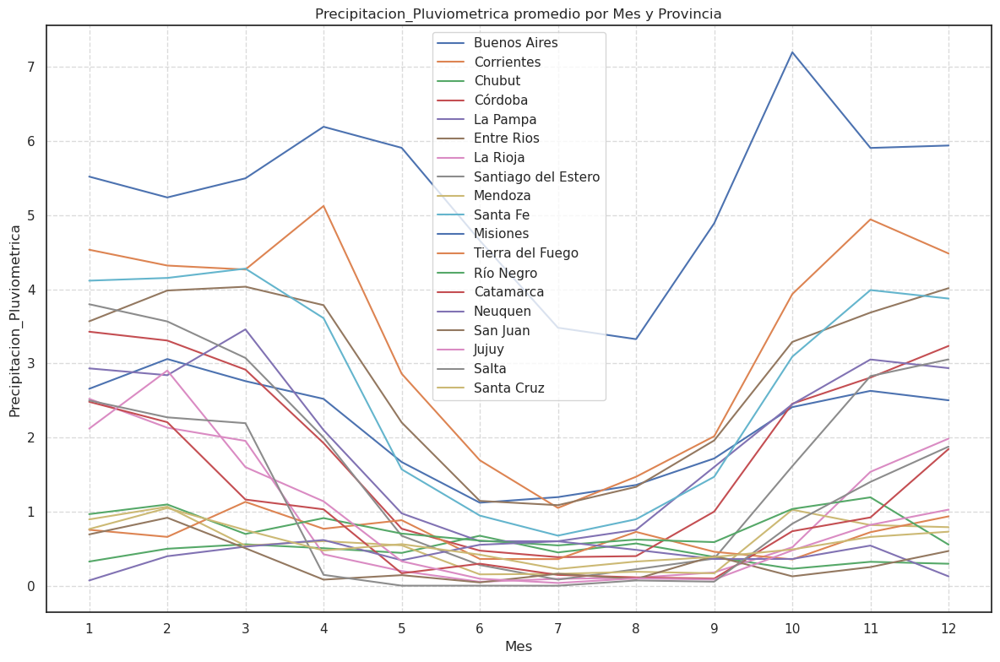

In [213]:
plot_por_provincia_mensual(provincias,df_corto,'Precipitacion_Pluviometrica')


In [215]:
# Comenzamos a analizar la Velocidad_Viento_Maxima , corroboramos sus estadisticos
df_corto["Velocidad_Viento_Maxima"].describe()

count    109980.000000
mean         24.871724
std          13.041879
min           0.000000
25%          17.200000
50%          23.300000
75%          31.200000
max         215.900000
Name: Velocidad_Viento_Maxima, dtype: float64

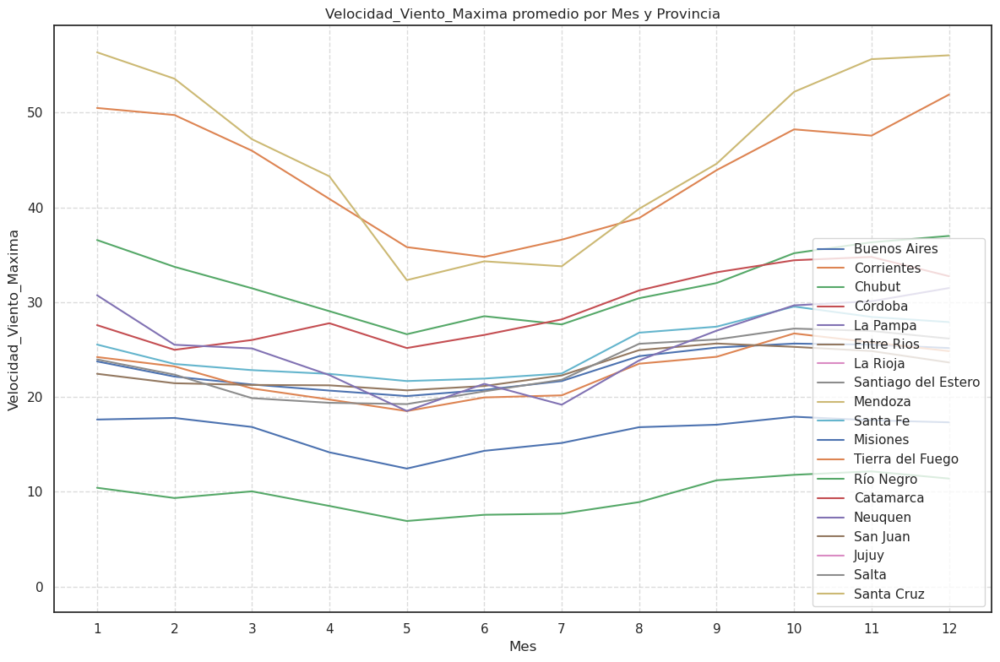

In [217]:
plot_por_provincia_mensual(provincias,df_corto,'Velocidad_Viento_Maxima')

Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length


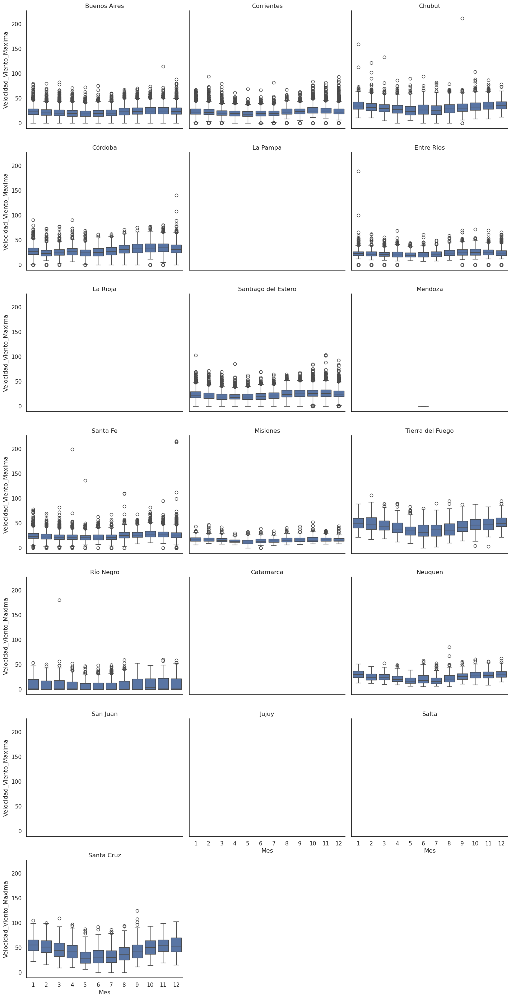

In [219]:
crear_boxplot_grid(df_corto, 'Provincia', 'MES', 'Velocidad_Viento_Maxima')

Pareceria que hay varias provincias que no tienen datos historicos sobre la velocidad de viento maxima

In [221]:
# Vamos a realizar un control mas simple sobre la cantidad de registros por mes por Provincia
conteo_por_mes_provincia = df_corto.groupby(['Provincia', 'MES'])['Velocidad_Viento_Maxima'].count().reset_index(name='conteo')

for provincia in provincias:
    print(conteo_por_mes_provincia[conteo_por_mes_provincia['Provincia']==provincia])


       Provincia  MES  conteo
0   Buenos Aires    1    2845
1   Buenos Aires    2    2568
2   Buenos Aires    3    2835
3   Buenos Aires    4    2496
4   Buenos Aires    5    2336
5   Buenos Aires    6    2255
6   Buenos Aires    7    2361
7   Buenos Aires    8    2455
8   Buenos Aires    9    2636
9   Buenos Aires   10    2865
10  Buenos Aires   11    2875
11  Buenos Aires   12    2876
     Provincia  MES  conteo
36  Corrientes    1    1390
37  Corrientes    2    1166
38  Corrientes    3    1167
39  Corrientes    4    1031
40  Corrientes    5    1030
41  Corrientes    6    1112
42  Corrientes    7    1322
43  Corrientes    8    1354
44  Corrientes    9    1386
45  Corrientes   10    1448
46  Corrientes   11    1364
47  Corrientes   12    1402
   Provincia  MES  conteo
24    Chubut    1     822
25    Chubut    2     784
26    Chubut    3     753
27    Chubut    4     724
28    Chubut    5     632
29    Chubut    6     550
30    Chubut    7     578
31    Chubut    8     633
32    Chubut

In [223]:
# Si bien podriamos intentar generar artificialmente valores para las provincias que no tengan registros, no podemos hacerlo con mecanismos de aprendizaje supervizado, lo que nos llevaria a no tener una buena metrica para evaluar el resultado.
# Por lo que vamos a completar los valores de las provincias que tenemos registros y esperar poder conseguir en un futuro registros desde otra base de datos.

# Completamos los valores na con el valor normal entre ellos
df_corto = completar_valores_normal(df_corto,'Velocidad_Viento_Maxima',provincias)
df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 591877 entries, 70 to 2986
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            591877 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               591877 non-null  float64       
 2   Rocio_Medio                      591877 non-null  float64       
 3   Precipitacion_Pluviometrica      591877 non-null  float64       
 4   Temperatura_Suelo_10cm_Media     591877 non-null  float64       
 5   Humedad_Media_8_14_20            591877 non-null  float64       
 6   Velocidad_Viento_Maxima          529023 non-null  float64       
 7   Temperatura_Abrigo_150cm         576332 non-null  float64       
 8   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 9   Velocidad_Viento_200cm_Media     550582 non-null  float64       
 10  Temperatura_Abrigo_150cm_Maxima  578137 non-null  

Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length
Error en boxplot: List of boxplot statistics and `positions` values must have same the length


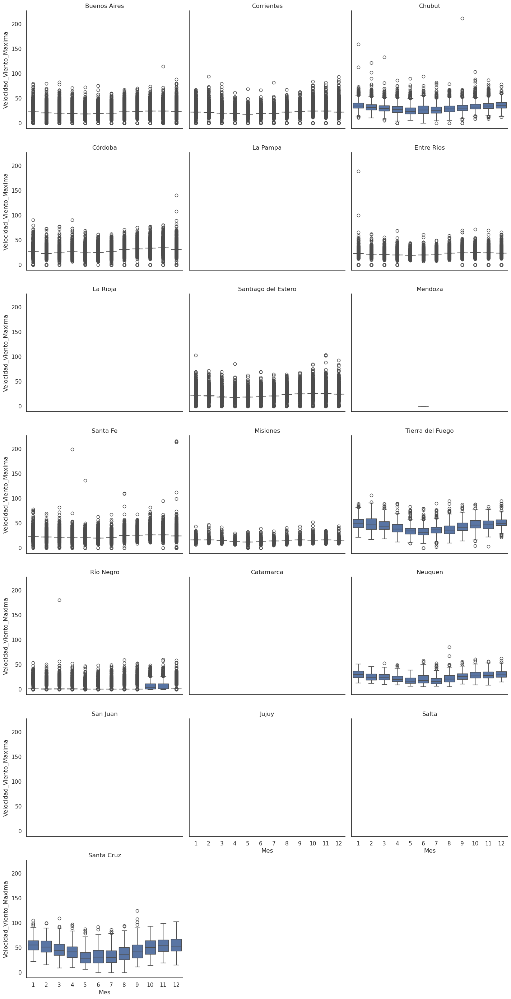

In [225]:
crear_boxplot_grid(df_corto, 'Provincia', 'MES', 'Velocidad_Viento_Maxima')

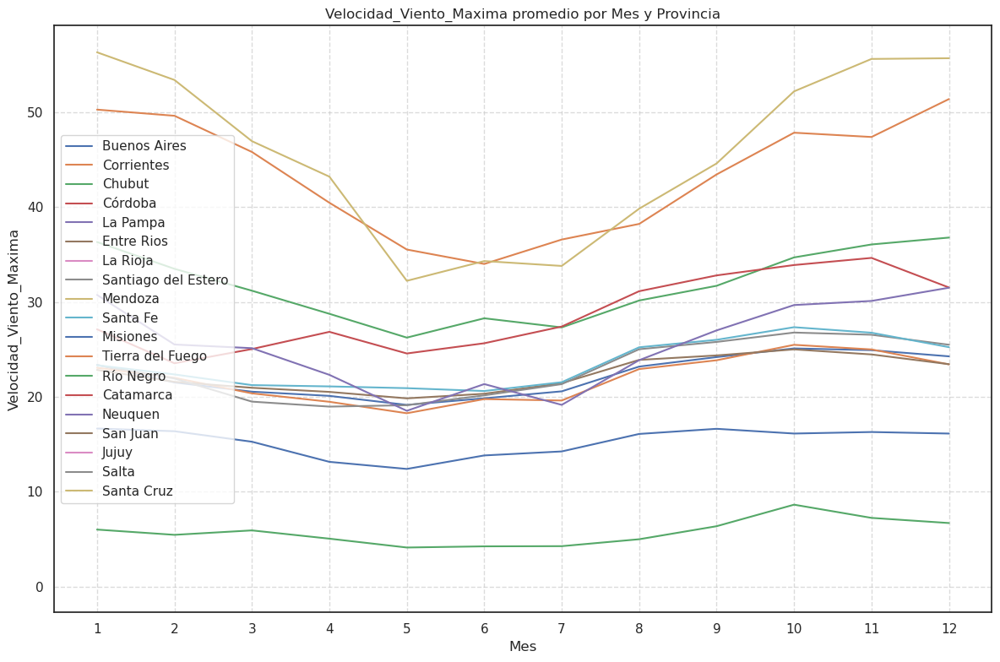

In [227]:
plot_por_provincia_mensual(provincias,df_corto,'Velocidad_Viento_Maxima')

In [229]:
# Avanzamos con la reconstruccion de registros de las Temperaturas de Abrigo, para esto analizamos la correlacion entre ellas
df_corto[['Temperatura_Abrigo_150cm','Temperatura_Abrigo_150cm_Minima','Temperatura_Abrigo_150cm_Maxima']].corr()

,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Temperatura_Abrigo_150cm_Maxima
Temperatura_Abrigo_150cm,1.000000,0.931235,0.930046
Temperatura_Abrigo_150cm_Minima,0.931235,1.000000,0.750055
Temperatura_Abrigo_150cm_Maxima,0.930046,0.750055,1.000000


In [231]:
# Evaluamos que variables podrian poblar a cual
print(f"Registros Temp Abrigo null con Temp Abrigo Min no null:{df_corto[(df_corto['Temperatura_Abrigo_150cm'].isnull()) & ~(df_corto['Temperatura_Abrigo_150cm_Minima'].isnull())].shape[0]}")
print(f"Registros Temp Abrigo null con Temp Abrigo Max no null:{df_corto[(df_corto['Temperatura_Abrigo_150cm'].isnull()) & ~(df_corto['Temperatura_Abrigo_150cm_Maxima'].isnull())].shape[0]}")
print(f"Registros Temp Abrigo null con Temp Abrigo Min y Max no null:{df_corto[(df_corto['Temperatura_Abrigo_150cm'].isnull()) & ~(df_corto['Temperatura_Abrigo_150cm_Maxima'].isnull()) & ~(df_corto['Temperatura_Abrigo_150cm_Minima'].isnull()) ].shape[0]}")

Registros Temp Abrigo null con Temp Abrigo Min no null:4377
Registros Temp Abrigo null con Temp Abrigo Max no null:3147
Registros Temp Abrigo null con Temp Abrigo Min y Max no null:1939


Error Cuadrático Medio (MSE): 5.7978726171741775
Coeficiente de Determinación (R2): 0.8695451682784681


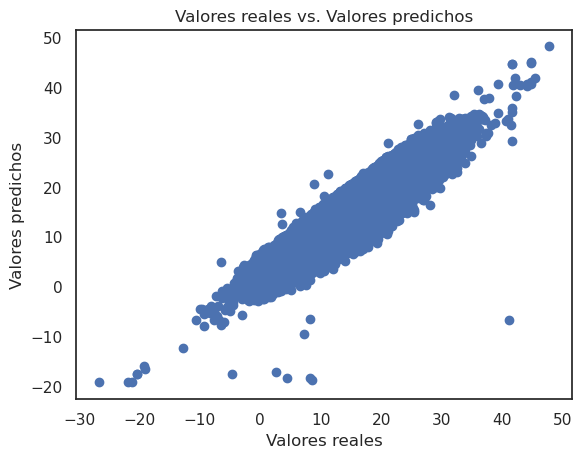

LinearRegression()

In [233]:
variables_predictoras = [
    'Temperatura_Abrigo_150cm_Minima'
    
]

# Variable objetivo
variable_objetivo = 'Temperatura_Abrigo_150cm'



regresion_lineal_total(df_corto,variables_predictoras,variable_objetivo)

Error Cuadrático Medio (MSE): 5.276935558888844
Coeficiente de Determinación (R2): 0.864173317828648


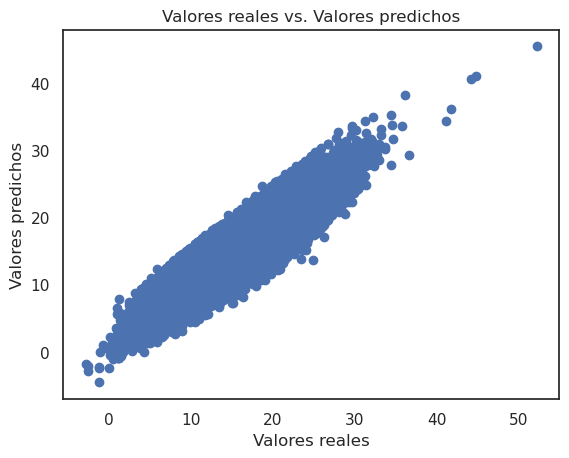

LinearRegression()

In [235]:
# Procedemos a probar regresiones que puedan servir para completar registros.
#Preparación de los datos
# Variables predictoras
variables_predictoras = [
    'Temperatura_Abrigo_150cm_Minima'
    
]

# Variable objetivo
variable_objetivo = 'Temperatura_Abrigo_150cm'


regresion_lineal_provincial(df_corto,'Buenos Aires',variables_predictoras,variable_objetivo)


Error Cuadrático Medio (MSE): 3.9855187262012444
Coeficiente de Determinación (R2): 0.6638322274058577


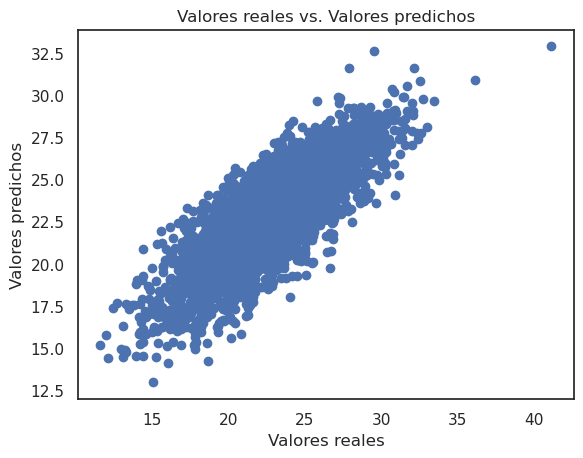

LinearRegression()

In [237]:
regresion_lineal_provincial_mensual(df_corto,'Buenos Aires',variables_predictoras,variable_objetivo,mes=1)

Error Cuadrático Medio (MSE): 4.9470244773065
Coeficiente de Determinación (R2): 0.8658679371534115


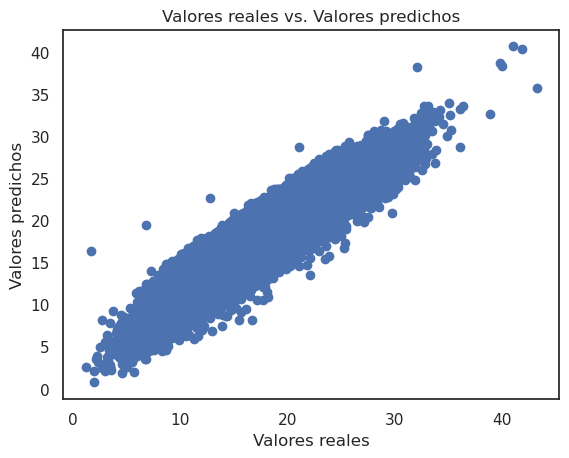

LinearRegression()

In [239]:
regresion_lineal_provincial(df_corto,'Santa Fe',variables_predictoras,variable_objetivo)

Error Cuadrático Medio (MSE): 5.7978726171741775
Coeficiente de Determinación (R2): 0.8695451682784681


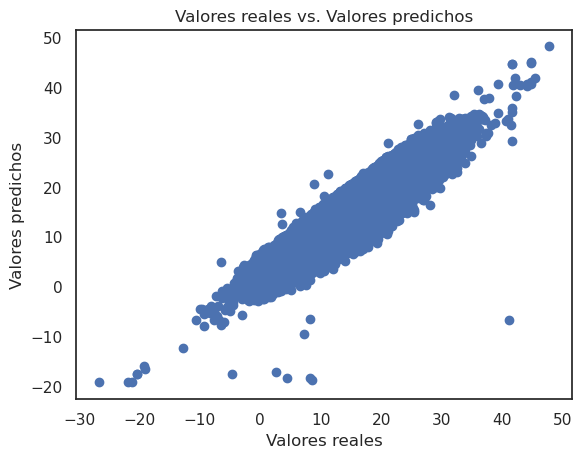

In [241]:
variables_predictoras = [ 'Temperatura_Abrigo_150cm_Minima']
variable_objetivo = 'Temperatura_Abrigo_150cm'

modelo_min = regresion_lineal_total(df_corto,variables_predictoras,variable_objetivo)

Error Cuadrático Medio (MSE): 4.593636688383781
Coeficiente de Determinación (R2): 0.8767235288487057


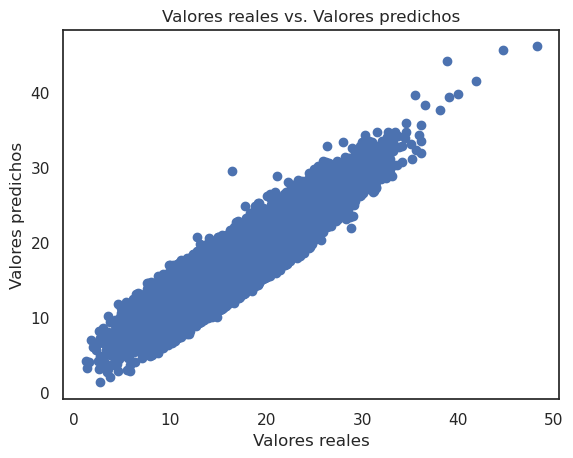

LinearRegression()

In [243]:

# 1. Preparación de los datos
# Variables predictoras
variables_predictoras = [
    'Temperatura_Abrigo_150cm_Maxima'
    
]

# Variable objetivo
variable_objetivo = 'Temperatura_Abrigo_150cm'
regresion_lineal_provincial(df_corto,'Santa Fe',variables_predictoras,variable_objetivo)

Error Cuadrático Medio (MSE): 6.06848251551278
Coeficiente de Determinación (R2): 0.8632505572403831


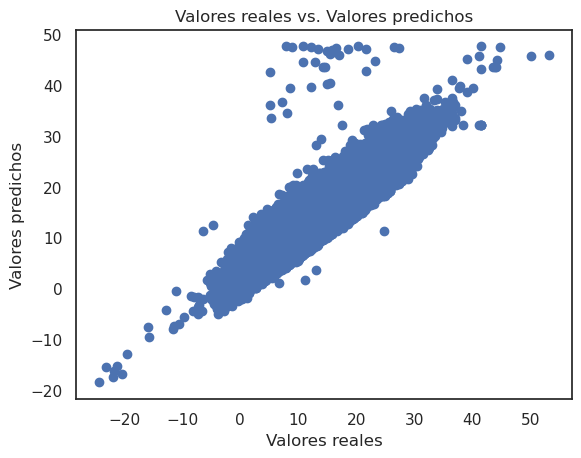

In [245]:
variables_predictoras = [ 'Temperatura_Abrigo_150cm_Maxima']
variable_objetivo = 'Temperatura_Abrigo_150cm'

modelo_max = regresion_lineal_total(df_corto,variables_predictoras,variable_objetivo)

Error Cuadrático Medio (MSE): 0.2926182668086102
Coeficiente de Determinación (R2): 0.9921404524135536


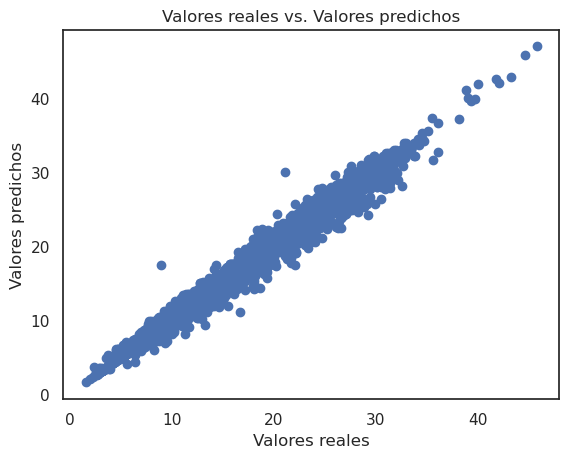

LinearRegression()

In [247]:

# 1. Preparación de los datos
# Variables predictoras
variables_predictoras = [
    'Temperatura_Abrigo_150cm_Minima','Temperatura_Abrigo_150cm_Maxima'
    
]

# Variable objetivo
variable_objetivo = 'Temperatura_Abrigo_150cm'
regresion_lineal_provincial(df_corto,'Santa Fe',variables_predictoras,variable_objetivo)

Error Cuadrático Medio (MSE): 0.5245205761676323
Coeficiente de Determinación (R2): 0.9881362553824199


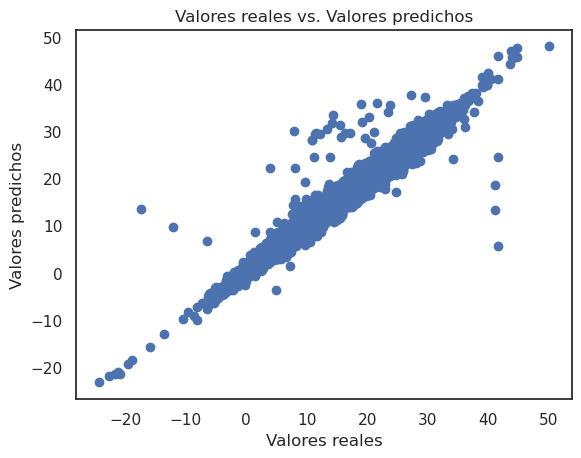

In [249]:
variables_predictoras = ['Temperatura_Abrigo_150cm_Minima', 'Temperatura_Abrigo_150cm_Maxima']
variable_objetivo = 'Temperatura_Abrigo_150cm'
modelo_comb = regresion_lineal_total(df_corto,variables_predictoras,variable_objetivo)

In [251]:
# Asignamos a los valores null de Temperatura Abrigo 150 los valores del modelo de regresion para las variables Minima y Maxima
# Definir variables predictoras
variables_predictoras = ['Temperatura_Abrigo_150cm_Minima', 'Temperatura_Abrigo_150cm_Maxima']
variable_objetivo = 'Temperatura_Abrigo_150cm'
# Filtro de filas que cumplen ambas condiciones
# Resguardamos el Df
df_corto_bk = df_corto.copy()

filtro = df_corto[variables_predictoras].notnull().all(axis=1) & df_corto[variable_objetivo].isnull()

# Seleccionar las filas y variables predictoras para la predicción
df_prediccion = df_corto.loc[filtro, variables_predictoras]

# Realizar la predicción
predicciones = modelo_comb.predict(df_prediccion)

# Asignar las predicciones a los valores nulos en el DataFrame original
df_corto.loc[filtro, variable_objetivo] = predicciones

# 3. (Opcional) Verificar los resultados
print(df_corto[filtro][[variable_objetivo] + variables_predictoras])


      Temperatura_Abrigo_150cm  Temperatura_Abrigo_150cm_Minima  \
70                   27.105740                             25.2   
85                   26.157322                             25.7   
1322                -10.883192                            -29.9   
1323                -24.050191                            -28.8   
1330                -14.640920                            -29.9   
...                        ...                              ...   
1421                 20.712834                             19.3   
1423                 21.396359                             19.6   
1440                 21.285055                             20.7   
1775                 24.820326                             24.5   
1992                 25.064226                             24.6   

      Temperatura_Abrigo_150cm_Maxima  
70                               29.4  
85                               26.9  
1322                              9.1  
1323                            -19

In [253]:
# Asignamos los valores predichos con la predictora de Minima

# Definir variables predictoras
variables_predictoras = ['Temperatura_Abrigo_150cm_Minima']
variable_objetivo = 'Temperatura_Abrigo_150cm'
# Filtro de filas que cumplen ambas condiciones

filtro = df_corto[variables_predictoras].notnull().all(axis=1) & df_corto[variable_objetivo].isnull()

# Seleccionar las filas y variables predictoras para la predicción
df_prediccion = df_corto.loc[filtro, variables_predictoras]

# Realizar la predicción
predicciones = modelo_min.predict(df_prediccion)

# Asignar las predicciones a los valores nulos en el DataFrame original
df_corto.loc[filtro, variable_objetivo] = predicciones


print(df_corto[filtro][[variable_objetivo] + variables_predictoras])


       Temperatura_Abrigo_150cm  Temperatura_Abrigo_150cm_Minima
0                     19.159123                             13.0
1                     19.159123                             13.0
2                     20.052273                             14.0
3                     18.891178                             12.7
4                     19.427068                             13.3
...                         ...                              ...
16391                  8.441323                              1.0
16392                 10.763513                              3.6
16393                  6.208449                             -1.5
16394                  7.816119                              0.3
16395                  6.476394                             -1.2

[2438 rows x 2 columns]


In [255]:
# Asignamos los valores predichos con la predictora de Maxima
# Definir variables predictoras
variables_predictoras = ['Temperatura_Abrigo_150cm_Maxima']
variable_objetivo = 'Temperatura_Abrigo_150cm'
# Filtro de filas que cumplen ambas condiciones

df_corto_bk = df_corto.copy()
filtro = df_corto[variables_predictoras].notnull().all(axis=1) & df_corto[variable_objetivo].isnull()

# Seleccionar las filas y variables predictoras para la predicción
df_prediccion = df_corto.loc[filtro, variables_predictoras]

# Realizar la predicción
predicciones = modelo_max.predict(df_prediccion)

# Asignar las predicciones a los valores nulos en el DataFrame original
df_corto.loc[filtro, variable_objetivo] = predicciones

# 3. (Opcional) Verificar los resultados
print(df_corto[filtro][[variable_objetivo] + variables_predictoras])


       Temperatura_Abrigo_150cm  Temperatura_Abrigo_150cm_Maxima
390                   24.101881                             32.1
427                   25.372936                             33.6
499                    9.781329                             15.2
656                   13.933442                             20.1
692                   23.508722                             31.4
...                         ...                              ...
16609                 29.440312                             38.4
16909                 27.067676                             35.6
16927                 30.033471                             39.1
16928                 31.050315                             40.3
16931                 24.356092                             32.4

[1208 rows x 2 columns]


In [257]:
df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 591877 entries, 70 to 2986
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            591877 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               591877 non-null  float64       
 2   Rocio_Medio                      591877 non-null  float64       
 3   Precipitacion_Pluviometrica      591877 non-null  float64       
 4   Temperatura_Suelo_10cm_Media     591877 non-null  float64       
 5   Humedad_Media_8_14_20            591877 non-null  float64       
 6   Velocidad_Viento_Maxima          529023 non-null  float64       
 7   Temperatura_Abrigo_150cm         581917 non-null  float64       
 8   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 9   Velocidad_Viento_200cm_Media     550582 non-null  float64       
 10  Temperatura_Abrigo_150cm_Maxima  578137 non-null  

In [259]:
# Los registros que quedan sin completar los obtenemos por medio de la media mensual por provincia
df_corto = completar_valores_medios(df_corto,'Temperatura_Abrigo_150cm',provincias)
df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 591877 entries, 70 to 2986
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            591877 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               591877 non-null  float64       
 2   Rocio_Medio                      591877 non-null  float64       
 3   Precipitacion_Pluviometrica      591877 non-null  float64       
 4   Temperatura_Suelo_10cm_Media     591877 non-null  float64       
 5   Humedad_Media_8_14_20            591877 non-null  float64       
 6   Velocidad_Viento_Maxima          529023 non-null  float64       
 7   Temperatura_Abrigo_150cm         591877 non-null  float64       
 8   Temperatura_Abrigo_150cm_Minima  579457 non-null  float64       
 9   Velocidad_Viento_200cm_Media     550582 non-null  float64       
 10  Temperatura_Abrigo_150cm_Maxima  578137 non-null  

In [261]:
# Los registros que faltan los obtenemos por medio de la norma por provincia
df_corto = completar_valores_normal(df_corto,'Temperatura_Abrigo_150cm_Minima',provincias)
df_corto = completar_valores_normal(df_corto,'Temperatura_Abrigo_150cm_Maxima',provincias)


In [263]:
df_corto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 591877 entries, 70 to 2986
Data columns (total 16 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            591877 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               591877 non-null  float64       
 2   Rocio_Medio                      591877 non-null  float64       
 3   Precipitacion_Pluviometrica      591877 non-null  float64       
 4   Temperatura_Suelo_10cm_Media     591877 non-null  float64       
 5   Humedad_Media_8_14_20            591877 non-null  float64       
 6   Velocidad_Viento_Maxima          529023 non-null  float64       
 7   Temperatura_Abrigo_150cm         591877 non-null  float64       
 8   Temperatura_Abrigo_150cm_Minima  591877 non-null  float64       
 9   Velocidad_Viento_200cm_Media     550582 non-null  float64       
 10  Temperatura_Abrigo_150cm_Maxima  591877 non-null  

In [265]:
for provincia in list(df_corto['Provincia'].unique()):
    print(f"{provincia} - {df_corto[df_corto['Provincia'] == provincia]['Fecha'].min()}")

Buenos Aires - 1951-01-01 00:00:00
Corrientes - 1959-01-01 00:00:00
Chubut - 2011-08-12 00:00:00
Córdoba - 1967-10-01 00:00:00
La Pampa - 1961-01-01 00:00:00
Entre Rios - 1956-04-01 00:00:00
La Rioja - 2012-06-13 00:00:00
Santiago del Estero - 1988-04-01 00:00:00
Mendoza - 2014-03-20 00:00:00
Santa Fe - 1956-04-01 00:00:00
Misiones - 1968-01-01 00:00:00
Tierra del Fuego - 2012-03-29 00:00:00
Río Negro - 2011-05-28 00:00:00
Catamarca - 2012-11-10 00:00:00
Neuquen - 2016-11-02 00:00:00
San Juan - 2014-03-29 00:00:00
Jujuy - 2012-01-27 00:00:00
Salta - 2015-07-02 00:00:00
Santa Cruz - 2011-11-18 00:00:00


In [267]:
# Guardamos el set de datos reconstruido
df_corto.to_csv("meteorologico_22_23.csv")

# INICIO ANALISIS df_largo

In [6]:
#df_largo = pd.read_csv("registro_meteorologico_70al22.csv")


In [8]:
df_largo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264618 entries, 0 to 264617
Data columns (total 17 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Unnamed: 0                       264618 non-null  int64  
 1   Fecha                            264618 non-null  object 
 2   Humedad_Media                    1786 non-null    float64
 3   Tesion_Vapor_Media               244538 non-null  float64
 4   Rocio_Medio                      242705 non-null  float64
 5   Precipitacion_Pluviometrica      256533 non-null  float64
 6   Temperatura_Suelo_10cm_Media     5750 non-null    float64
 7   Humedad_Media_8_14_20            246835 non-null  float64
 8   Velocidad_Viento_Maxima          0 non-null       float64
 9   Temperatura_Abrigo_150cm         252347 non-null  float64
 10  Temperatura_Abrigo_150cm_Minima  253969 non-null  float64
 11  Velocidad_Viento_200cm_Media     237601 non-null  float64
 12  Te

In [10]:
df_largo.describe()


,Unnamed: 0,Humedad_Media,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Temperatura_Suelo_10cm_Media,Humedad_Media_8_14_20,Velocidad_Viento_Maxima,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Latitud,Longitud
count,264618.000000,1786.000000,244538.000000,242705.000000,256533.000000,5750.000000,246835.000000,0.0,252347.000000,253969.000000,237601.000000,253233.000000,264618.000000,264618.000000
mean,11303.505430,75.953527,15.058111,11.913050,2.795932,19.783765,70.382263,NaN,17.498589,11.444225,8.055863,23.518638,-33.583532,-60.118653
std,6754.139503,11.522555,6.015508,6.382692,9.976467,5.990424,14.202345,NaN,6.351555,6.591636,4.940897,6.845020,3.869257,2.190344
min,0.000000,35.000000,0.200000,-30.190000,0.000000,0.000000,1.000000,NaN,-17.400000,-28.000000,0.000000,0.000000,-39.380001,-63.980000
25%,5512.000000,69.000000,10.200000,7.300000,0.000000,15.975000,61.000000,NaN,12.600000,6.600000,4.800000,18.300000,-37.750000,-61.549999
50%,11025.000000,76.000000,14.400000,12.300000,0.000000,20.400000,71.000000,NaN,17.850000,11.900000,7.200000,23.900000,-33.736500,-60.250000
75%,16914.000000,84.000000,19.300000,16.900000,0.000000,24.533333,81.000000,NaN,22.550000,16.700000,10.400000,28.900000,-31.180000,-58.671001
max,27106.000000,100.000000,50.738964,36.000000,355.000000,35.000000,100.000000,NaN,37.400000,44.000000,121.700000,45.400000,-27.650000,-55.430000


In [12]:
# Dejamos en 0 los valores de Rocio_Medio negativos
condicion = df_largo['Rocio_Medio']<0
df_largo.loc[condicion, 'Rocio_Medio'] = 0
df_largo.describe()

,Unnamed: 0,Humedad_Media,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Temperatura_Suelo_10cm_Media,Humedad_Media_8_14_20,Velocidad_Viento_Maxima,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Latitud,Longitud
count,264618.000000,1786.000000,244538.000000,242705.000000,256533.000000,5750.000000,246835.000000,0.0,252347.000000,253969.000000,237601.000000,253233.000000,264618.000000,264618.000000
mean,11303.505430,75.953527,15.058111,11.986342,2.795932,19.783765,70.382263,NaN,17.498589,11.444225,8.055863,23.518638,-33.583532,-60.118653
std,6754.139503,11.522555,6.015508,6.218832,9.976467,5.990424,14.202345,NaN,6.351555,6.591636,4.940897,6.845020,3.869257,2.190344
min,0.000000,35.000000,0.200000,0.000000,0.000000,0.000000,1.000000,NaN,-17.400000,-28.000000,0.000000,0.000000,-39.380001,-63.980000
25%,5512.000000,69.000000,10.200000,7.300000,0.000000,15.975000,61.000000,NaN,12.600000,6.600000,4.800000,18.300000,-37.750000,-61.549999
50%,11025.000000,76.000000,14.400000,12.300000,0.000000,20.400000,71.000000,NaN,17.850000,11.900000,7.200000,23.900000,-33.736500,-60.250000
75%,16914.000000,84.000000,19.300000,16.900000,0.000000,24.533333,81.000000,NaN,22.550000,16.700000,10.400000,28.900000,-31.180000,-58.671001
max,27106.000000,100.000000,50.738964,36.000000,355.000000,35.000000,100.000000,NaN,37.400000,44.000000,121.700000,45.400000,-27.650000,-55.430000


In [18]:
# Hacemos un repaso de los registros historicos de este set de datos
provincias = list(df_largo['Provincia'].unique())
for provincia in list(df_largo['Provincia'].unique()):
    print(f"{provincia} - {df_largo[df_largo['Provincia'] == provincia]['Fecha'].min()}")

La Pampa - 1961-01-01 00:00:00
Buenos Aires - 1951-01-01 00:00:00
Entre Rios - 1956-04-01 00:00:00
Córdoba - 1967-10-01 01:00:00
Santa Fe - 1956-04-01 00:00:00
Corrientes - 1959-01-01 00:00:00
Misiones - 1968-01-01 00:00:00


In [20]:
# Evaluamos la distribucion de nulos por provincia por parametro
for provincia in provincias:
    print(f"--------- {provincia}-----")
    print(df_largo[df_largo['Provincia']==provincia].info())
    print("================================")



--------- La Pampa-----
<class 'pandas.core.frame.DataFrame'>
Index: 22986 entries, 0 to 22985
Data columns (total 17 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Unnamed: 0                       22986 non-null  int64  
 1   Fecha                            22986 non-null  object 
 2   Humedad_Media                    0 non-null      float64
 3   Tesion_Vapor_Media               21282 non-null  float64
 4   Rocio_Medio                      21284 non-null  float64
 5   Precipitacion_Pluviometrica      22965 non-null  float64
 6   Temperatura_Suelo_10cm_Media     290 non-null    float64
 7   Humedad_Media_8_14_20            21298 non-null  float64
 8   Velocidad_Viento_Maxima          0 non-null      float64
 9   Temperatura_Abrigo_150cm         22078 non-null  float64
 10  Temperatura_Abrigo_150cm_Minima  22531 non-null  float64
 11  Velocidad_Viento_200cm_Media     21073 non-null  float64
 12 

In [22]:
# Quitamos Chaco de los registros ya que no presenta ningun registro valido 
df_largo = df_largo[df_largo['Provincia']!="Chaco"]

In [24]:
# Comenzamos a regenerar los datos faltantes
# Los datos originales de humedad media son muy pocos, por lo que intentar correr algun analisis sobre esta variable seria un desperdicio de recursos, ya vimos en el analisis de df_corto que era posible eliminar esta columna
# Mismo criterio vamos a tener con la Temepratura_suelo_10cm
df_largo.drop('Unnamed: 0', inplace=True,axis=1)
df_largo.drop('Humedad_Media', inplace=True,axis=1)
df_largo.drop('Temperatura_Suelo_10cm_Media', inplace=True,axis=1)
df_largo.drop('Velocidad_Viento_Maxima', inplace=True,axis=1)

In [26]:
df_largo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264618 entries, 0 to 264617
Data columns (total 13 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Fecha                            264618 non-null  object 
 1   Tesion_Vapor_Media               244538 non-null  float64
 2   Rocio_Medio                      242705 non-null  float64
 3   Precipitacion_Pluviometrica      256533 non-null  float64
 4   Humedad_Media_8_14_20            246835 non-null  float64
 5   Temperatura_Abrigo_150cm         252347 non-null  float64
 6   Temperatura_Abrigo_150cm_Minima  253969 non-null  float64
 7   Velocidad_Viento_200cm_Media     237601 non-null  float64
 8   Temperatura_Abrigo_150cm_Maxima  253233 non-null  float64
 9   Provincia                        264618 non-null  object 
 10  Localidad                        264618 non-null  object 
 11  Latitud                          264618 non-null  float64
 12  Lo

In [28]:
# Eliminar la hora en formato HH:MM:SS
patron = r'\d{2}:\d{2}:\d{2}'
df_largo['Fecha'] = df_largo['Fecha'].str.replace(patron, "", regex=True)

# Eliminar espacios extra en cada string (aplicado correctamente con .str)
df_largo['Fecha'] = df_largo['Fecha'].str.strip()

# Convertir a datetime
df_largo['Fecha'] = pd.to_datetime(df_largo['Fecha'], format='%Y-%m-%d', errors='coerce')



In [30]:


# Recortamos los registros para que no superen el 31 de dic de 2023 ya que no tendremos otros datos para cruzar
fecha_limite_max = pd.to_datetime('2023-12-31')
fecha_limite_min = pd.to_datetime('1970-01-01')

# Filtrar el DataFrame primero por registros anteriores a fecha lim max
df_filtrado = df_largo[df_largo['Fecha'] <= fecha_limite_max]
# Filtrar por registros posteriores a fecha min
df_filtrado = df_largo[df_largo['Fecha'] >= fecha_limite_min]

In [32]:
df_filtrado.info()

<class 'pandas.core.frame.DataFrame'>
Index: 226901 entries, 3287 to 264617
Data columns (total 13 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            226901 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               219318 non-null  float64       
 2   Rocio_Medio                      217484 non-null  float64       
 3   Precipitacion_Pluviometrica      224600 non-null  float64       
 4   Humedad_Media_8_14_20            221547 non-null  float64       
 5   Temperatura_Abrigo_150cm         222505 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  223292 non-null  float64       
 7   Velocidad_Viento_200cm_Media     212297 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  223175 non-null  float64       
 9   Provincia                        226901 non-null  object        
 10  Localidad                        226901 non-nu

In [34]:
# Respaldamos el set de datos largo y pasamos a utilizar la version filtrada por años
df_largo_bk = df_largo.copy()
df_largo = df_filtrado

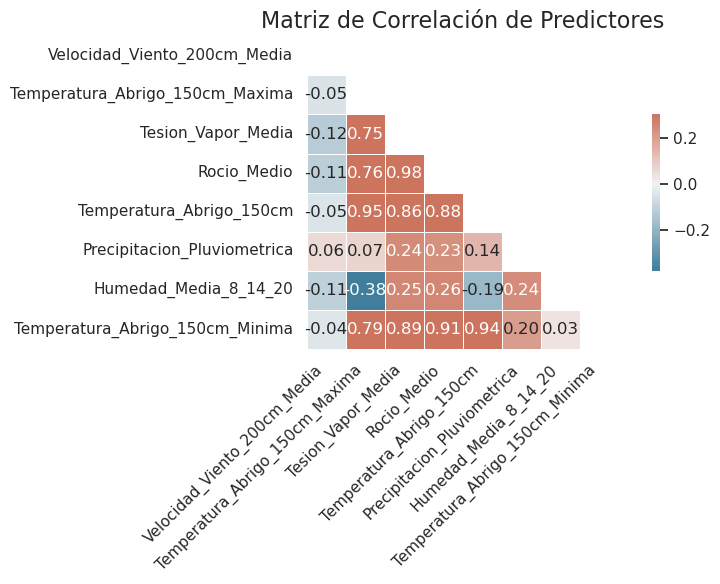

In [42]:
var_relacionadas = ['Velocidad_Viento_200cm_Media', 'Temperatura_Abrigo_150cm_Maxima', 'Tesion_Vapor_Media', 'Rocio_Medio', 'Temperatura_Abrigo_150cm', 'Precipitacion_Pluviometrica', 'Humedad_Media_8_14_20','Temperatura_Abrigo_150cm_Minima']

correlaciones(df_largo,var_relacionadas)

In [44]:
# Genero el parametro MES
df_largo['MES'] = df_largo['Fecha'].dt.month

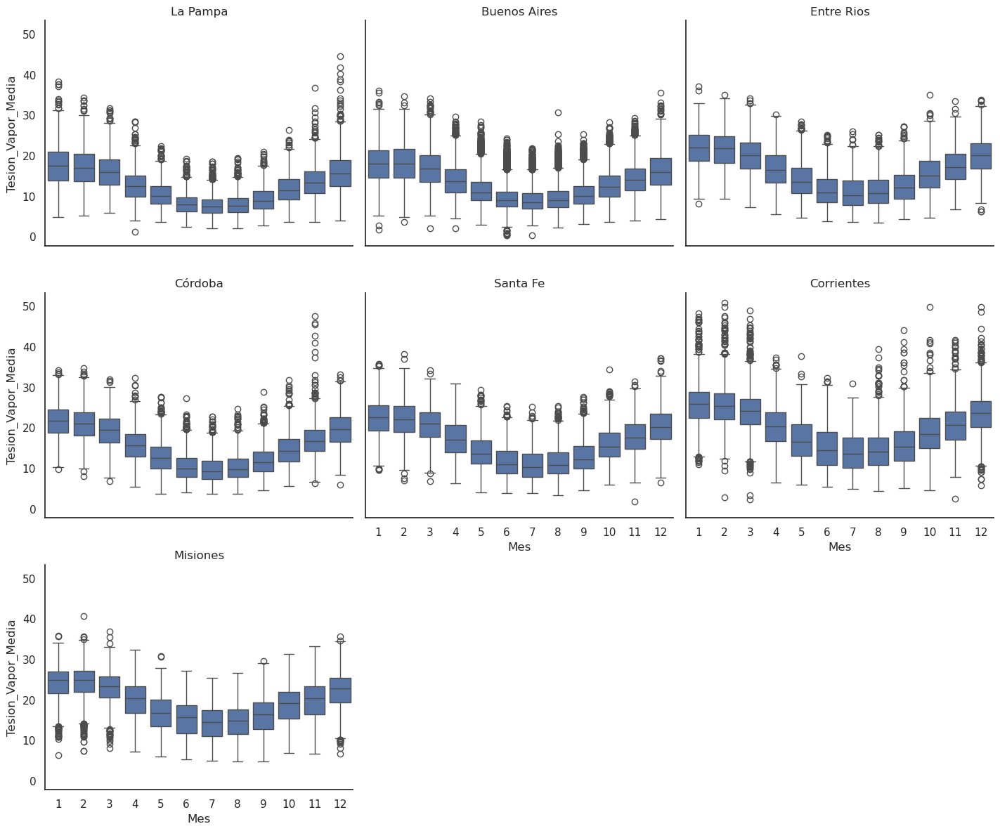

In [46]:
# Evaluamos el parametro Tesion_Vapor_Media

crear_boxplot_grid(df_largo, 'Provincia', 'MES', 'Tesion_Vapor_Media')

In [48]:
df_largo[(df_largo['Provincia']=="Corrientes") & (df_largo['MES']==1)]['Tesion_Vapor_Media'].describe()

count    2595.000000
mean       25.548264
std         5.052536
min        10.900000
25%        22.300000
50%        25.800000
75%        28.700000
max        48.096394
Name: Tesion_Vapor_Media, dtype: float64

In [50]:
print(f"Tesion_Vapor_Media nulos: {df_largo['Tesion_Vapor_Media'].isnull().sum()}")
print(f"Rocio_Medio nulos: {df_largo['Rocio_Medio'].isnull().sum()}")

# Cruces de condiciones
print("Rocio Medio Nulo para Tesion Vapor Media válido:")
print(df_largo[df_largo['Tesion_Vapor_Media'].notnull() & df_largo['Rocio_Medio'].isnull()].shape[0])

print("Tesion de Vapor Media Nulo para Rocio Medio válido:")
print(df_largo[df_largo['Tesion_Vapor_Media'].isnull() & df_largo['Rocio_Medio'].notnull()].shape[0])

print("Tesion de Vapor Media Nulo para Temperatura de Abrigo Mínima válida:")
print(df_largo[df_largo['Tesion_Vapor_Media'].isnull() & df_largo['Temperatura_Abrigo_150cm_Minima'].notnull()].shape[0])


Tesion_Vapor_Media nulos: 7583
Rocio_Medio nulos: 9417
Rocio Medio Nulo para Tesion Vapor Media válido:
1852
Tesion de Vapor Media Nulo para Rocio Medio válido:
18
Tesion de Vapor Media Nulo para Temperatura de Abrigo Mínima válida:
4670


Error Cuadrático Medio (MSE): 1.3519757717272958
Coeficiente de Determinación (R2): 0.9653800178977796


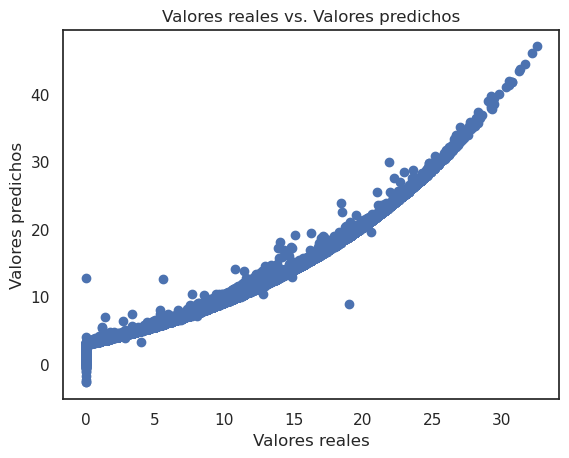

In [52]:
variables_predictoras = ['Tesion_Vapor_Media']
variable_objetivo = 'Rocio_Medio'
modelo1 = regresion_lineal_total(df_largo,variables_predictoras,variable_objetivo)

In [54]:
# Resguardamos el Df
df_largo_bk = df_largo.copy()

filtro = df_largo[variables_predictoras].notnull().all(axis=1) & df_largo[variable_objetivo].isnull()

# Seleccionar las filas y variables predictoras para la predicción
df_prediccion = df_largo.loc[filtro, variables_predictoras]

# Realizar la predicción
predicciones = modelo1.predict(df_prediccion)

# Asignar las predicciones a los valores nulos en el DataFrame original
df_largo.loc[filtro, variable_objetivo] = predicciones

# 3. (Opcional) Verificar los resultados
print(df_largo[filtro][[variable_objetivo] + variables_predictoras])


        Rocio_Medio  Tesion_Vapor_Media
6783       8.494132           11.600000
9610      -2.108894            1.100000
27762     14.855947           17.900000
30991     16.572628           19.600000
30992     11.220624           14.300000
...             ...                 ...
88222      6.070583            9.200000
88517      3.344091            6.500000
213499    23.843274           26.800000
215806     7.085243           10.204801
260439    -2.916744            0.300000

[1852 rows x 2 columns]


In [56]:
# Corregimos los valores por debajo de 0
df_largo.loc[df_largo['Rocio_Medio'] < 0, 'Rocio_Medio'] = 0


In [58]:
# Procedemos a completar los valores faltantes usando la media y la moda
provincias = list(df_largo['Provincia'].unique())

In [60]:
df_largo = completar_valores_normal(df_largo,'Tesion_Vapor_Media',provincias)
df_largo = completar_valores_normal(df_largo,'Rocio_Medio',provincias)

In [62]:
df_largo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 226901 entries, 3287 to 264617
Data columns (total 14 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            226901 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               226901 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      224600 non-null  float64       
 4   Humedad_Media_8_14_20            221547 non-null  float64       
 5   Temperatura_Abrigo_150cm         222505 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  223292 non-null  float64       
 7   Velocidad_Viento_200cm_Media     212297 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  223175 non-null  float64       
 9   Provincia                        226901 non-null  object        
 10  Localidad                        226901 non-nu

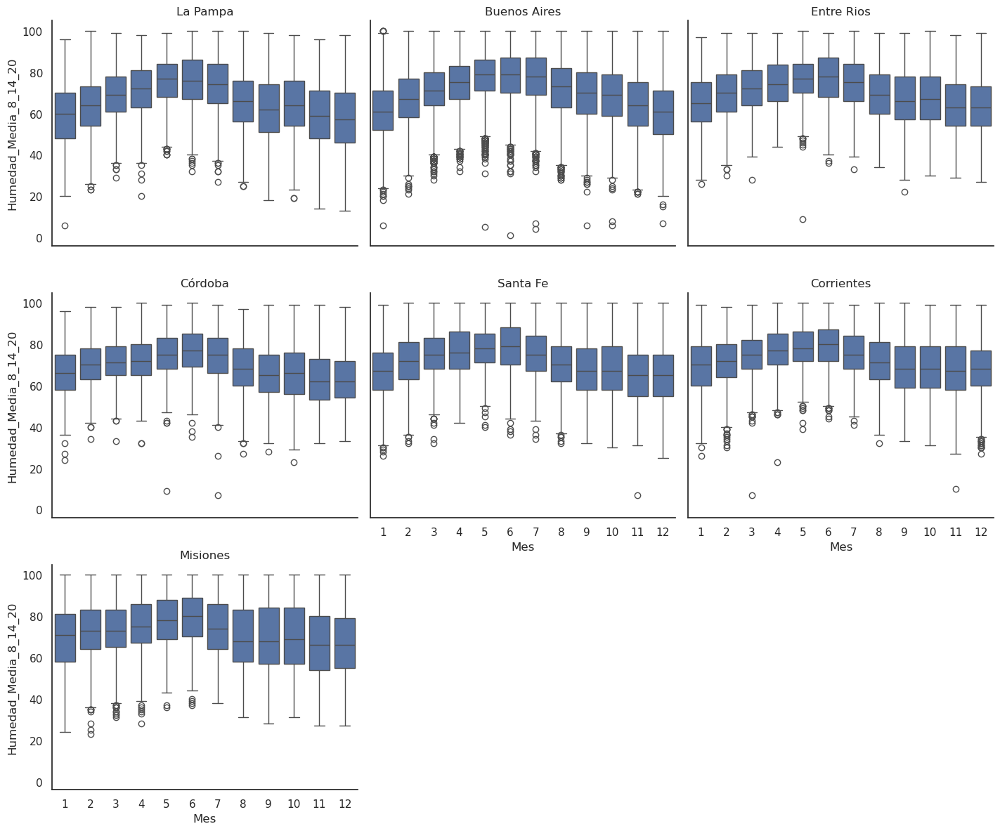

In [64]:
# Empezamos a verificar los valores de Humedad_Media_8_14_20
crear_boxplot_grid(df_largo, 'Provincia', 'MES', 'Humedad_Media_8_14_20')

In [66]:
# Como ya se pudo ver la humedad no tiene correlacion con otras variables, y no encontramos grandes cantidades de outliers, por lo que usamos la media
df_largo = completar_valores_medios(df_largo,'Humedad_Media_8_14_20',provincias)

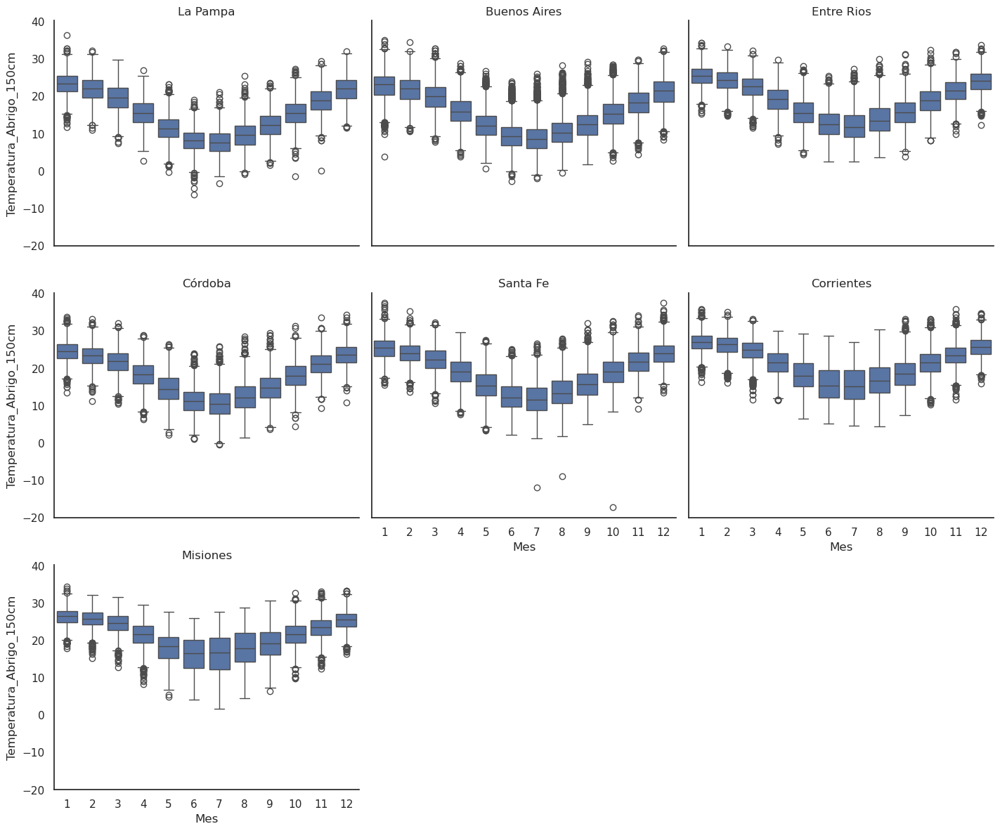

In [68]:
crear_boxplot_grid(df_largo, 'Provincia', 'MES', 'Temperatura_Abrigo_150cm')

In [70]:
df_largo['Temperatura_Abrigo_150cm'].isnull().sum()

4396

In [72]:
df_largo['Temperatura_Abrigo_150cm'].count()

222505

In [75]:
df_largo = completar_valores_medios(df_largo,'Temperatura_Abrigo_150cm',provincias)

In [77]:
df_largo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 226901 entries, 3287 to 264617
Data columns (total 14 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            226901 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               226901 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      224600 non-null  float64       
 4   Humedad_Media_8_14_20            226901 non-null  float64       
 5   Temperatura_Abrigo_150cm         226901 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  223292 non-null  float64       
 7   Velocidad_Viento_200cm_Media     212297 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  223175 non-null  float64       
 9   Provincia                        226901 non-null  object        
 10  Localidad                        226901 non-nu

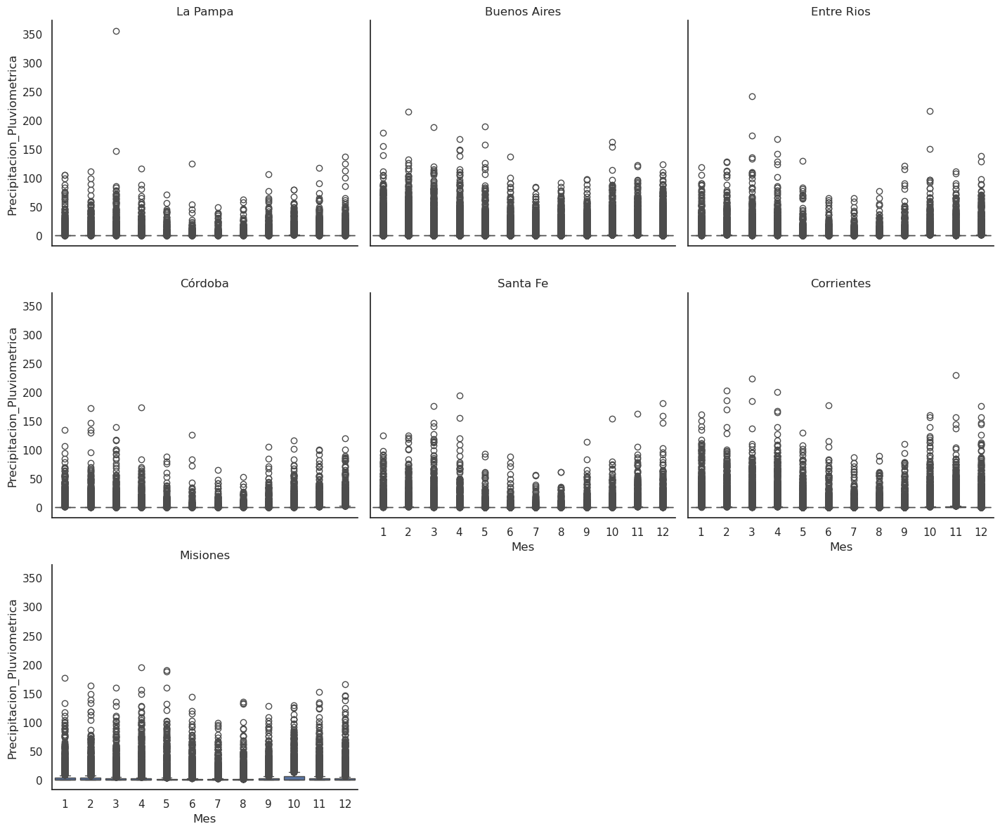

In [79]:
crear_boxplot_grid(df_largo, 'Provincia', 'MES', 'Precipitacion_Pluviometrica')

In [81]:
df_largo.columns

Index(['Fecha', 'Tesion_Vapor_Media', 'Rocio_Medio',
       'Precipitacion_Pluviometrica', 'Humedad_Media_8_14_20',
       'Temperatura_Abrigo_150cm', 'Temperatura_Abrigo_150cm_Minima',
       'Velocidad_Viento_200cm_Media', 'Temperatura_Abrigo_150cm_Maxima',
       'Provincia', 'Localidad', 'Latitud', 'Longitud', 'MES'],
      dtype='object')

In [83]:


# Ejemplo de uso:
# Supongamos que tienes un DataFrame llamado df_largo
df_largo_modificado = asignar_precipitacion_global(df_largo.copy()) #Se realiza una copia para no modificar el dataframe original


/tmp/ipykernel_1724844/428541072.py:451: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_modificado = grouped.apply(asignar_grupo).reset_index(level=[0,1], drop=True)


In [84]:
df_largo_modificado.info()

<class 'pandas.core.frame.DataFrame'>
Index: 226901 entries, 24082 to 132926
Data columns (total 14 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            226901 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               226901 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      226808 non-null  float64       
 4   Humedad_Media_8_14_20            226901 non-null  float64       
 5   Temperatura_Abrigo_150cm         226901 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  223292 non-null  float64       
 7   Velocidad_Viento_200cm_Media     212297 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  223175 non-null  float64       
 9   Provincia                        226901 non-null  object        
 10  Localidad                        226901 non-n

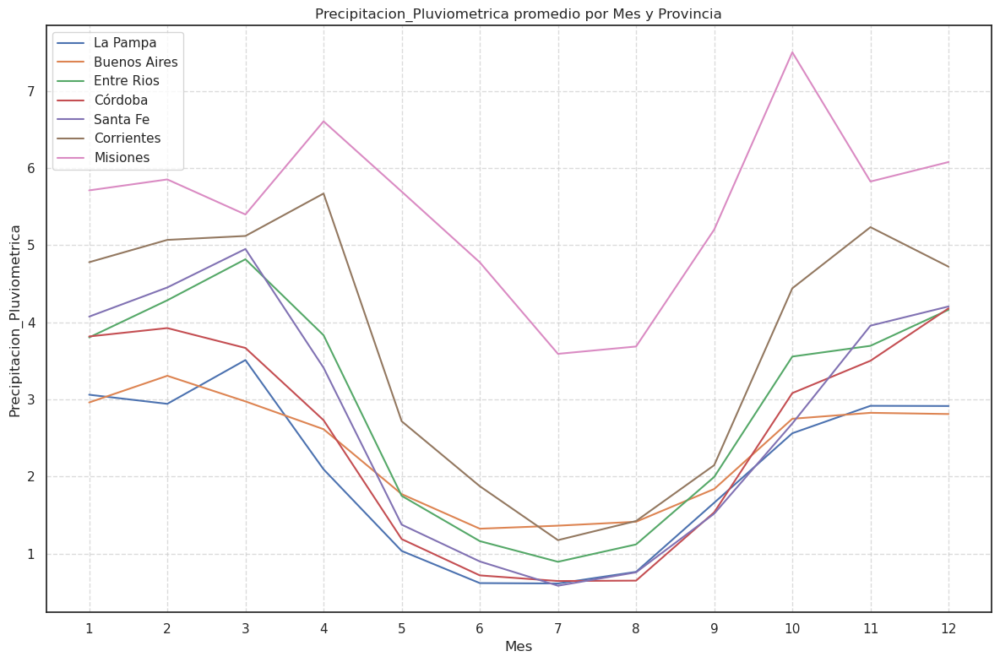

In [87]:
plot_por_provincia_mensual(provincias,df_largo_modificado,'Precipitacion_Pluviometrica')



In [89]:
df_largo = df_largo_modificado

In [91]:
df_largo[(df_largo['Temperatura_Abrigo_150cm_Minima'].isnull()) & (~df_largo['Temperatura_Abrigo_150cm'].isnull())]['Temperatura_Abrigo_150cm_Minima'].isnull().sum()

3609

Error Cuadrático Medio (MSE): 4.926846866327842
Coeficiente de Determinación (R2): 0.8867440608955052


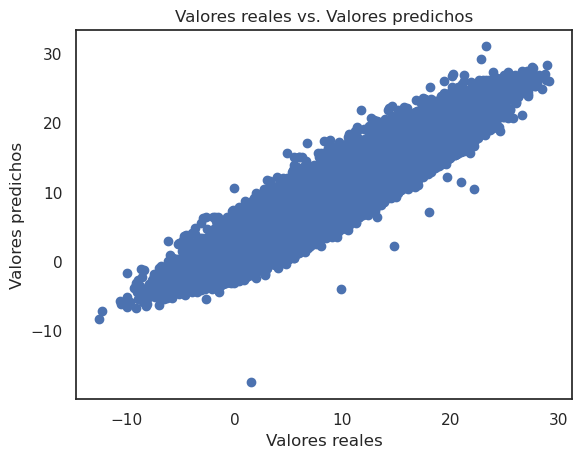

In [93]:
# 1. Preparación de los datos
# Variables predictoras
variables_predictoras = [
    'Temperatura_Abrigo_150cm'
    
]

# Variable objetivo
variable_objetivo = 'Temperatura_Abrigo_150cm_Minima'

modelo1 = regresion_lineal_total(df_largo,variables_predictoras,variable_objetivo)


Error Cuadrático Medio (MSE): 4.945585084889716
Coeficiente de Determinación (R2): 0.8702742753520248


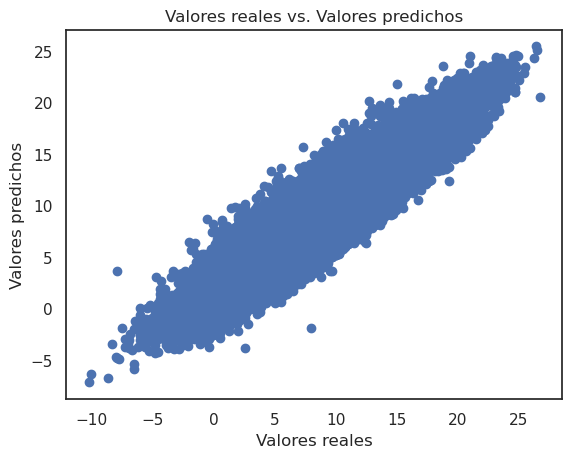

LinearRegression()

In [95]:
regresion_lineal_provincial(df_largo ,'Buenos Aires',variables_predictoras,variable_objetivo)

In [99]:

# Filtro de filas que cumplen ambas condiciones
# Resguardamos el Df
df_largo_bk = df_largo.copy()

filtro = df_largo[variables_predictoras].notnull().all(axis=1) & df_largo[variable_objetivo].isnull()

# Seleccionar las filas y variables predictoras para la predicción
df_prediccion = df_largo.loc[filtro, variables_predictoras]

# Realizar la predicción
predicciones = modelo1.predict(df_prediccion)

# Asignar las predicciones a los valores nulos en el DataFrame original
df_largo.loc[filtro, variable_objetivo] = predicciones

# 3. (Opcional) Verificar los resultados
print(df_largo[filtro][[variable_objetivo] + variables_predictoras])

        Temperatura_Abrigo_150cm_Minima  Temperatura_Abrigo_150cm
244696                         6.314703                 12.220741
244698                         6.314703                 12.220741
244699                         6.314703                 12.220741
244700                         6.314703                 12.220741
244701                         6.314703                 12.220741
...                                 ...                       ...
130923                         9.794257                 15.773518
131527                         9.522275                 15.495812
131646                         3.747975                  9.600000
132139                        19.060466                 25.234720
132140                        19.060466                 25.234720

[3609 rows x 2 columns]


In [101]:
df_largo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 226901 entries, 24082 to 132926
Data columns (total 14 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            226901 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               226901 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      226808 non-null  float64       
 4   Humedad_Media_8_14_20            226901 non-null  float64       
 5   Temperatura_Abrigo_150cm         226901 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  226901 non-null  float64       
 7   Velocidad_Viento_200cm_Media     212297 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  223175 non-null  float64       
 9   Provincia                        226901 non-null  object        
 10  Localidad                        226901 non-n

In [103]:
variables= ['Tesion_Vapor_Media',
 'Rocio_Medio',
 'Precipitacion_Pluviometrica',
 'Humedad_Media_8_14_20',
 'Temperatura_Abrigo_150cm',
 'Temperatura_Abrigo_150cm_Minima',
 'Velocidad_Viento_200cm_Media',
 'Temperatura_Abrigo_150cm_Maxima']

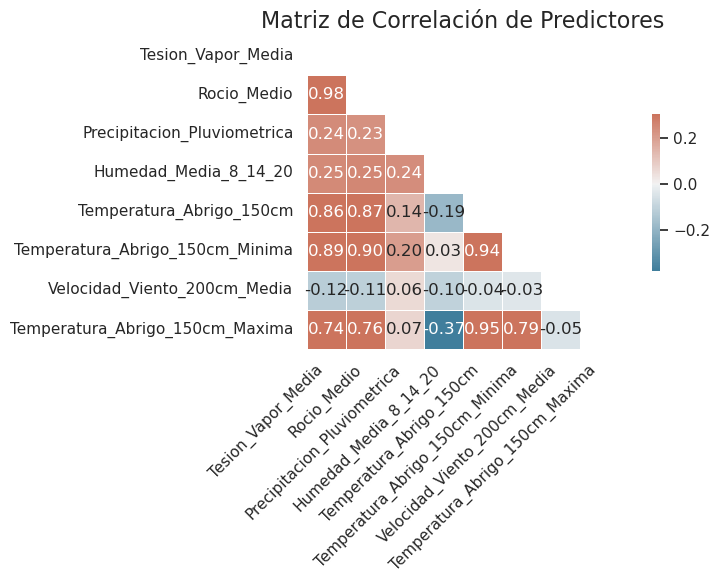

In [105]:
correlaciones(df_largo, variables )

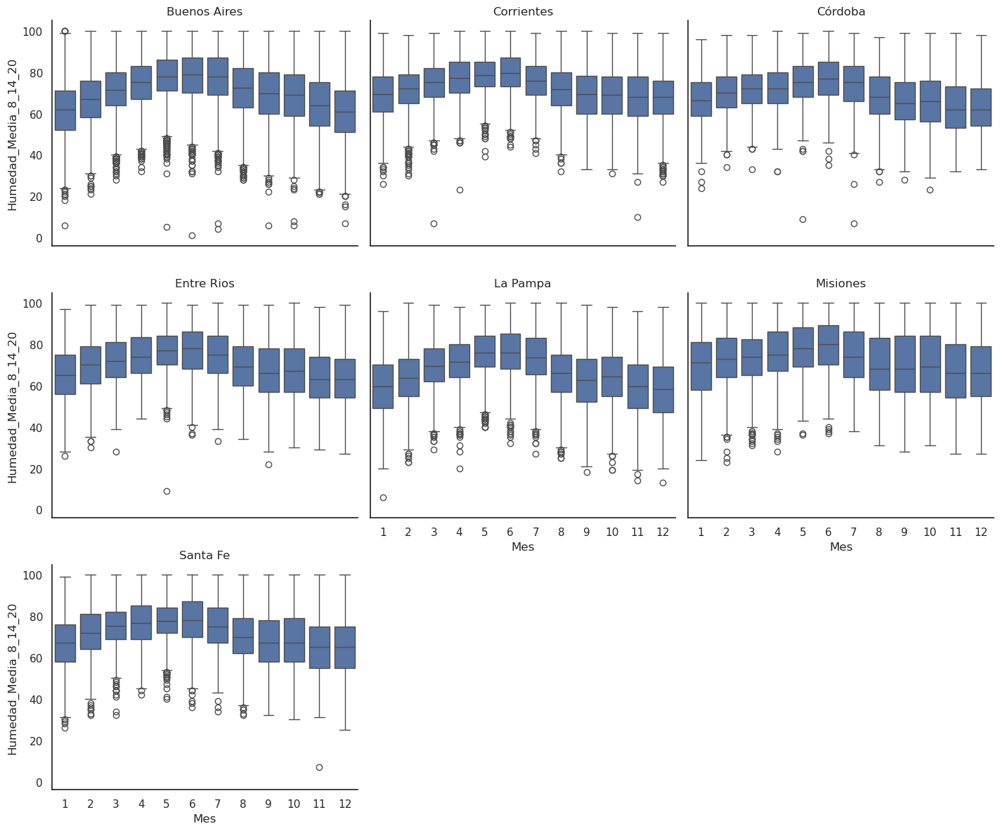

In [107]:
crear_boxplot_grid(df_largo,'Provincia','MES','Humedad_Media_8_14_20')

In [109]:
# Asignamos los valores medios
completar_valores_medios(df_largo,'Humedad_Media_8_14_20',provincias)

,Fecha,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Humedad_Media_8_14_20,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Provincia,Localidad,Latitud,Longitud,MES
24082,1970-01-01,23.200000,19.900000,0.0,56.0,28.15,21.4,8.8,34.9,Buenos Aires,San Pedro,-33.736500,-59.796906,1
45954,1970-01-01,24.000000,20.400000,7.5,62.0,29.55,21.4,8.8,37.7,Buenos Aires,Villarino,-39.380001,-62.619999,1
148585,1970-01-01,27.900000,22.900000,0.0,75.0,20.15,7.1,20.0,33.2,Buenos Aires,Balcarce,-37.750000,-58.299999,1
175693,1970-01-01,24.500000,20.800000,0.0,59.0,28.45,23.5,14.4,33.4,Buenos Aires,Hurlingham,-34.605499,-58.671001,1
244566,1970-01-01,27.700000,22.800000,3.2,60.0,28.00,20.0,15.2,36.0,Buenos Aires,Tres Arroyos,-38.320000,-60.250000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132922,2023-04-23,17.017351,14.940038,0.0,83.0,18.00,14.3,5.9,22.3,Santa Fe,Vera,-31.180000,-61.549999,4
132923,2023-04-24,18.991867,16.678568,5.0,91.0,18.10,15.8,4.0,20.5,Santa Fe,Vera,-31.180000,-61.549999,4
132924,2023-04-25,18.233244,16.048029,1.2,87.0,18.40,13.5,4.0,23.0,Santa Fe,Vera,-31.180000,-61.549999,4
132925,2023-04-26,17.385754,15.305370,0.0,73.0,20.90,11.3,4.0,27.8,Santa Fe,Vera,-31.180000,-61.549999,4


In [110]:
df_largo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 226901 entries, 24082 to 132926
Data columns (total 14 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            226901 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               226901 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      226808 non-null  float64       
 4   Humedad_Media_8_14_20            226901 non-null  float64       
 5   Temperatura_Abrigo_150cm         226901 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  226901 non-null  float64       
 7   Velocidad_Viento_200cm_Media     212297 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  223175 non-null  float64       
 9   Provincia                        226901 non-null  object        
 10  Localidad                        226901 non-n

Error Cuadrático Medio (MSE): 3.7626812019980886
Coeficiente de Determinación (R2): 0.9193948982466592


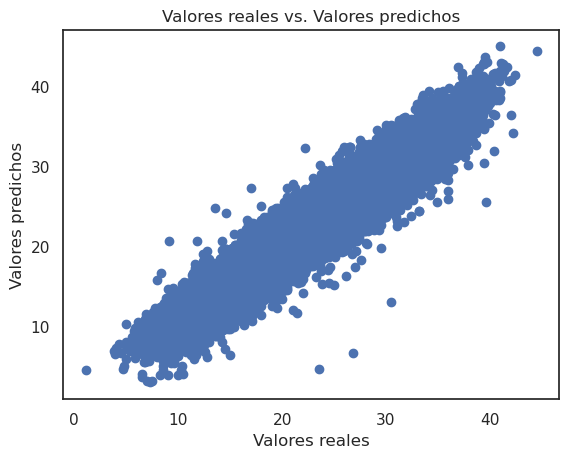

In [111]:
# 1. Preparación de los datos
# Variables predictoras
variables_predictoras = [
    'Temperatura_Abrigo_150cm','Rocio_Medio'
    
]

# Variable objetivo
variable_objetivo = 'Temperatura_Abrigo_150cm_Maxima'


modelo1 = regresion_lineal_total(df_largo , variables_predictoras,variable_objetivo)


In [115]:


# Filtro de filas que cumplen ambas condiciones
# Resguardamos el Df
df_largo_bk = df_largo.copy()

filtro = df_largo[variables_predictoras].notnull().all(axis=1) & df_largo[variable_objetivo].isnull()

# Seleccionar las filas y variables predictoras para la predicción

df_prediccion = df_largo.loc[filtro, variables_predictoras]

# Realizar la predicción
predicciones = modelo1.predict(df_prediccion)

# Asignar las predicciones a los valores nulos en el DataFrame original
df_largo.loc[filtro, variable_objetivo] = predicciones

# 3. (Opcional) Verificar los resultados
print(df_largo[filtro][[variable_objetivo] + variables_predictoras])

        Temperatura_Abrigo_150cm_Maxima  Temperatura_Abrigo_150cm  Rocio_Medio
244691                        19.955455                 12.220741     2.100000
244705                        19.522735                 12.220741     3.400000
244708                        17.791854                 12.220741     8.600000
244709                        17.858427                 12.220741     8.400000
244802                        16.555612                 10.401106     5.200000
...                                 ...                       ...          ...
131167                        20.842144                 14.800000     9.519942
131292                        25.379960                 18.000000     8.397813
131527                        21.155122                 15.495812    11.300000
132139                        32.722420                 25.234720    14.623828
132140                        31.165901                 25.234720    19.300000

[3726 rows x 3 columns]


In [117]:
df_largo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 226901 entries, 24082 to 132926
Data columns (total 14 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            226901 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               226901 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      226808 non-null  float64       
 4   Humedad_Media_8_14_20            226901 non-null  float64       
 5   Temperatura_Abrigo_150cm         226901 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  226901 non-null  float64       
 7   Velocidad_Viento_200cm_Media     212297 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  226901 non-null  float64       
 9   Provincia                        226901 non-null  object        
 10  Localidad                        226901 non-n

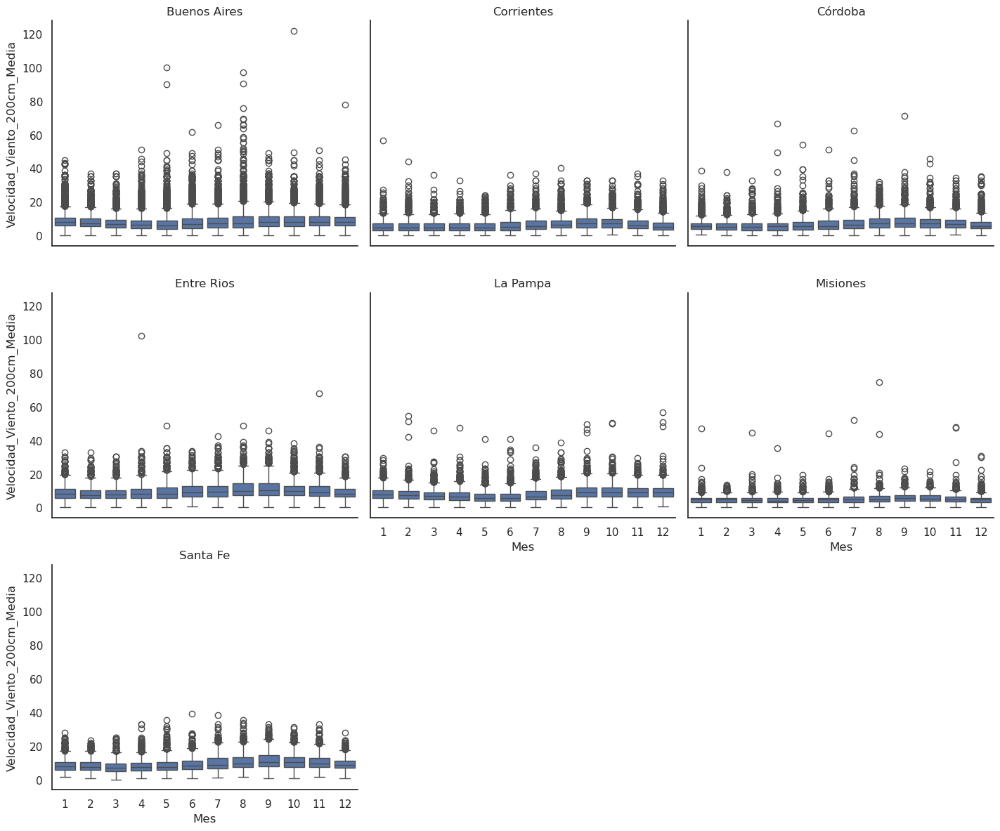

In [119]:
crear_boxplot_grid(df_largo, 'Provincia', 'MES', 'Velocidad_Viento_200cm_Media')

In [121]:
df_largo = completar_valores_normal(df_largo,'Velocidad_Viento_200cm_Media',provincias)

In [123]:
df_largo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 226901 entries, 24082 to 132926
Data columns (total 14 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            226901 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               226901 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      226808 non-null  float64       
 4   Humedad_Media_8_14_20            226901 non-null  float64       
 5   Temperatura_Abrigo_150cm         226901 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  226901 non-null  float64       
 7   Velocidad_Viento_200cm_Media     226901 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  226901 non-null  float64       
 9   Provincia                        226901 non-null  object        
 10  Localidad                        226901 non-n

In [125]:
df_largo = completar_valores_normal(df_largo,'Precipitacion_Pluviometrica',provincias)

In [127]:
df_largo['YEAR'] = df_largo['Fecha'].dt.year

In [129]:
df_largo.groupby(['Provincia','YEAR'])['Fecha'].count()

Provincia     YEAR
Buenos Aires  1970    1825
              1971    1825
              1972    1830
              1973    1825
              1974    1825
                      ... 
Santa Fe      2019     365
              2020     349
              2021     335
              2022     365
              2023     117
Name: Fecha, Length: 385, dtype: int64

In [131]:
#Obtenemos el rango (Año de inicio y año de fin de los registros por provincia)
for provincia in provincias:
    min=df_largo[df_largo['Provincia']==provincia]['YEAR'].min()
    max=df_largo[df_largo['Provincia']==provincia]['YEAR'].max()
    year = df_largo[df_largo['Provincia']==provincia]['YEAR'].unique()
    year_reg = year.size
    mes_a =0
    for a in year:
        mes_reg = df_largo[(df_largo['Provincia']==provincia) & (df_largo['YEAR']==a) ]['MES'].unique().size
        mes_a = mes_a + mes_reg
    
    print("----------")
    print(f"{provincia} --- {min}-{max}")
    print(f"Cantidad de años esperados: {max+1-min} registrados: {year_reg}")
    print(f"Cantidad de meses esperados: {(max+1-min)*12} registrados: {mes_a}")


----------
La Pampa --- 1970-2025
Cantidad de años esperados: 56 registrados: 56
Cantidad de meses esperados: 672 registrados: 658
----------
Buenos Aires --- 1970-2025
Cantidad de años esperados: 56 registrados: 56
Cantidad de meses esperados: 672 registrados: 663
----------
Entre Rios --- 1970-2022
Cantidad de años esperados: 53 registrados: 53
Cantidad de meses esperados: 636 registrados: 626
----------
Córdoba --- 1970-2023
Cantidad de años esperados: 54 registrados: 54
Cantidad de meses esperados: 648 registrados: 627
----------
Santa Fe --- 1970-2023
Cantidad de años esperados: 54 registrados: 54
Cantidad de meses esperados: 648 registrados: 618
----------
Corrientes --- 1970-2025
Cantidad de años esperados: 56 registrados: 56
Cantidad de meses esperados: 672 registrados: 663
----------
Misiones --- 1970-2025
Cantidad de años esperados: 56 registrados: 56
Cantidad de meses esperados: 672 registrados: 663


In [132]:
# Limitamos los set de datos a registros de años completos, es decir con registros desde que comienza hasta que termina el año

# Paso 1: Obtener año mínimo y máximo por provincia
rango_años = df_largo.groupby("Provincia")["Fecha"].agg(["min", "max"]).reset_index()

# Paso 2: Crear los límites ajustados
rango_años["Fecha_min"] = pd.to_datetime(rango_años["min"].dt.year.astype(str) + "-01-01")
rango_años["Fecha_max"] = pd.to_datetime((rango_años["max"].dt.year - 1).astype(str) + "-12-31")

# Paso 3: Merge con el dataframe original
df = df_largo.merge(rango_años[["Provincia", "Fecha_min", "Fecha_max"]], on="Provincia")

# Paso 4: Filtrar según esas fechas
df_filtrado = df[(df["Fecha"] >= df["Fecha_min"]) & (df["Fecha"] <= df["Fecha_max"])]

# Paso 5:  eliminar columnas auxiliares
df_filtrado = df_filtrado.drop(columns=["Fecha_min", "Fecha_max"])
df_filtrado['Fecha'].max()

Timestamp('2024-12-31 00:00:00')

In [135]:
df_filtrado['Fecha'].max()
df_filtrado["Fecha"] = pd.to_datetime(df_filtrado["Fecha"])

# obtener rango de fechas para cada provincia
rango_fechas = df_filtrado.groupby("Provincia")["Fecha"].agg(["min", "max"]).reset_index()
rango_fechas["Fecha_min"] = pd.to_datetime(rango_fechas["min"].dt.year.astype(str) + "-01-01")
rango_fechas["Fecha_max"] = pd.to_datetime((rango_fechas["max"].dt.year - 1).astype(str) + "-12-31")

# para cada provincia, generar fechas completas y comparar
fechas_faltantes = []

for _, row in rango_fechas.iterrows():
    provincia = row["Provincia"]
    fecha_inicio = row["Fecha_min"]
    fecha_fin = row["Fecha_max"]
    
    # Generar fechas completas
    fechas_completas = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="D")
    
    # Fechas realmente presentes en df_filtrado
    fechas_existentes = df_filtrado[df_filtrado["Provincia"] == provincia]["Fecha"].unique()
    
    # Fechas faltantes
    faltantes = sorted(set(fechas_completas) - set(fechas_existentes))
    
    # Guardar en una lista
    fechas_faltantes.extend([{"Provincia": provincia, "Fecha": f} for f in faltantes])

# convertir a DataFrame final
df_fechas_faltantes = pd.DataFrame(fechas_faltantes)# Suponiendo que df_filtrado es el dataframe previamente generado
df_filtrado["Fecha"] = pd.to_datetime(df_filtrado["Fecha"])

# obtener rango de fechas ideal para cada provincia
rango_fechas = df_filtrado.groupby("Provincia")["Fecha"].agg(["min", "max"]).reset_index()
rango_fechas["Fecha_min"] = pd.to_datetime(rango_fechas["min"].dt.year.astype(str) + "-01-01")
rango_fechas["Fecha_max"] = pd.to_datetime((rango_fechas["max"].dt.year - 1).astype(str) + "-12-31")

# para cada provincia, generar fechas completas y comparar
fechas_faltantes = []

for _, row in rango_fechas.iterrows():
    provincia = row["Provincia"]
    fecha_inicio = row["Fecha_min"]
    fecha_fin = row["Fecha_max"]
    
    # Generar fechas completas
    fechas_completas = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="D")
    
    # Fechas realmente presentes en df_filtrado
    fechas_existentes = df_filtrado[df_filtrado["Provincia"] == provincia]["Fecha"].unique()
    
    # Fechas faltantes
    faltantes = sorted(set(fechas_completas) - set(fechas_existentes))
    
    # Guardar en una lista
    fechas_faltantes.extend([{"Provincia": provincia, "Fecha": f} for f in faltantes])

# convertir a DataFrame final
df_fechas_faltantes = pd.DataFrame(fechas_faltantes)# Suponiendo que df_filtrado es el dataframe previamente generado
df_filtrado["Fecha"] = pd.to_datetime(df_filtrado["Fecha"])

# Paso 1: obtener rango de fechas ideal para cada provincia
rango_fechas = df_filtrado.groupby("Provincia")["Fecha"].agg(["min", "max"]).reset_index()
rango_fechas["Fecha_min"] = pd.to_datetime(rango_fechas["min"].dt.year.astype(str) + "-01-01")
rango_fechas["Fecha_max"] = pd.to_datetime((rango_fechas["max"].dt.year - 1).astype(str) + "-12-31")

# Paso 2: para cada provincia, generar fechas completas y comparar
fechas_faltantes = []

for _, row in rango_fechas.iterrows():
    provincia = row["Provincia"]
    fecha_inicio = row["Fecha_min"]
    fecha_fin = row["Fecha_max"]
    
    # Generar fechas completas
    fechas_completas = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="D")
    
    # Fechas realmente presentes en df_filtrado
    fechas_existentes = df_filtrado[df_filtrado["Provincia"] == provincia]["Fecha"].unique()
    
    # Fechas faltantes
    faltantes = sorted(set(fechas_completas) - set(fechas_existentes))
    
    # Guardar en una lista
    fechas_faltantes.extend([{"Provincia": provincia, "Fecha": f} for f in faltantes])

# Paso 3: convertir a DataFrame final
df_fechas_faltantes = pd.DataFrame(fechas_faltantes)

In [136]:

df_filtrado["Fecha"] = pd.to_datetime(df_filtrado["Fecha"])

# Paso 1: obtener rango de fechas ideal para cada provincia
rango_fechas = df_filtrado.groupby("Provincia")["Fecha"].agg(["min", "max"]).reset_index()
rango_fechas["Fecha_min"] = pd.to_datetime(rango_fechas["min"].dt.year.astype(str) + "-01-01")
rango_fechas["Fecha_max"] = pd.to_datetime((rango_fechas["max"].dt.year - 1).astype(str) + "-12-31")

# Paso 2: para cada provincia, generar fechas completas y comparar
fechas_faltantes = []

for _, row in rango_fechas.iterrows():
    provincia = row["Provincia"]
    fecha_inicio = row["Fecha_min"]
    fecha_fin = row["Fecha_max"]
    
    # Generar fechas completas
    fechas_completas = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="D")
    
    # Fechas realmente presentes en df_filtrado
    fechas_existentes = df_filtrado[df_filtrado["Provincia"] == provincia]["Fecha"].unique()
    
    # Fechas faltantes
    faltantes = sorted(set(fechas_completas) - set(fechas_existentes))
    
    # Guardar en una lista
    fechas_faltantes.extend([{"Provincia": provincia, "Fecha": f} for f in faltantes])

# Paso 3: convertir a DataFrame final
df_fechas_faltantes = pd.DataFrame(fechas_faltantes)

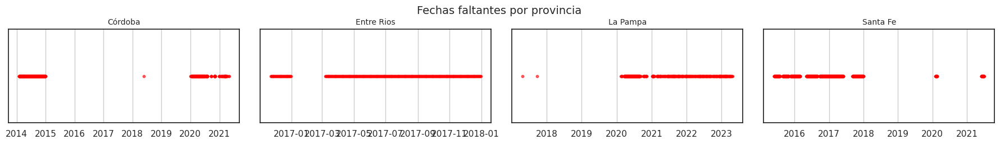

In [138]:
# Preparar el dataframe: agregar una columna constante para el eje Y
df_fechas_faltantes["Y"] = 1

# Obtener lista de provincias
provincias = df_fechas_faltantes["Provincia"].unique()
n = len(provincias)

# Calcular tamaño de grid (cuadrado o casi cuadrado)
cols = 4  # podés ajustar este número
rows = math.ceil(n / cols)

# Crear figura
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 2.5), sharex=False)
axes = axes.flatten()  # para poder indexar fácilmente
# Graficar por provincia
for i, provincia in enumerate(provincias):
    ax = axes[i]
    datos = df_fechas_faltantes[df_fechas_faltantes["Provincia"] == provincia]
    ax.scatter(datos["Fecha"], datos["Y"], s=10, color='red', alpha=0.6)
    ax.set_title(provincia, fontsize=10)
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.grid(True)

# Quitar ejes vacíos si sobran
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Layout prolijo
plt.tight_layout()
plt.suptitle("Fechas faltantes por provincia", fontsize=14, y=1.02)
plt.show()


In [141]:
provincias

array(['Córdoba', 'Entre Rios', 'La Pampa', 'Santa Fe'], dtype=object)

In [143]:


# Obtener rango deseado por provincia (año mínimo a año máximo - 1)
rango_fechas = df_largo.groupby("Provincia")["Fecha"].agg(["min", "max"]).reset_index()
rango_fechas["Fecha_min"] = pd.to_datetime(rango_fechas["min"].dt.year.astype(str) + "-01-01")
rango_fechas["Fecha_max"] = pd.to_datetime((rango_fechas["max"].dt.year - 1).astype(str) + "-12-31")

#  Buscar fechas faltantes por provincia
fechas_faltantes = []

for _, row in rango_fechas.iterrows():
    provincia = row["Provincia"]
    fecha_inicio = row["Fecha_min"]
    fecha_fin = row["Fecha_max"]
    
    # Fechas completas esperadas
    fechas_completas = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="D")
    
    # Fechas existentes en df
    fechas_existentes = df_largo[df_largo["Provincia"] == provincia]["Fecha"].unique()
    
    # Obtener fechas que faltan
    faltantes = sorted(set(fechas_completas) - set(fechas_existentes))
    
    # Guardar provincia + fecha faltante
    fechas_faltantes.extend([{"Provincia": provincia, "Fecha": f} for f in faltantes])

#  Crear DataFrame con fechas faltantes
df_fechas_faltantes = pd.DataFrame(fechas_faltantes)

#  Crear registros vacíos con valores nulos y completar info básica
df_placeholder = pd.DataFrame(columns=df_largo.columns)
df_placeholder["Fecha"] = df_fechas_faltantes["Fecha"]
df_placeholder["Provincia"] = df_fechas_faltantes["Provincia"]
df_placeholder["MES"] = df_placeholder["Fecha"].dt.month
df_placeholder["YEAR"] = df_placeholder["Fecha"].dt.year

#  Concatenar al DataFrame original
df_completo = pd.concat([df_largo, df_placeholder], ignore_index=True)

#  Ordenar por provincia y fecha
df_completo = df_completo.sort_values(by=["Provincia", "Fecha"]).reset_index(drop=True)


/tmp/ipykernel_1724844/2292806287.py:37: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_completo = pd.concat([df_largo, df_placeholder], ignore_index=True)


In [145]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 229021 entries, 0 to 229020
Data columns (total 15 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            229021 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               226901 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      226901 non-null  float64       
 4   Humedad_Media_8_14_20            226901 non-null  float64       
 5   Temperatura_Abrigo_150cm         226901 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  226901 non-null  float64       
 7   Velocidad_Viento_200cm_Media     226901 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  226901 non-null  float64       
 9   Provincia                        229021 non-null  object        
 10  Localidad                        226901 non-

'\n# Paso 1: obtener rango de fechas ideal para cada provincia\nrango_fechas = df_completo.groupby("Provincia")["Fecha"].agg(["min", "max"]).reset_index()\nrango_fechas["Fecha_min"] = pd.to_datetime(rango_fechas["min"].dt.year.astype(str) + "-01-01")\nrango_fechas["Fecha_max"] = pd.to_datetime((rango_fechas["max"].dt.year - 1).astype(str) + "-12-31")\n\n# Paso 2: para cada provincia, generar fechas completas y comparar\nfechas_faltantes = []\n\nfor _, row in rango_fechas.iterrows():\n    provincia = row["Provincia"]\n    fecha_inicio = row["Fecha_min"]\n    fecha_fin = row["Fecha_max"]\n    \n    # Generar fechas completas\n    fechas_completas = pd.date_range(start=fecha_inicio, end=fecha_fin, freq="D")\n    \n    # Fechas realmente presentes en df_filtrado\n    fechas_existentes = df_completo[df_completo["Provincia"] == provincia]["Fecha"].unique()\n    \n    # Fechas faltantes\n    faltantes = sorted(set(fechas_completas) - set(fechas_existentes))\n    \n    # Guardar en una lista\n

In [150]:
# Ver cuántas filas están completamente vacías (todas las columnas NaN)
filas_nulas_totales = df_completo.isnull().all(axis=1).sum()
print(f"Filas completamente nulas antes de eliminar: {filas_nulas_totales}")

# Eliminar filas completamente nulas
df_completo = df_completo[~df_completo.isnull().all(axis=1)]

# Verificar nuevamente
filas_nulas_totales_despues = df_completo.isnull().all(axis=1).sum()
print(f"Filas completamente nulas después de eliminar: {filas_nulas_totales_despues}")


Filas completamente nulas antes de eliminar: 0
Filas completamente nulas después de eliminar: 0


In [152]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 229021 entries, 0 to 229020
Data columns (total 15 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            229021 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               226901 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      226901 non-null  float64       
 4   Humedad_Media_8_14_20            226901 non-null  float64       
 5   Temperatura_Abrigo_150cm         226901 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  226901 non-null  float64       
 7   Velocidad_Viento_200cm_Media     226901 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  226901 non-null  float64       
 9   Provincia                        229021 non-null  object        
 10  Localidad                        226901 non-

In [155]:
completar_valores_normal(df_completo,'Velocidad_Viento_200cm_Media',provincias)
completar_valores_medios(df_completo,'Tesion_Vapor_Media',provincias)
completar_valores_normal(df_completo,'Precipitacion_Pluviometrica',provincias)
completar_valores_medios(df_completo,'Humedad_Media_8_14_20',provincias)
completar_valores_medios(df_completo,'Temperatura_Abrigo_150cm',provincias)
completar_valores_normal(df_completo,'Temperatura_Abrigo_150cm_Minima',provincias)
completar_valores_normal(df_completo,'Temperatura_Abrigo_150cm_Maxima',provincias)


,Fecha,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Humedad_Media_8_14_20,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Provincia,Localidad,Latitud,Longitud,MES,YEAR
0,1970-01-01,23.200000,19.900000,0.0,56.0,28.15,21.4,8.8,34.9,Buenos Aires,San Pedro,-33.736500,-59.796906,1,1970
1,1970-01-01,24.000000,20.400000,7.5,62.0,29.55,21.4,8.8,37.7,Buenos Aires,Villarino,-39.380001,-62.619999,1,1970
2,1970-01-01,27.900000,22.900000,0.0,75.0,20.15,7.1,20.0,33.2,Buenos Aires,Balcarce,-37.750000,-58.299999,1,1970
3,1970-01-01,24.500000,20.800000,0.0,59.0,28.45,23.5,14.4,33.4,Buenos Aires,Hurlingham,-34.605499,-58.671001,1,1970
4,1970-01-01,27.700000,22.800000,3.2,60.0,28.00,20.0,15.2,36.0,Buenos Aires,Tres Arroyos,-38.320000,-60.250000,1,1970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229016,2023-04-23,17.017351,14.940038,0.0,83.0,18.00,14.3,5.9,22.3,Santa Fe,Vera,-31.180000,-61.549999,4,2023
229017,2023-04-24,18.991867,16.678568,5.0,91.0,18.10,15.8,4.0,20.5,Santa Fe,Vera,-31.180000,-61.549999,4,2023
229018,2023-04-25,18.233244,16.048029,1.2,87.0,18.40,13.5,4.0,23.0,Santa Fe,Vera,-31.180000,-61.549999,4,2023
229019,2023-04-26,17.385754,15.305370,0.0,73.0,20.90,11.3,4.0,27.8,Santa Fe,Vera,-31.180000,-61.549999,4,2023


In [157]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 229021 entries, 0 to 229020
Data columns (total 15 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            229021 non-null  datetime64[ns]
 1   Tesion_Vapor_Media               229020 non-null  float64       
 2   Rocio_Medio                      226901 non-null  float64       
 3   Precipitacion_Pluviometrica      229020 non-null  float64       
 4   Humedad_Media_8_14_20            229020 non-null  float64       
 5   Temperatura_Abrigo_150cm         229020 non-null  float64       
 6   Temperatura_Abrigo_150cm_Minima  229020 non-null  float64       
 7   Velocidad_Viento_200cm_Media     229020 non-null  float64       
 8   Temperatura_Abrigo_150cm_Maxima  229020 non-null  float64       
 9   Provincia                        229021 non-null  object        
 10  Localidad                        226901 non-

In [159]:
modas = df_completo.groupby("Provincia").agg({
    "Localidad": lambda x: x.mode().iloc[0] if not x.mode().empty else None,
    "Latitud": lambda x: x.mode().iloc[0] if not x.mode().empty else None,
    "Longitud": lambda x: x.mode().iloc[0] if not x.mode().empty else None
}).reset_index()

# Crear un dataframe con los valores nulos en esas columnas
mascara_nulos = df_completo["Localidad"].isnull() | df_completo["Latitud"].isnull() | df_completo["Longitud"].isnull()
df_nulos = df_completo[mascara_nulos]

# Reemplazar los valores nulos con las modas
df_nulos = df_nulos.drop(columns=["Localidad", "Latitud", "Longitud"])
df_nulos = df_nulos.merge(modas, on="Provincia", how="left")

# Combinar con el resto del dataframe
df_no_nulos = df_completo[~mascara_nulos]
df_completo_actualizado = pd.concat([df_no_nulos, df_nulos], ignore_index=True)


In [165]:
df_completo_actualizado.to_csv(destino_archivos+"clima_completo_largo.csv")

In [262]:
# Limitamos los registros hasta finales del 2022 para homogenizar los registros
df_completo_actualizado = df_completo_actualizado[df_completo_actualizado['YEAR']<2023] 

In [351]:
mes = 1  # Enero



def variacion_anual_media_mensual(df,mes,variable):

    # Filtramos el DataFrame por ese mes
    df_mes = df[df['MES'] == mes]

    # Agrupamos por año y provincia, sacando el promedio de la variable
    df_agg = df_mes.groupby(['YEAR', 'Provincia'])[variable].mean().reset_index()

    # Pivotamos para tener una curva por provincia
    df_pivot = df_agg.pivot(index='YEAR', columns='Provincia', values=variable)

    # Graficamos
    plt.figure(figsize=(14, 7))
    for provincia in df_pivot.columns:
        plt.plot(df_pivot.index, df_pivot[provincia], label=provincia)

    plt.title(f'{variable} media en el mes {mes_objetivo} por Provincia a lo largo de los años')
    plt.xlabel('Año')
    plt.ylabel(f'{variable} media')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    plt.tight_layout()
    plt.show()

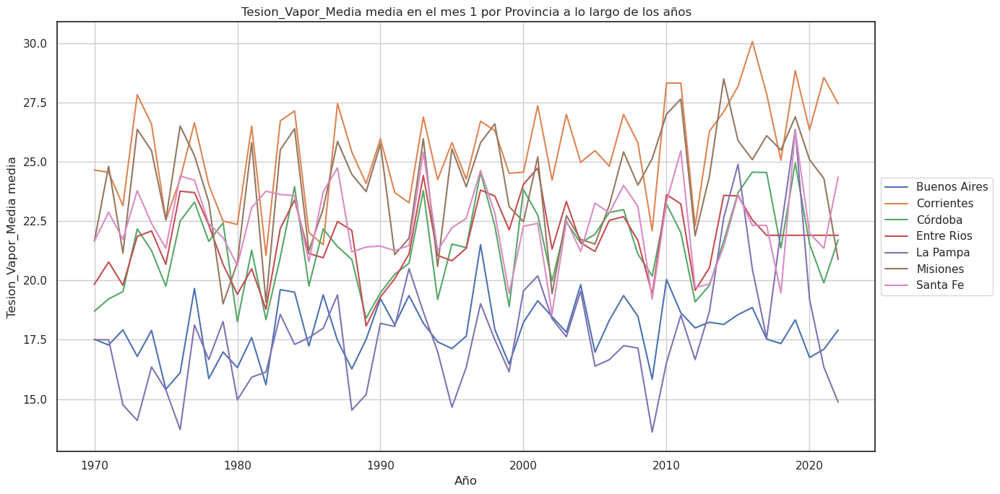

In [353]:
variacion_anual_media_mensual(df_completo_actualizado,1,variables[0])

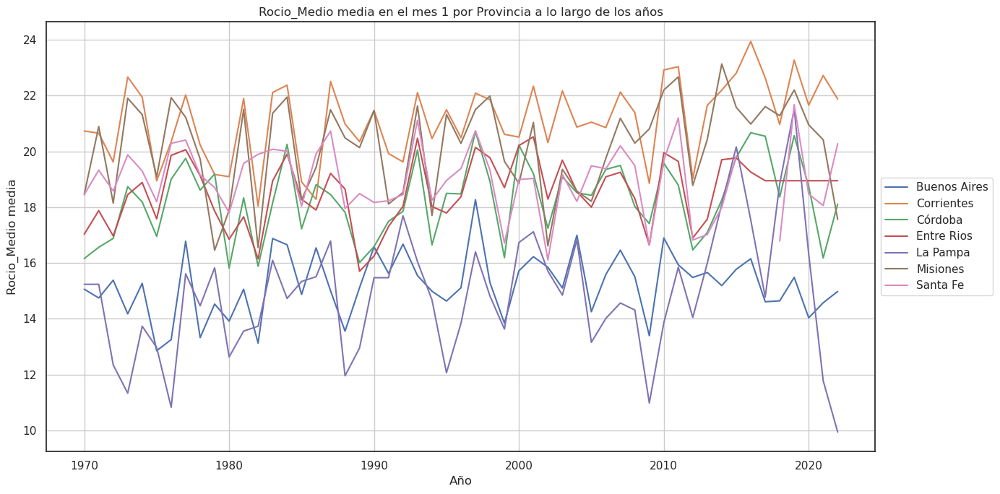

In [355]:
variacion_anual_media_mensual(df_completo_actualizado,1,variables[1])

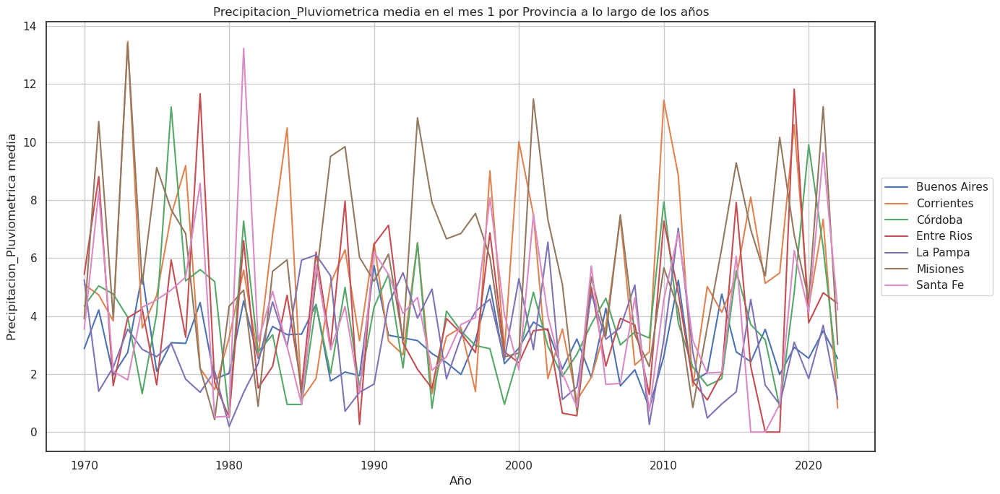

In [357]:
variacion_anual_media_mensual(df_completo_actualizado,1,variables[2])

In [365]:
def variacion_media_mensual_quinquenal(df, mes, variable):
    import matplotlib.pyplot as plt

    # Filtramos por el mes deseado
    df_mes = df[df['MES'] == mes].copy()

    # Creamos una columna 'QUINQUENIO' redondeando el año hacia abajo al múltiplo de 5
    df_mes['QUINQUENIO'] = (df_mes['YEAR'] // 5) * 5

    # Agrupamos por quinquenio y provincia
    df_agg = df_mes.groupby(['QUINQUENIO', 'Provincia'])[variable].mean().reset_index()

    # Pivotamos para tener una curva por provincia
    df_pivot = df_agg.pivot(index='QUINQUENIO', columns='Provincia', values=variable)

    # Graficamos
    plt.figure(figsize=(14, 7))
    for provincia in df_pivot.columns:
        plt.plot(df_pivot.index, df_pivot[provincia], marker='o', label=provincia)

    plt.title(f'{variable} media en el mes {mes} cada 5 años por Provincia')
    plt.xlabel('Quinquenio')
    plt.ylabel(f'{variable} media')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)
    plt.tight_layout


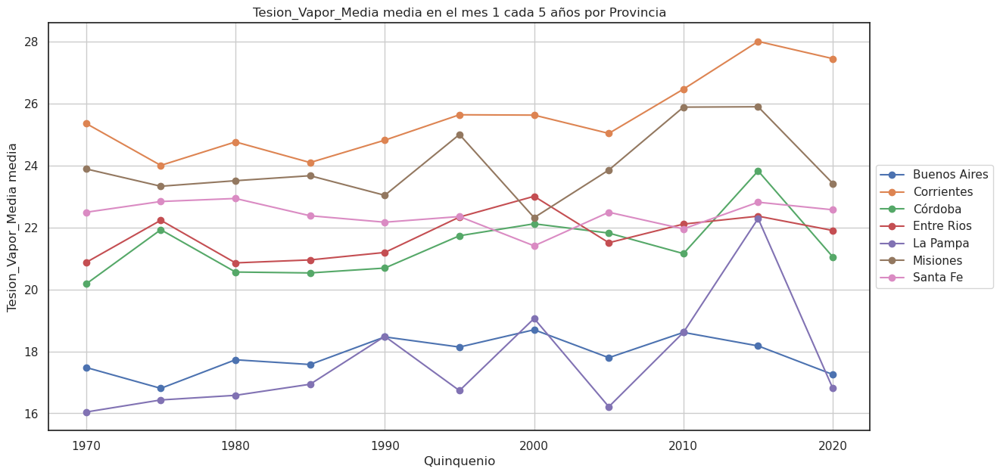

In [367]:
variacion_media_mensual_quinquenal(df_completo_actualizado,1,variables[0])

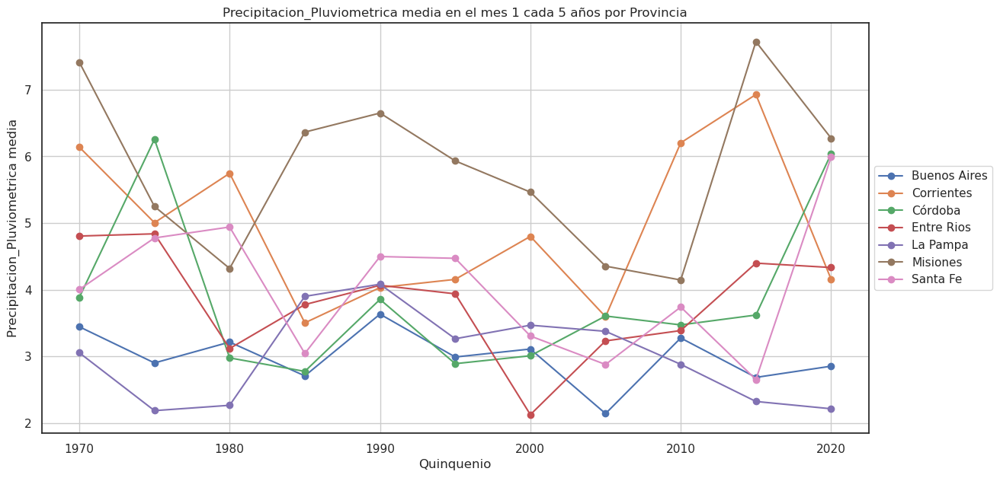

In [371]:
variacion_media_mensual_quinquenal(df_completo_actualizado,1,variables[2])

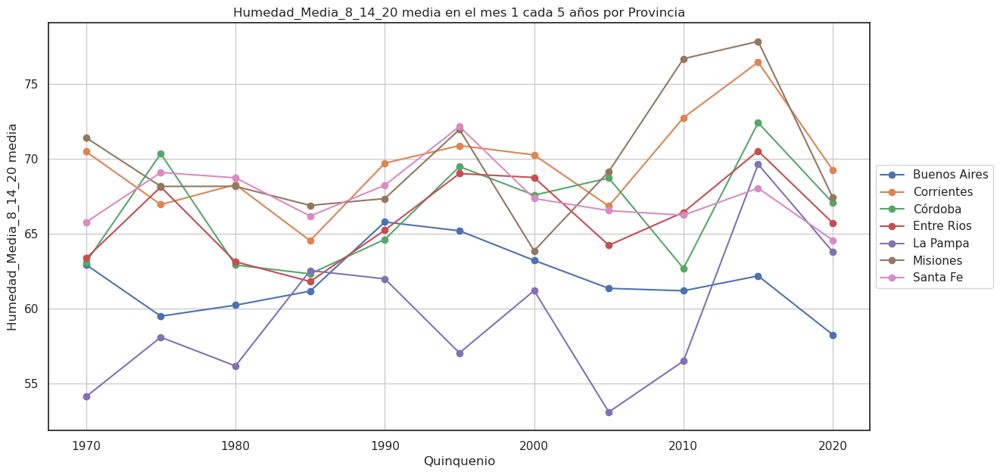

In [373]:
variacion_media_mensual_quinquenal(df_completo_actualizado,1,variables[3])

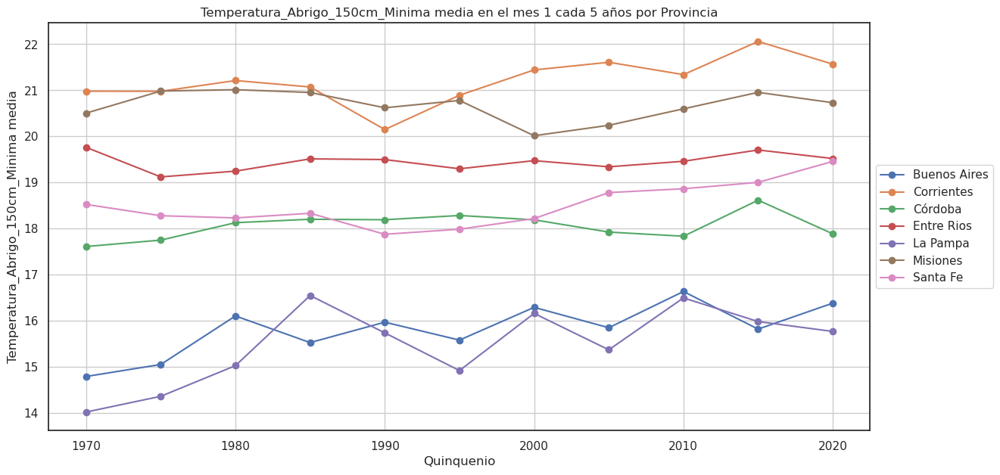

In [375]:
variacion_media_mensual_quinquenal(df_completo_actualizado,1,variables[5])

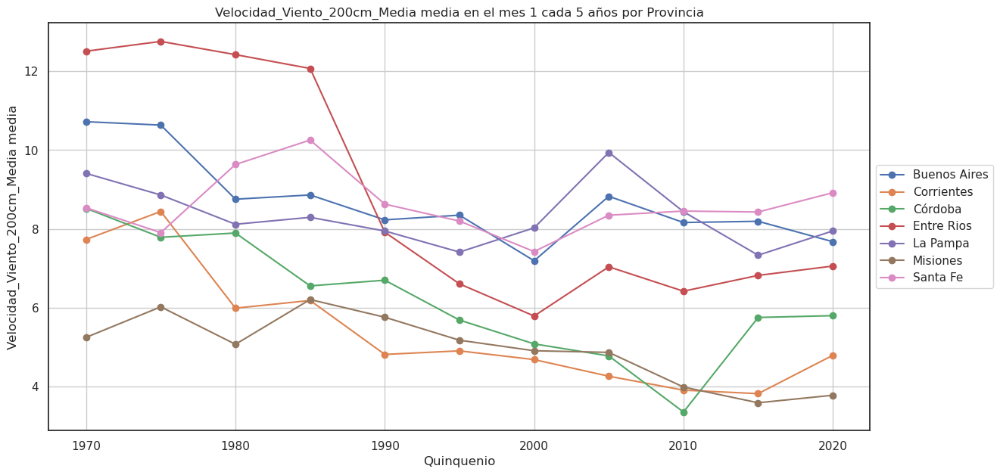

In [379]:
variacion_media_mensual_quinquenal(df_completo_actualizado,1,variables[7])

In [ ]:
# Sume la tesion de vapor media
# BsAs presenta menor humedad mientras que las otras provincias podrian estar subiendo este valor

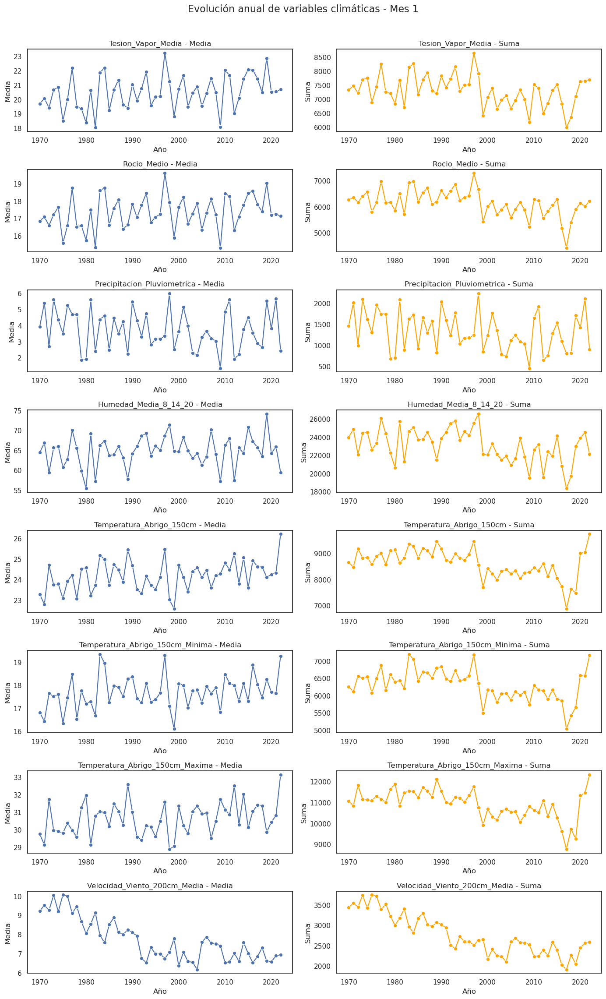

In [302]:
df = df_completo_actualizado.copy()
mes_objetivo = 1  # Enero

# Filtrar solo ese mes
df_mes = df[df['MES'] == mes_objetivo]

# Lista de variables numéricas a graficar
variables = [
    'Tesion_Vapor_Media', 'Rocio_Medio', 'Precipitacion_Pluviometrica',
    'Humedad_Media_8_14_20', 'Temperatura_Abrigo_150cm',
    'Temperatura_Abrigo_150cm_Minima', 'Temperatura_Abrigo_150cm_Maxima',
    'Velocidad_Viento_200cm_Media'
]

# Crear figura
fig, axes = plt.subplots(nrows=len(variables), ncols=2, figsize=(14, len(variables)*3))
fig.suptitle(f'Evolución anual de variables climáticas - Mes {mes_objetivo}', fontsize=16)

for i, var in enumerate(variables):
    # Agrupar por año
    resumen = df_mes.groupby('YEAR')[var].agg(['mean', 'sum'])

    # Graficar media
    sns.lineplot(x=resumen.index, y=resumen['mean'], ax=axes[i, 0], marker='o')
    axes[i, 0].set_title(f'{var} - Media')
    axes[i, 0].set_xlabel('Año')
    axes[i, 0].set_ylabel('Media')

    # Graficar suma
    sns.lineplot(x=resumen.index, y=resumen['sum'], ax=axes[i, 1], marker='o', color='orange')
    axes[i, 1].set_title(f'{var} - Suma')
    axes[i, 1].set_xlabel('Año')
    axes[i, 1].set_ylabel('Suma')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

In [304]:
df = df_completo_actualizado.copy()

# Agrupar por Fecha y Provincia, promediando los valores numéricos
df_agrupado = (
    df.drop(columns=['Latitud', 'Longitud', 'Localidad'])  # Eliminar columnas no deseadas
      .groupby(['Fecha', 'Provincia'], as_index=False)
      .mean(numeric_only=True)
)

# Si querés volver a calcular MES y YEAR en base a la nueva Fecha:
df_agrupado['MES'] = df_agrupado['Fecha'].dt.month
df_agrupado['YEAR'] = df_agrupado['Fecha'].dt.year


In [306]:
df_agrupado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135506 entries, 0 to 135505
Data columns (total 12 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            135506 non-null  datetime64[ns]
 1   Provincia                        135506 non-null  object        
 2   Tesion_Vapor_Media               135506 non-null  float64       
 3   Rocio_Medio                      133437 non-null  float64       
 4   Precipitacion_Pluviometrica      135506 non-null  float64       
 5   Humedad_Media_8_14_20            135506 non-null  float64       
 6   Temperatura_Abrigo_150cm         135506 non-null  float64       
 7   Temperatura_Abrigo_150cm_Minima  135506 non-null  float64       
 8   Velocidad_Viento_200cm_Media     135506 non-null  float64       
 9   Temperatura_Abrigo_150cm_Maxima  135506 non-null  float64       
 10  MES                              135506 non-

In [308]:
df_agrupado

,Fecha,Provincia,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Humedad_Media_8_14_20,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,MES,YEAR
0,1970-01-01,Buenos Aires,25.460000,21.360000,2.14,62.400000,26.860000,18.680000,13.440000,35.040000,1,1970
1,1970-01-01,Corrientes,25.200000,21.200000,0.65,66.500000,27.025000,20.300000,6.000000,33.750000,1,1970
2,1970-01-01,Córdoba,22.600000,19.500000,0.00,56.000000,28.050000,22.400000,4.800000,33.700000,1,1970
3,1970-01-01,Entre Rios,22.400000,19.300000,0.00,58.000000,27.500000,22.000000,14.400000,33.000000,1,1970
4,1970-01-01,La Pampa,17.500000,15.237710,32.50,59.527623,29.150000,20.100000,7.700000,38.200000,1,1970
...,...,...,...,...,...,...,...,...,...,...,...,...
135501,2022-12-31,Córdoba,19.600000,17.200000,7.00,63.021820,23.388722,17.252513,4.533333,29.462631,12,2022
135502,2022-12-31,Entre Rios,20.000000,17.500000,0.00,40.000000,32.000000,24.500000,6.400000,39.500000,12,2022
135503,2022-12-31,La Pampa,15.500000,13.400000,4.00,58.089410,21.829460,15.725388,8.800000,28.698370,12,2022
135504,2022-12-31,Misiones,15.173649,13.129405,0.00,35.000000,27.700000,20.600000,3.625000,34.800000,12,2022


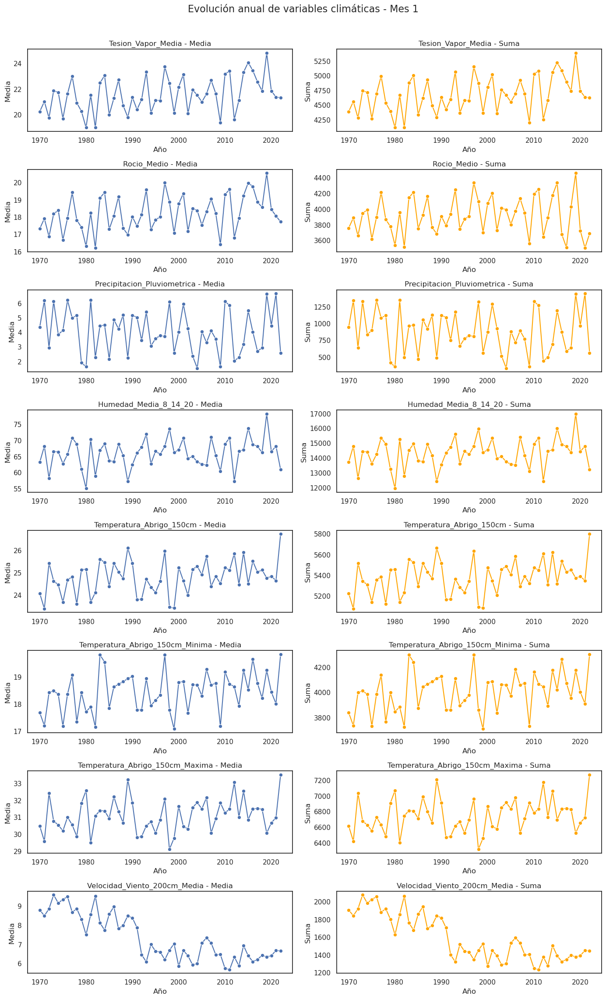

In [310]:
df = df_agrupado.copy()
mes_objetivo = 1  # Enero

# Filtrar solo ese mes
df_mes = df[df['MES'] == mes_objetivo]

# Lista de variables numéricas a graficar
variables = [
    'Tesion_Vapor_Media', 'Rocio_Medio', 'Precipitacion_Pluviometrica',
    'Humedad_Media_8_14_20', 'Temperatura_Abrigo_150cm',
    'Temperatura_Abrigo_150cm_Minima', 'Temperatura_Abrigo_150cm_Maxima',
    'Velocidad_Viento_200cm_Media'
]

# Crear figura
fig, axes = plt.subplots(nrows=len(variables), ncols=2, figsize=(14, len(variables)*3))
fig.suptitle(f'Evolución anual de variables climáticas - Mes {mes_objetivo}', fontsize=16)

for i, var in enumerate(variables):
    # Agrupar por año
    resumen = df_mes.groupby('YEAR')[var].agg(['mean', 'sum'])

    # Graficar media
    sns.lineplot(x=resumen.index, y=resumen['mean'], ax=axes[i, 0], marker='o')
    axes[i, 0].set_title(f'{var} - Media')
    axes[i, 0].set_xlabel('Año')
    axes[i, 0].set_ylabel('Media')

    # Graficar suma
    sns.lineplot(x=resumen.index, y=resumen['sum'], ax=axes[i, 1], marker='o', color='orange')
    axes[i, 1].set_title(f'{var} - Suma')
    axes[i, 1].set_xlabel('Año')
    axes[i, 1].set_ylabel('Suma')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

In [381]:
# Luego de evaluar la variacion quinquenal y la variacion anual de algunas variables decidimos tomar las que presentan algun tipo de variacion a lo largo del tiempo que pudiera ser interesante conciderar

variables = [
    "Tesion_Vapor_Media",
    "Rocio_Medio",
    "Precipitacion_Pluviometrica",
    "Humedad_Media_8_14_20"

]

In [383]:
# Al momento tenemos dos dataframe para trabajar con distintos abordajes
# df_completo_actualizado tiene todos los registros posibles de todas las locaciones, incluyendo duplicidades en una misma fecha para una provincia
# df_agrupado tiene 1 solo registro por fecha/provincia considerando la media entre todas las mediciones de las estaciones en dicha provincia para dicha fecha


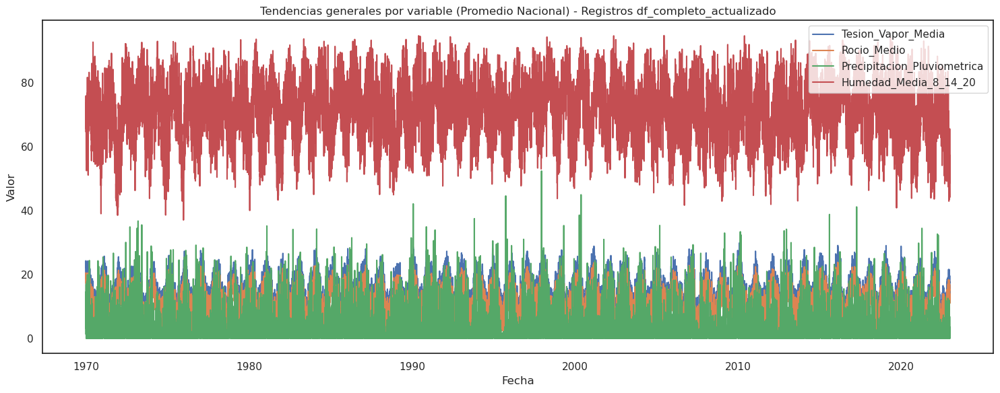

In [385]:

# Agrupar por Fecha y promediar todas las provincias
df_promedios = df_completo_actualizado.groupby("Fecha")[variables].mean().reset_index()

# Plot general
plt.figure(figsize=(15, 6))
for var in variables:
    sns.lineplot(data=df_promedios, x="Fecha", y=var, label=var, linewidth=1.5)

plt.title("Tendencias generales por variable (Promedio Nacional) - Registros df_completo_actualizado")
plt.xlabel("Fecha")
plt.ylabel("Valor")
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

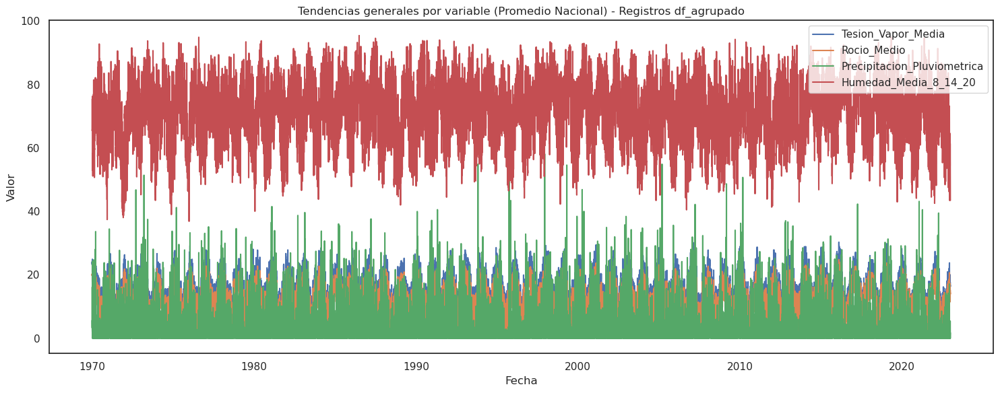

In [387]:

# Agrupar por Fecha y promediar todas las provincias
df_promedios = df_agrupado.groupby("Fecha")[variables].mean().reset_index()

# Plot general
plt.figure(figsize=(15, 6))
for var in variables:
    sns.lineplot(data=df_promedios, x="Fecha", y=var, label=var, linewidth=1.5)

plt.title("Tendencias generales por variable (Promedio Nacional) - Registros df_agrupado")
plt.xlabel("Fecha")
plt.ylabel("Valor")
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

In [268]:
# ESTOS GRAFICOS TOMAN MUCHO TIEMPO PARA EJECUTARSE
"""
# Obtener provincias únicas
provincias = df_completo_actualizado["Provincia"].unique()
n_provincias = len(provincias)
n_variables = len(variables)

# Tamaño de figura ajustado según cantidad de gráficos
fig, axes = plt.subplots(nrows=n_provincias, ncols=n_variables, figsize=(4 * n_variables, 3 * n_provincias), sharex=True)

# Loop por cada provincia y variable
for i, provincia in enumerate(provincias):
    df_prov = df_completo_actualizado[df_completo_actualizado["Provincia"] == provincia]
    
    for j, var in enumerate(variables):
        ax = axes[i, j]
        sns.lineplot(data=df_prov, x="Fecha", y=var, ax=ax, linewidth=0.8)
        ax.set_title(f"{provincia} - {var}", fontsize=8)
        ax.set_xlabel("")
        ax.set_ylabel("")
        ax.tick_params(labelsize=6)

# Ajustes de presentación
plt.suptitle("Evolución temporal por Provincia y Variable", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()
"""

'\n# Obtener provincias únicas\nprovincias = df_completo_actualizado["Provincia"].unique()\nn_provincias = len(provincias)\nn_variables = len(variables)\n\n# Tamaño de figura ajustado según cantidad de gráficos\nfig, axes = plt.subplots(nrows=n_provincias, ncols=n_variables, figsize=(4 * n_variables, 3 * n_provincias), sharex=True)\n\n# Loop por cada provincia y variable\nfor i, provincia in enumerate(provincias):\n    df_prov = df_completo_actualizado[df_completo_actualizado["Provincia"] == provincia]\n    \n    for j, var in enumerate(variables):\n        ax = axes[i, j]\n        sns.lineplot(data=df_prov, x="Fecha", y=var, ax=ax, linewidth=0.8)\n        ax.set_title(f"{provincia} - {var}", fontsize=8)\n        ax.set_xlabel("")\n        ax.set_ylabel("")\n        ax.tick_params(labelsize=6)\n\n# Ajustes de presentación\nplt.suptitle("Evolución temporal por Provincia y Variable", fontsize=16, y=1.02)\nplt.tight_layout()\nplt.show()\n'

In [389]:



dict_completo = crear_dic_estadisticos(df_completo_actualizado,variables)
    

{'Buenos Aires': {1: {'Tesion_Vapor_Media': {'Q1': 14.5, 'Q3': 21.2, 'IQR': 6.699999999999999, 'Media': 17.903413707295286, 'Desviacion_estandar': 4.639293994073514}, 'Rocio_Medio': {'Q1': 12.4, 'Q3': 18.4, 'IQR': 5.999999999999998, 'Media': 15.234170826442163, 'Desviacion_estandar': 4.273007361248614}, 'Precipitacion_Pluviometrica': {'Q1': 0.0, 'Q3': 0.0, 'IQR': 0.0, 'Media': 3.009925558312655, 'Desviacion_estandar': 9.990580288325718}, 'Humedad_Media_8_14_20': {'Q1': 52.0, 'Q3': 71.0, 'IQR': 19.0, 'Media': 62.02476414203121, 'Desviacion_estandar': 13.82275046325604}}, 2: {'Tesion_Vapor_Media': {'Q1': 14.5, 'Q3': 21.3, 'IQR': 6.800000000000001, 'Media': 17.99645786262255, 'Desviacion_estandar': 4.588837516236524}, 'Rocio_Medio': {'Q1': 12.4, 'Q3': 18.5, 'IQR': 6.1, 'Media': 15.346229114210816, 'Desviacion_estandar': 4.17902023678188}, 'Precipitacion_Pluviometrica': {'Q1': 0.0, 'Q3': 0.0, 'IQR': 0.0, 'Media': 3.293940631808279, 'Desviacion_estandar': 10.67613652504859}, 'Humedad_Media_

In [87]:
dict_agrupado = crear_dic_estadisticos(df_agrupado,variables)

{'Buenos Aires': {1: {'Tesion_Vapor_Media': {'Q1': 15.57, 'Q3': 20.22, 'IQR': 4.649999999999999, 'Media': 17.90368501618584, 'Desviacion_estandar': 3.397101152344657}, 'Rocio_Medio': {'Q1': 13.3, 'Q3': 17.46, 'IQR': 4.16, 'Media': 15.23168360230763, 'Desviacion_estandar': 3.1489234490170848}, 'Precipitacion_Pluviometrica': {'Q1': 0.0, 'Q3': 3.295, 'IQR': 3.295, 'Media': 3.007510651247718, 'Desviacion_estandar': 5.88850949764665}, 'Humedad_Media_8_14_20': {'Q1': 55.6, 'Q3': 68.4, 'IQR': 12.800000000000004, 'Media': 61.98811308396488, 'Desviacion_estandar': 9.592517994190382}, 'Temperatura_Abrigo_150cm': {'Q1': 20.916316039059282, 'Q3': 24.58065801952964, 'IQR': 3.6643419804703576, 'Media': 22.63550018495152, 'Desviacion_estandar': 2.8108260372274043}, 'Temperatura_Abrigo_150cm_Minima': {'Q1': 13.936886067948809, 'Q3': 17.94, 'IQR': 4.003113932051193, 'Media': 15.798251526980769, 'Desviacion_estandar': 3.027219235672855}, 'Temperatura_Abrigo_150cm_Maxima': {'Q1': 27.28, 'Q3': 31.71, 'IQR

/tmp/ipykernel_1724844/3770274573.py:577: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


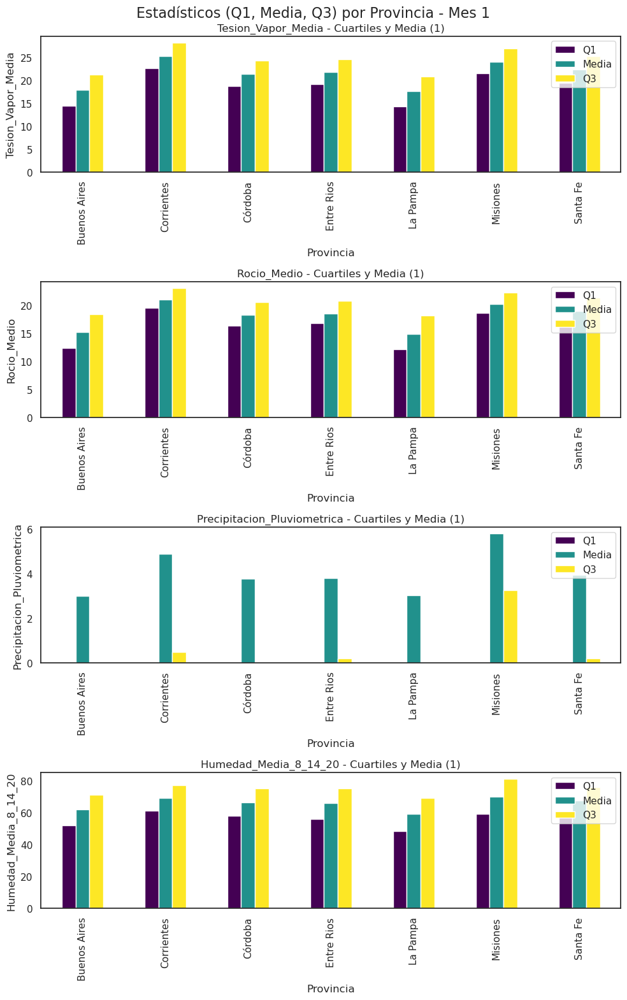

/tmp/ipykernel_1724844/3770274573.py:585: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
/tmp/ipykernel_1724844/3770274573.py:585: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
/tmp/ipykernel_1724844/3770274573.py:585: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
/tmp/ipykernel_1724844/37702

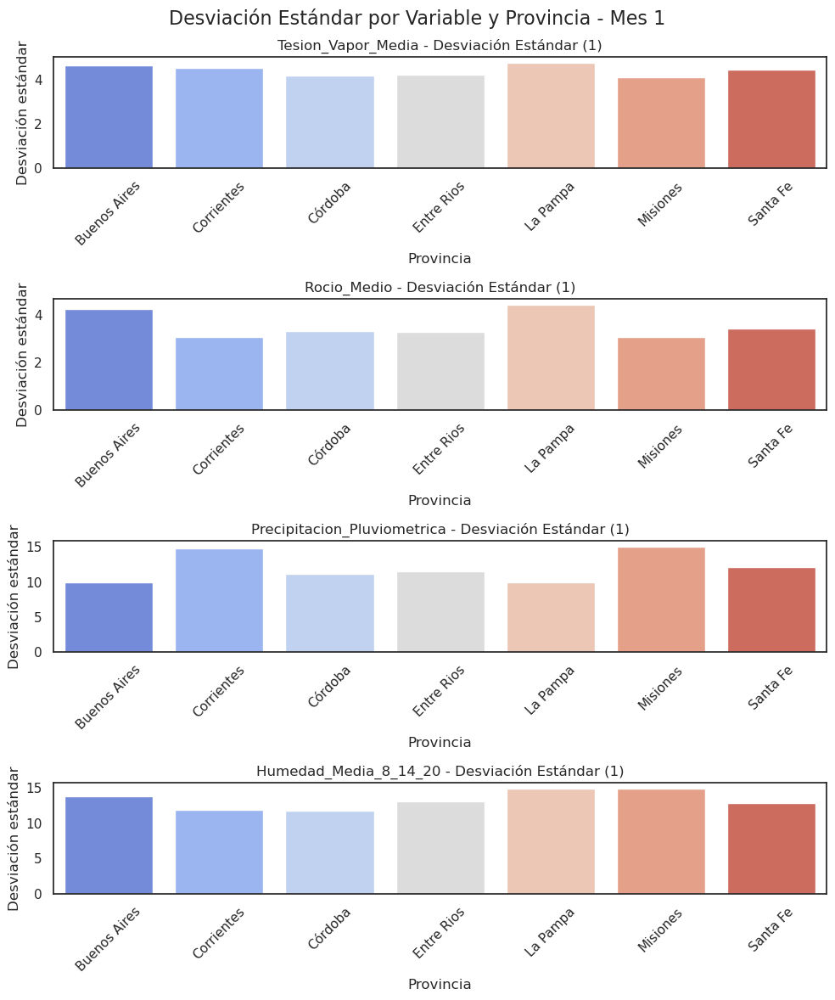

In [393]:

visualizar_estadisticos_filtro_mes(1,dict_completo)


/tmp/ipykernel_1724844/3770274573.py:577: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


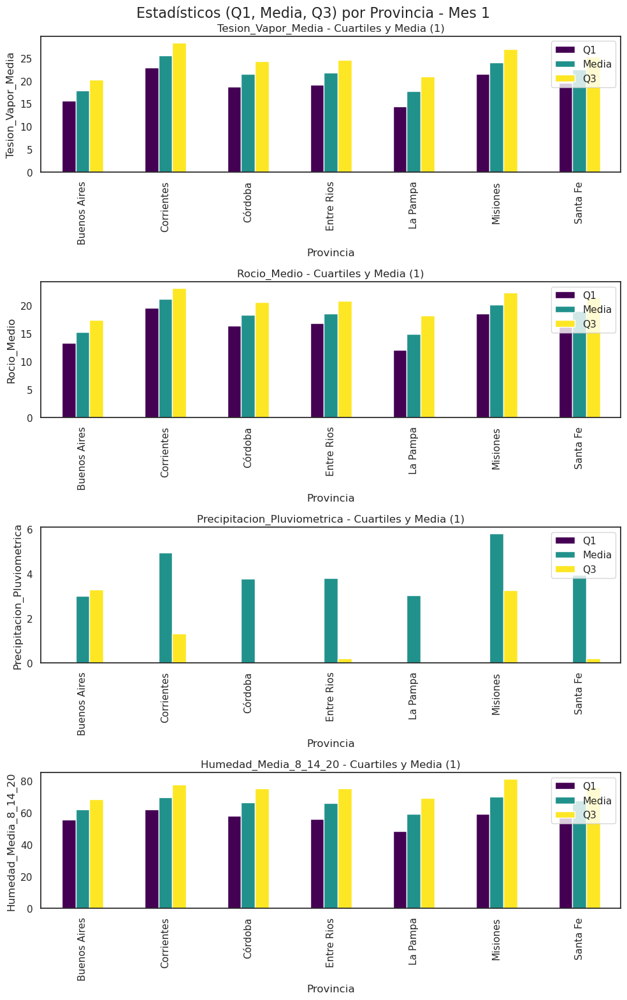

/tmp/ipykernel_1724844/3770274573.py:585: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
/tmp/ipykernel_1724844/3770274573.py:585: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
/tmp/ipykernel_1724844/3770274573.py:585: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
/tmp/ipykernel_1724844/37702

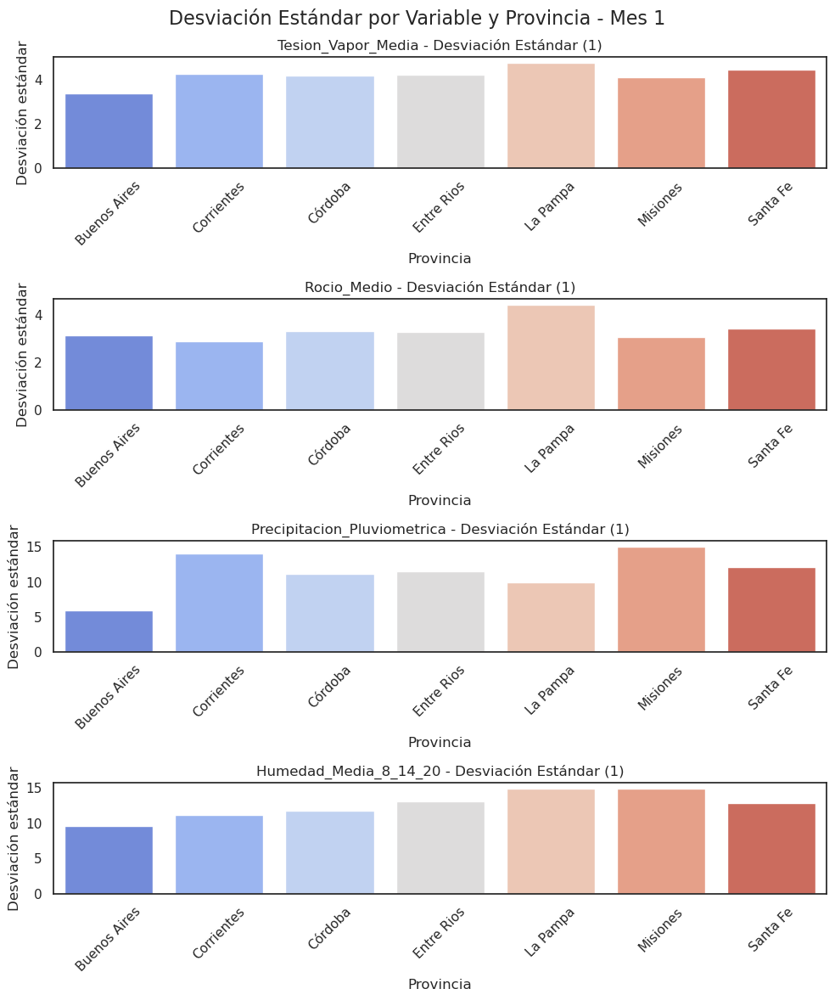

In [395]:
visualizar_estadisticos_filtro_mes(1,dict_agrupado)

/tmp/ipykernel_1724844/3770274573.py:577: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


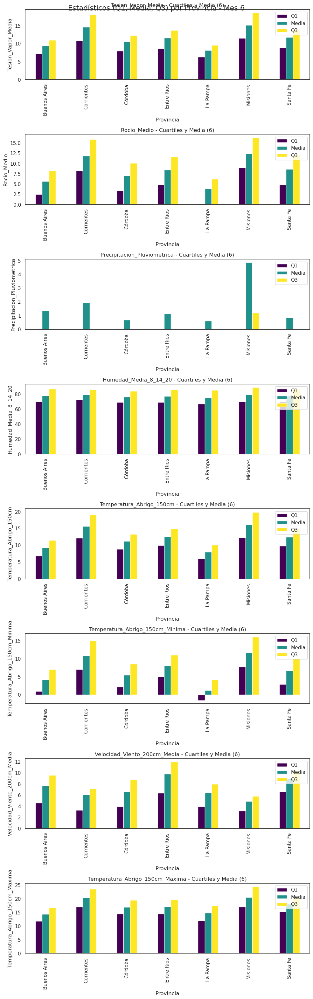

/tmp/ipykernel_1724844/3770274573.py:585: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
/tmp/ipykernel_1724844/3770274573.py:585: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
/tmp/ipykernel_1724844/3770274573.py:585: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df, x='Provincia', y='Desviacion_estandar', ax=axes[i], palette='coolwarm')
/tmp/ipykernel_1724844/37702

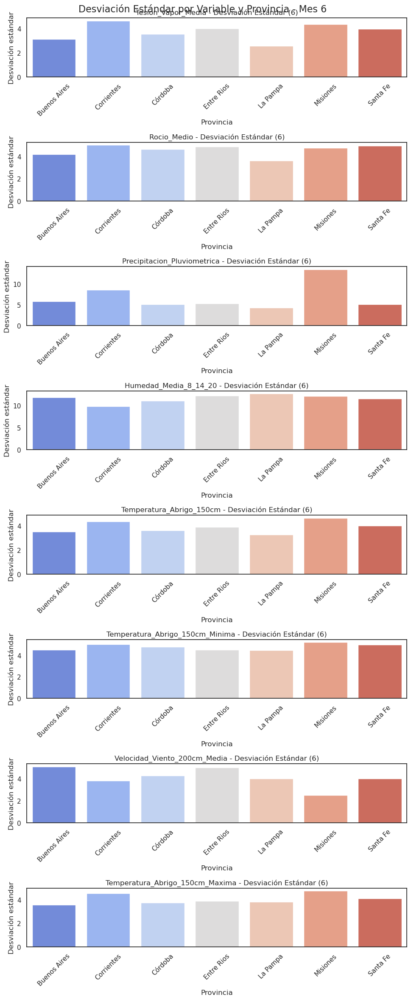

In [396]:
visualizar_estadisticos_filtro_mes(6,diccionario_estadisticos)

In [398]:
# ANALISIS DEL MES DE ENERO
# Tanto las medias como los STD por provincia tienen un comportamiento general similar para todas las provincias, solamente podemos ver una diferencia en la precipitacion pluviometrica y en la temperatura de abrigo que presentan particularidades en BSAS (Temperatura de Abrigo, mayor indice de variabilidad) y en Misiones,Corrientes,Entre Rios (Precipitacion pluviometrica, por lo que podemos entender que en dichas provincias hay eventos de lluvias intensos que suben los valores de Q3)

In [89]:
delta = 1.5
# Aplica la función para identificar outliers
df_completo_con_outliers = identificar_outliers(df_completo_actualizado.copy(), diccionario_estadisticos, variables,delta)
# Imprimir las primeras filas del DataFrame con las columnas de outliers


NameError: name 'df_completo_actualizado' is not defined

In [402]:
df_completo_con_outliers

,Fecha,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Humedad_Media_8_14_20,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Provincia,Localidad,Latitud,Longitud,MES,YEAR,Tesion_Vapor_Media_outlier,Rocio_Medio_outlier,Precipitacion_Pluviometrica_outlier,Humedad_Media_8_14_20_outlier
0,1970-01-01,23.200000,19.9,0.0,56.000000,28.150000,21.40,8.8,34.9,Buenos Aires,San Pedro,-33.736500,-59.796906,1,1970,False,False,False,False
1,1970-01-01,24.000000,20.4,7.5,62.000000,29.550000,21.40,8.8,37.7,Buenos Aires,Villarino,-39.380001,-62.619999,1,1970,False,False,True,False
2,1970-01-01,27.900000,22.9,0.0,75.000000,20.150000,7.10,20.0,33.2,Buenos Aires,Balcarce,-37.750000,-58.299999,1,1970,False,False,False,False
3,1970-01-01,24.500000,20.8,0.0,59.000000,28.450000,23.50,14.4,33.4,Buenos Aires,Hurlingham,-34.605499,-58.671001,1,1970,False,False,False,False
4,1970-01-01,27.700000,22.8,3.2,60.000000,28.000000,20.00,15.2,36.0,Buenos Aires,Tres Arroyos,-38.320000,-60.250000,1,1970,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229016,2021-06-26,11.738768,NaN,0.0,77.980498,12.476085,6.35,8.4,18.0,Santa Fe,Vera,-31.180000,-61.549999,6,2021,False,False,False,False
229017,2021-06-27,11.738768,NaN,0.0,77.980498,12.476085,6.35,8.4,18.0,Santa Fe,Vera,-31.180000,-61.549999,6,2021,False,False,False,False
229018,2021-06-28,11.738768,NaN,0.0,77.980498,12.476085,6.35,8.4,18.0,Santa Fe,Vera,-31.180000,-61.549999,6,2021,False,False,False,False
229019,2021-06-29,11.738768,NaN,0.0,77.980498,12.476085,6.35,8.4,18.0,Santa Fe,Vera,-31.180000,-61.549999,6,2021,False,False,False,False


In [403]:
df_completo_con_outliers[df_completo_con_outliers['Tesion_Vapor_Media_outlier']==True]

,Fecha,Tesion_Vapor_Media,Rocio_Medio,Precipitacion_Pluviometrica,Humedad_Media_8_14_20,Temperatura_Abrigo_150cm,Temperatura_Abrigo_150cm_Minima,Velocidad_Viento_200cm_Media,Temperatura_Abrigo_150cm_Maxima,Provincia,Localidad,Latitud,Longitud,MES,YEAR,Tesion_Vapor_Media_outlier,Rocio_Medio_outlier,Precipitacion_Pluviometrica_outlier,Humedad_Media_8_14_20_outlier
77,1970-01-16,2.700000,0.000000,0.0,75.0,19.1,10.1,5.6,28.1,Buenos Aires,Balcarce,-37.750000,-58.299999,1,1970,True,True,False,False
665,1970-05-14,20.800000,18.100000,0.0,99.0,18.5,16.8,4.8,20.2,Buenos Aires,San Pedro,-33.736500,-59.796906,5,1970,True,False,False,False
800,1970-06-10,20.300000,17.700000,0.0,99.0,17.3,14.8,4.8,19.8,Buenos Aires,San Pedro,-33.736500,-59.796906,6,1970,True,True,False,False
803,1970-06-10,19.200000,16.900000,0.0,90.0,17.7,15.0,5.6,20.4,Buenos Aires,Hurlingham,-34.605499,-58.671001,6,1970,True,False,False,False
805,1970-06-11,20.500000,17.900000,0.0,100.0,17.8,15.7,7.2,19.9,Buenos Aires,San Pedro,-33.736500,-59.796906,6,1970,True,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226508,2022-03-31,8.806026,5.057295,0.0,60.0,13.3,3.2,3.3,19.8,Santa Fe,Vera,-31.180000,-61.549999,3,2022,True,True,False,False
226622,2022-07-23,21.500360,18.471304,0.0,83.0,21.5,15.0,10.7,26.7,Santa Fe,Vera,-31.180000,-61.549999,7,2022,True,False,False,False
226623,2022-07-24,21.787466,18.499146,0.0,81.0,22.2,14.0,10.7,28.8,Santa Fe,Vera,-31.180000,-61.549999,7,2022,True,False,False,False
226655,2022-08-25,21.400652,18.443548,0.0,78.0,23.5,15.8,11.3,31.3,Santa Fe,Vera,-31.180000,-61.549999,8,2022,True,False,False,False


   Fecha            Variable_Outlier  Conteo_Outliers            Variable
0   1970  Tesion_Vapor_Media_outlier               45  Tesion_Vapor_Media
1   1971  Tesion_Vapor_Media_outlier               61  Tesion_Vapor_Media
2   1972  Tesion_Vapor_Media_outlier               59  Tesion_Vapor_Media
3   1973  Tesion_Vapor_Media_outlier               19  Tesion_Vapor_Media
4   1974  Tesion_Vapor_Media_outlier               36  Tesion_Vapor_Media


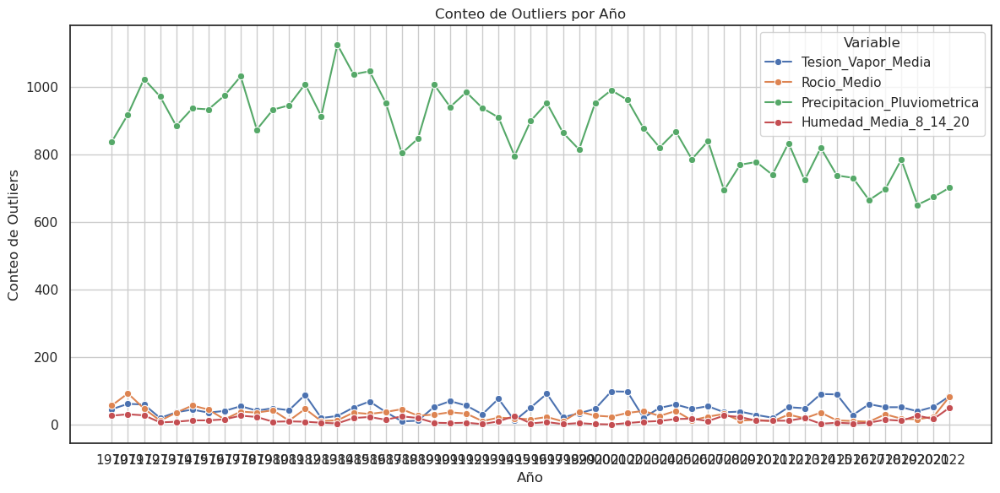

In [407]:

# Obtener el conteo de outliers por año
conteo_outliers_por_anio_df = contar_outliers_por_anio(df_completo_con_outliers, variables)

# Imprimir el DataFrame resultante
print(conteo_outliers_por_anio_df.head())


# Graficar el conteo de outliers por año
graficar_outliers_por_anio(conteo_outliers_por_anio_df, 'Conteo de Outliers por Año')


   Fecha            Variable_Outlier  Conteo_Outliers            Variable
0   1970  Tesion_Vapor_Media_outlier               79  Tesion_Vapor_Media
1   1971  Tesion_Vapor_Media_outlier              105  Tesion_Vapor_Media
2   1972  Tesion_Vapor_Media_outlier              104  Tesion_Vapor_Media
3   1973  Tesion_Vapor_Media_outlier               36  Tesion_Vapor_Media
4   1974  Tesion_Vapor_Media_outlier               57  Tesion_Vapor_Media


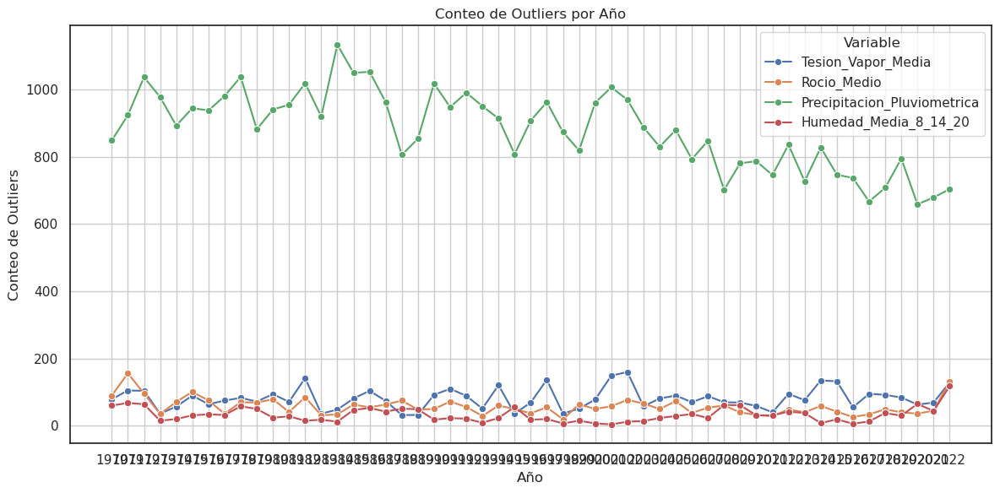

In [409]:
delta = 1.3
# Aplica la función para identificar outliers
df_completo_con_outliers = identificar_outliers(df_completo_actualizado.copy(), diccionario_estadisticos, variables,delta)

# Obtener el conteo de outliers por año
conteo_outliers_por_anio_df = contar_outliers_por_anio(df_completo_con_outliers, variables)

# Imprimir el DataFrame resultante
print(conteo_outliers_por_anio_df.head())


# Graficar el conteo de outliers por año
graficar_outliers_por_anio(conteo_outliers_por_anio_df, 'Conteo de Outliers por Año')



   Fecha            Variable_Outlier  Conteo_Outliers            Variable
0   1970  Tesion_Vapor_Media_outlier              172  Tesion_Vapor_Media
1   1971  Tesion_Vapor_Media_outlier              257  Tesion_Vapor_Media
2   1972  Tesion_Vapor_Media_outlier              230  Tesion_Vapor_Media
3   1973  Tesion_Vapor_Media_outlier               98  Tesion_Vapor_Media
4   1974  Tesion_Vapor_Media_outlier              121  Tesion_Vapor_Media


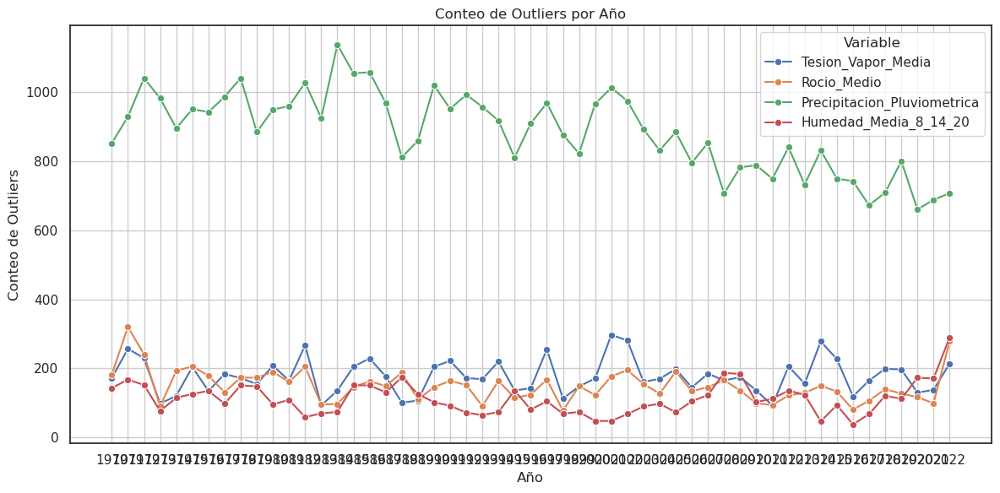

In [411]:
delta = 1
# Aplica la función para identificar outliers
df_completo_con_outliers = identificar_outliers(df_completo_actualizado.copy(), diccionario_estadisticos, variables,delta)

# Obtener el conteo de outliers por año
conteo_outliers_por_anio_df = contar_outliers_por_anio(df_completo_con_outliers, variables)

# Imprimir el DataFrame resultante
print(conteo_outliers_por_anio_df.head())


# Graficar el conteo de outliers por año
graficar_outliers_por_anio(conteo_outliers_por_anio_df, 'Conteo de Outliers por Año')



   Fecha            Variable_Outlier  Conteo_Outliers            Variable
0   1970  Tesion_Vapor_Media_outlier               23  Tesion_Vapor_Media
1   1971  Tesion_Vapor_Media_outlier               30  Tesion_Vapor_Media
2   1972  Tesion_Vapor_Media_outlier               30  Tesion_Vapor_Media
3   1973  Tesion_Vapor_Media_outlier                5  Tesion_Vapor_Media
4   1974  Tesion_Vapor_Media_outlier                9  Tesion_Vapor_Media


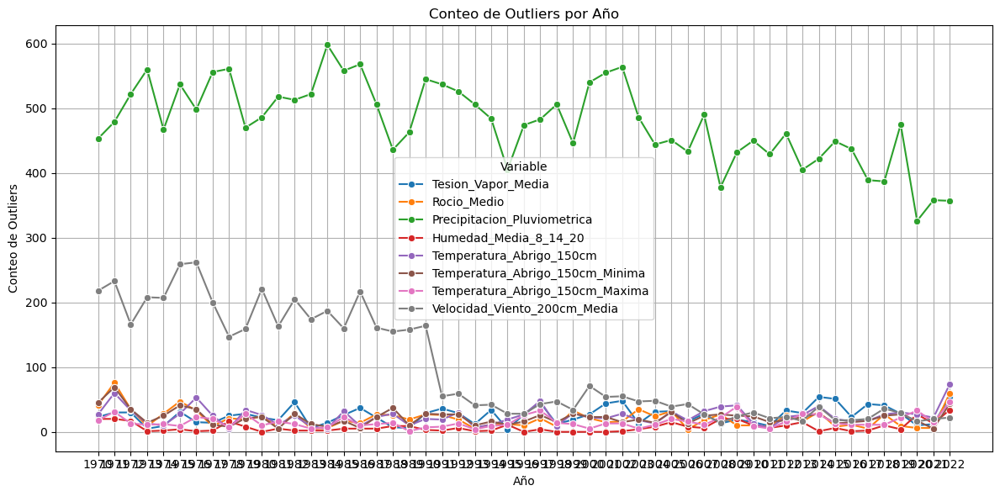

In [91]:
delta = 1.5
# Aplica la función para identificar outliers
df_completo_con_outliers = identificar_outliers(df_agrupado.copy(), dict_agrupado, variables,delta)

# Obtener el conteo de outliers por año
conteo_outliers_por_anio_df = contar_outliers_por_anio(df_completo_con_outliers, variables)

# Imprimir el DataFrame resultante
print(conteo_outliers_por_anio_df.head())


# Graficar el conteo de outliers por año
graficar_outliers_por_anio(conteo_outliers_por_anio_df, 'Conteo de Outliers por Año')



In [85]:
delta = 1.1
# Aplica la función para identificar outliers
df_completo_con_outliers = identificar_outliers(df_agrupado.copy(), dict_agrupado, variables,delta)

# Obtener el conteo de outliers por año
conteo_outliers_por_anio_df = contar_outliers_por_anio(df_completo_con_outliers, variables)

# Imprimir el DataFrame resultante
print(conteo_outliers_por_anio_df.head())


# Graficar el conteo de outliers por año
graficar_outliers_por_anio(conteo_outliers_por_anio_df, 'Conteo de Outliers por Año')



NameError: name 'dict_agrupado' is not defined

In [417]:
df_agrupado.to_csv(destino_archivos+"agrupado_largo.csv")

In [12]:
df_agrupado = pd.read_csv("agrupado_largo.csv")

df_agrupado.drop(df_agrupado.columns[0],axis=1,inplace=True)


# Vamos a reformatear el campo Fecha para poder crear nuevas agrupaciones
# Eliminar la hora en formato HH:MM:SS
patron = r'\d{2}:\d{2}:\d{2}'
df_agrupado['Fecha'] = df_agrupado['Fecha'].str.replace(patron, "", regex=True)

# Eliminar espacios extra en cada string (aplicado correctamente con .str)
df_agrupado['Fecha'] = df_agrupado['Fecha'].str.strip()

# Convertir a datetime
df_agrupado['Fecha'] = pd.to_datetime(df_agrupado['Fecha'], format='%Y-%m-%d', errors='coerce')


In [83]:
df_agrupado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135506 entries, 0 to 135505
Data columns (total 12 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   Fecha                            135506 non-null  datetime64[ns]
 1   Provincia                        135506 non-null  object        
 2   Tesion_Vapor_Media               135506 non-null  float64       
 3   Rocio_Medio                      133437 non-null  float64       
 4   Precipitacion_Pluviometrica      135506 non-null  float64       
 5   Humedad_Media_8_14_20            135506 non-null  float64       
 6   Temperatura_Abrigo_150cm         135506 non-null  float64       
 7   Temperatura_Abrigo_150cm_Minima  135506 non-null  float64       
 8   Velocidad_Viento_200cm_Media     135506 non-null  float64       
 9   Temperatura_Abrigo_150cm_Maxima  135506 non-null  float64       
 10  MES                              135506 non-

Por el momento la unica tendencia que encontramos es una reduccion en la cantidad de registros outliers de precipitacion, como vimos anteriormente el solo hecho de que llueva ya entra como outlier dado a que la norma esta en 0, es decir que podemos entender una reduccion en la cantidad de eventos precipitacion (no podemos aun confirmar si el volumen de precipitacion tambien tuvo una tendencia de caida)
El resto de las variables a considerar estaria la Velocidad Viento 200cm Media, pero hemos encontrado mucho faltante de registros sobre esta variable, por lo que un cambio tan brusco en la tendencia no podria ser considerado como un factor importante para el analisis, podria incluso eliminarse de las variables de analisis.
Las otras variables vemos que tienen un comportamiento repetitivo.

In [16]:
df = df_completo_actualizado.copy()
variable = 'Precipitacion_Pluviometrica'
# Calcular percentiles por mes
percentiles = df.groupby('MES')[variable].quantile([0.05, 0.95]).unstack()
percentiles.columns = ['P5', 'P95']

df = df.merge(percentiles, on='MES')
df[f'max_{variable}'] = df[variable] > df['P95']
df[f'min_{variable}'] = df[variable] < df['P5']

eventos_extremos = df.groupby('YEAR')[[f'max_{variable}', f'min_{variable}']].sum()
eventos_extremos.plot(kind='bar', title='Eventos extremos por año')


NameError: name 'df_completo_actualizado' is not defined

In [18]:
df = df_completo_actualizado[df_completo_actualizado['Provincia']=='Buenos Aires'].copy()
variable = 'Precipitacion_Pluviometrica'
# Calcular percentiles por mes
percentiles = df.groupby('MES')[variable].quantile([0.05, 0.95]).unstack()
percentiles.columns = ['P5', 'P95']

df = df.merge(percentiles, on='MES')
df[f'max_{variable}'] = df[variable] > df['P95']
df[f'min_{variable}'] = df[variable] < df['P5']

eventos_extremos = df.groupby('YEAR')[[f'max_{variable}', f'min_{variable}']].sum()
eventos_extremos.plot(kind='bar', title='Eventos extremos por año')


NameError: name 'df_completo_actualizado' is not defined

Originalmente la hipotesis nacia en que era factible encontrar un aumento en los eventos extremos y outliers con el paso del tiempo para poder correlacionarlo y usarlo como input para un modelo que evalue la variacion de la produccion agraria.
Al momento no encontramos con una inspeccion visual una relacion o tendencia simple de ver o explicar que demuestre un incremento en la cantidad de eventos extremos.

In [ ]:

# Vamos a generar un nuevo set de datos 

In [121]:
def resumen_mensual_todas_variables(df, lista_variables, umbral_dia_seco=1.0):
    # Asegurarse de tener columnas MES y YEAR
    df['MES'] = df['Fecha'].dt.month
    df['YEAR'] = df['Fecha'].dt.year

    resumenes = []

    for variable in lista_variables:
        # Agrupamos por Año, Mes, Provincia
        agrupado = df.groupby(['YEAR', 'MES', 'Provincia'])

        # Definimos funciones personalizadas
        def rango_diario(x):
            return (x.max() - x.min())

        def contar_outliers(x):
            q1 = np.percentile(x, 25)
            q3 = np.percentile(x, 75)
            iqr = q3 - q1
            lower = q1 - 1.5 * iqr
            upper = q3 + 1.5 * iqr
            return ((x < lower) | (x > upper)).sum()

        funciones = {
            f'{variable}_mean': (variable, 'mean'),
            f'{variable}_sum': (variable, 'sum'),
            f'{variable}_min': (variable, 'min'),
            f'{variable}_max': (variable, 'max'),
            f'{variable}_std': (variable, 'std'),
            f'{variable}_median': (variable, 'median'),
            f'{variable}_skew': (variable, lambda x: skew(x.dropna())),
            f'{variable}_kurtosis': (variable, lambda x: kurtosis(x.dropna())),
            f'{variable}_rango_diario': (variable, rango_diario),
            f'{variable}_outliers': (variable, contar_outliers)
        }

        # Si es una variable de precipitaciones, agregamos días secos
        if 'Precipitacion_Pluviometrica' in variable :
            funciones[f'{variable}_dias_secos'] = (variable, lambda x: (x < umbral_dia_seco).sum())

        resumen_variable = agrupado.agg(**funciones).reset_index()
        resumenes.append(resumen_variable)

    # Unimos todos los resúmenes en un solo DataFrame
    df_resumen = resumenes[0]
    for res in resumenes[1:]:
        df_resumen = pd.merge(df_resumen, res, on=['YEAR', 'MES', 'Provincia'], how='outer')

    return df_resumen

In [123]:
variables = [
    'Tesion_Vapor_Media', 'Rocio_Medio', 'Precipitacion_Pluviometrica',
    'Humedad_Media_8_14_20', 'Temperatura_Abrigo_150cm',
    'Temperatura_Abrigo_150cm_Minima', 'Temperatura_Abrigo_150cm_Maxima',
    'Velocidad_Viento_200cm_Media'
]


df_agrupado_resumen_mensual_todas_variables = resumen_mensual_todas_variables(df_agrupado, variables, umbral_dia_seco=1.0)

/tmp/ipykernel_9922/3481284001.py:31: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  f'{variable}_skew': (variable, lambda x: skew(x.dropna())),
/tmp/ipykernel_9922/3481284001.py:32: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  f'{variable}_kurtosis': (variable, lambda x: kurtosis(x.dropna())),
/tmp/ipykernel_9922/3481284001.py:31: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  f'{variable}_skew': (variable, lambda x: skew(x.dropna())),
/home/ariel/anaconda3/lib/python3.12/site-packages/scipy/stats/_stats_py.py:1177: RuntimeWarning: Mean of empty slice.
  mean = a.mean(axis, keepdims=True)
/home/ariel/anaconda3/l

In [125]:
df_agrupado_resumen_mensual_todas_variables



,YEAR,MES,Provincia,Tesion_Vapor_Media_mean,Tesion_Vapor_Media_sum,Tesion_Vapor_Media_min,Tesion_Vapor_Media_max,Tesion_Vapor_Media_std,Tesion_Vapor_Media_median,Tesion_Vapor_Media_skew,...,Velocidad_Viento_200cm_Media_mean,Velocidad_Viento_200cm_Media_sum,Velocidad_Viento_200cm_Media_min,Velocidad_Viento_200cm_Media_max,Velocidad_Viento_200cm_Media_std,Velocidad_Viento_200cm_Media_median,Velocidad_Viento_200cm_Media_skew,Velocidad_Viento_200cm_Media_kurtosis,Velocidad_Viento_200cm_Media_rango_diario,Velocidad_Viento_200cm_Media_outliers
0,1970,1,Buenos Aires,17.518710,543.080000,10.380000,25.460000,3.432449,16.880000,0.295452,...,10.234839,317.280000,5.920000,15.200000,2.619145,9.760000,0.285527,-0.782309,9.280000,0
1,1970,1,Corrientes,24.648387,764.100000,19.950000,27.900000,2.052498,25.000000,-0.437115,...,8.258065,256.000000,3.200000,14.800000,2.931299,7.200000,0.719738,-0.205755,11.600000,0
2,1970,1,Córdoba,18.700000,579.700000,10.700000,23.600000,3.718333,19.000000,-0.385224,...,7.922581,245.600000,1.600000,17.600000,4.319777,7.200000,0.786198,-0.348431,16.000000,1
3,1970,1,Entre Rios,19.832258,614.800000,12.500000,28.600000,4.426390,19.700000,0.149565,...,13.754839,426.400000,7.200000,27.200000,4.383822,12.800000,0.990648,1.163194,20.000000,1
4,1970,1,La Pampa,17.500000,542.500000,17.500000,17.500000,0.000000,17.500000,NaN,...,7.700000,238.700000,7.700000,7.700000,0.000000,7.700000,NaN,NaN,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4447,2022,12,Córdoba,18.162227,563.029024,8.577238,27.386345,4.437528,19.436575,-0.170682,...,5.763441,178.666670,1.066667,12.800000,2.691156,5.333333,0.646560,-0.102660,11.733333,0
4448,2022,12,Entre Rios,20.000000,620.000000,20.000000,20.000000,0.000000,20.000000,NaN,...,7.490323,232.200000,2.100000,13.200000,2.301066,7.200000,0.241438,0.278037,11.100000,2
4449,2022,12,La Pampa,13.678168,424.023206,8.083364,15.876447,2.779826,15.500000,-0.765795,...,8.873373,275.074562,6.252909,17.617920,1.815439,8.800000,3.520292,15.927422,11.365011,8
4450,2022,12,Misiones,19.956099,618.639065,9.719883,29.660055,5.255582,20.811995,-0.127372,...,3.608871,111.874999,2.625000,5.291666,0.761690,3.583333,0.688319,-0.430470,2.666666,0


In [127]:
# Completamos los valores NA de kurtosis y de skew para evitar dejar registros inutilizables
# Se aplica un Fill Forward para aquellos casos que por su baja variabilidad no puedan ser calculadas su kurtosis o el skew
# Se entiende que por concepto de continuidad los valores mas proximos al NA tenderan a ser cercanos al valor que corresponderia en NA

kurtosis_cols = [col for col in df_agrupado_resumen_mensual_todas_variables.columns if col.endswith('_kurtosis')]

# Aplicar forward fill solo a esas columnas
df_agrupado_resumen_mensual_todas_variables[kurtosis_cols] = df_agrupado_resumen_mensual_todas_variables[kurtosis_cols].fillna(method='ffill')



skew_cols = [col for col in df_agrupado_resumen_mensual_todas_variables.columns if col.endswith('_skew')]

# Aplicar forward fill solo a esas columnas
df_agrupado_resumen_mensual_todas_variables[skew_cols] = df_agrupado_resumen_mensual_todas_variables[skew_cols].fillna(method='ffill')

 
 

/tmp/ipykernel_9922/3344278402.py:8: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_agrupado_resumen_mensual_todas_variables[kurtosis_cols] = df_agrupado_resumen_mensual_todas_variables[kurtosis_cols].fillna(method='ffill')
/tmp/ipykernel_9922/3344278402.py:15: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_agrupado_resumen_mensual_todas_variables[skew_cols] = df_agrupado_resumen_mensual_todas_variables[skew_cols].fillna(method='ffill')


In [45]:
df_agrupado_resumen_mensual_todas_variables.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4452 entries, 0 to 4451
Data columns (total 84 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   YEAR                                          4452 non-null   int32  
 1   MES                                           4452 non-null   int32  
 2   Provincia                                     4452 non-null   object 
 3   Tesion_Vapor_Media_mean                       4452 non-null   float64
 4   Tesion_Vapor_Media_sum                        4452 non-null   float64
 5   Tesion_Vapor_Media_min                        4452 non-null   float64
 6   Tesion_Vapor_Media_max                        4452 non-null   float64
 7   Tesion_Vapor_Media_std                        4452 non-null   float64
 8   Tesion_Vapor_Media_median                     4452 non-null   float64
 9   Tesion_Vapor_Media_skew                       4452 non-null   f

In [129]:
df = df_agrupado_resumen_mensual_todas_variables.copy()
# Paso 1: Armamos un identificador para las columnas por mes
df['MES'] = df['MES'].astype(str)  # Aseguramos que sea string para concatenar

# Paso 2: Quitamos columnas clave y las otras las renombramos con el mes
id_vars = ['Provincia', 'YEAR', 'MES']
value_vars = [col for col in df.columns if col not in id_vars]

# Paso 3: Pasamos al formato largo con melt 
df_melted = df.melt(id_vars=id_vars, value_vars=value_vars, var_name='variable', value_name='valor')

# Paso 4: Creamos una nueva columna como "MES_variable"
df_melted['mes_variable'] = df_melted['MES'] + '_' + df_melted['variable']

# Paso 5: Pivotamos para que cada fila sea Provincia + YEAR, y columnas sean MES_VARIABLE
df_pivot = df_melted.pivot_table(index=['Provincia', 'YEAR'], columns='mes_variable', values='valor')

# Paso 6: Reset index para volver a tener Provincia y YEAR como columnas
df_final = df_pivot.reset_index()






In [131]:
df_final.head()

mes_variable,Provincia,YEAR,10_Humedad_Media_8_14_20_kurtosis,10_Humedad_Media_8_14_20_max,10_Humedad_Media_8_14_20_mean,10_Humedad_Media_8_14_20_median,10_Humedad_Media_8_14_20_min,10_Humedad_Media_8_14_20_outliers,10_Humedad_Media_8_14_20_rango_diario,10_Humedad_Media_8_14_20_skew,...,9_Velocidad_Viento_200cm_Media_kurtosis,9_Velocidad_Viento_200cm_Media_max,9_Velocidad_Viento_200cm_Media_mean,9_Velocidad_Viento_200cm_Media_median,9_Velocidad_Viento_200cm_Media_min,9_Velocidad_Viento_200cm_Media_outliers,9_Velocidad_Viento_200cm_Media_rango_diario,9_Velocidad_Viento_200cm_Media_skew,9_Velocidad_Viento_200cm_Media_std,9_Velocidad_Viento_200cm_Media_sum
0,Buenos Aires,1970,-0.710971,88.400000,68.398219,67.200000,52.000000,0.0,36.4,0.508816,...,-0.793050,17.76,11.260667,11.44,5.44,0.0,12.32,0.177123,3.504320,337.82
1,Buenos Aires,1971,-0.325339,84.388956,68.659924,67.188956,56.188956,0.0,28.2,0.243420,...,8.508947,31.52,11.237333,10.64,5.60,1.0,25.92,2.501009,4.819763,337.12
2,Buenos Aires,1972,0.133905,85.000000,69.509677,69.600000,59.000000,1.0,26.0,0.351175,...,1.090898,23.52,11.478000,10.80,4.96,2.0,18.56,0.947480,4.110388,344.34
3,Buenos Aires,1973,-0.887832,89.000000,72.946962,72.800000,58.400000,0.0,30.6,0.169485,...,1.428823,19.04,9.945333,9.84,4.00,1.0,15.04,0.785803,2.960722,298.36
4,Buenos Aires,1974,-0.878117,88.400000,63.316129,63.000000,46.000000,0.0,42.4,0.254702,...,2.341574,20.00,9.717333,9.52,4.16,4.0,15.84,1.287213,3.268583,291.52


In [133]:
df_final.shape

(371, 974)

In [135]:
df_final.to_csv(destino_archivos+"df_clima_formato_anual.csv")

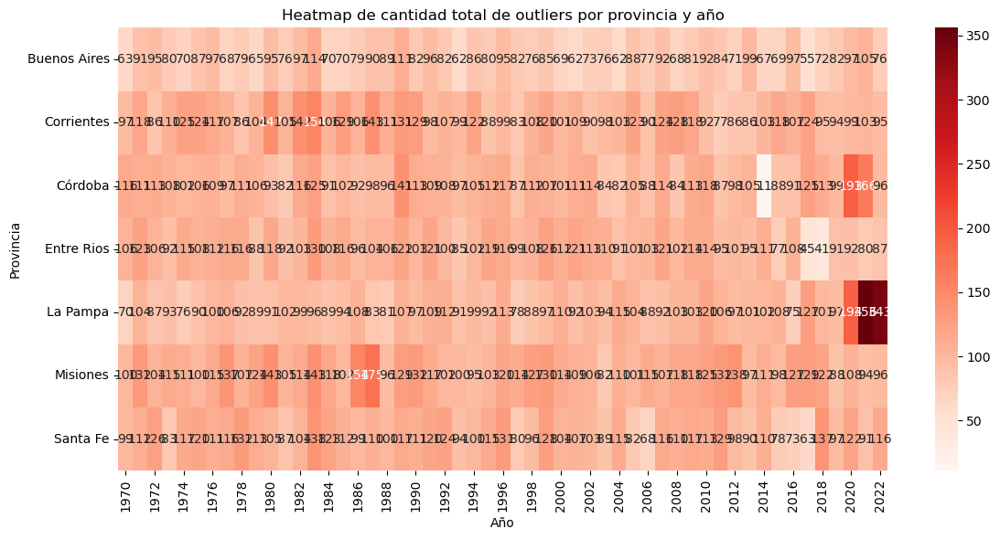

In [137]:
# Filtramos columnas de outliers
outlier_cols = [col for col in df_final.columns if '_outliers' in col and col[0].isdigit()]

# Sumamos outliers por año
df_final['total_outliers_anual'] = df_final[outlier_cols].sum(axis=1)

# Pivot para heatmap
heatmap_data = df_final.pivot(index='Provincia', columns='YEAR', values='total_outliers_anual')

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, cmap='Reds', annot=True, fmt='.0f')
plt.title('Heatmap de cantidad total de outliers por provincia y año')
plt.xlabel('Año')
plt.ylabel('Provincia')
plt.tight_layout()
plt.show()

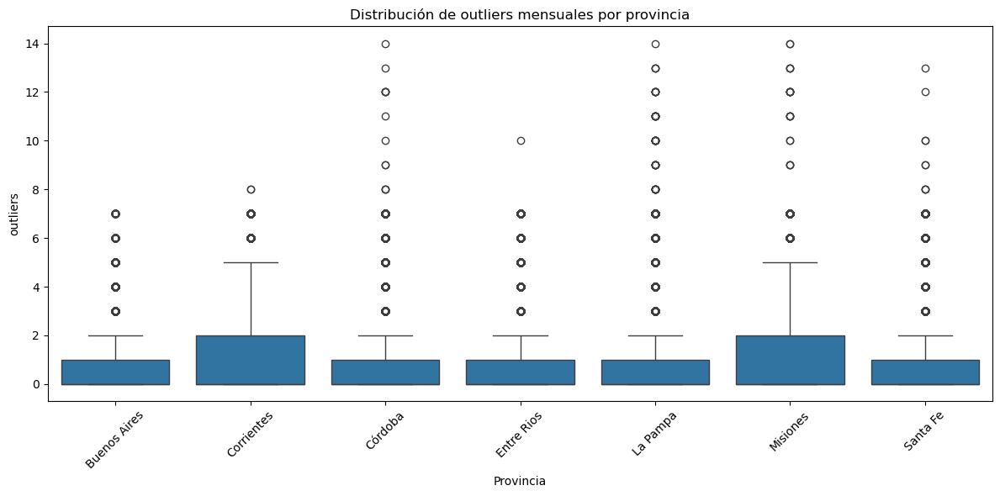

In [139]:
df_long = df_final.melt(id_vars=['Provincia', 'YEAR'], 
                        value_vars=outlier_cols,
                        var_name='mes_variable',
                        value_name='outliers')

# Extraer mes para facilitar análisis
df_long['MES'] = df_long['mes_variable'].str.extract(r'^(\d+)_')

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_long, x='Provincia', y='outliers')
plt.title('Distribución de outliers mensuales por provincia')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

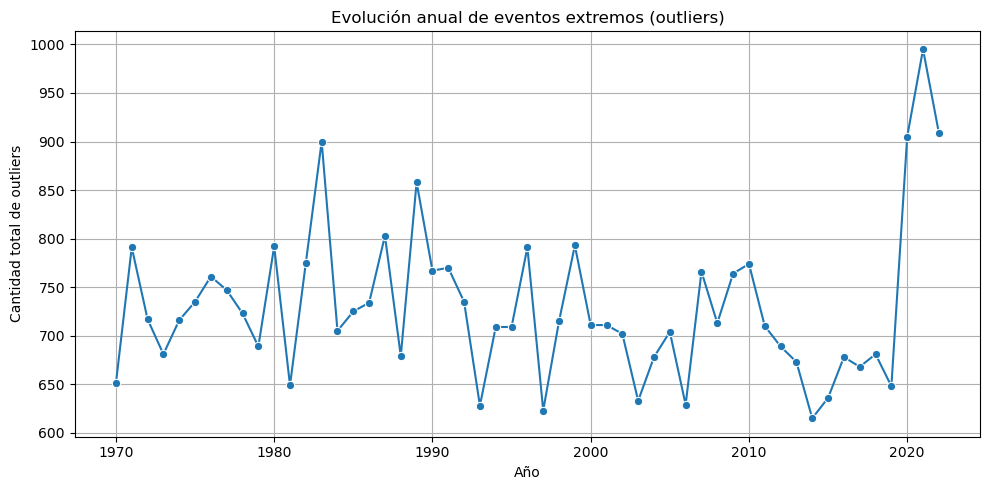

In [141]:
# Agrupar por año total de outliers (sumando por provincia o haciendo media)
outliers_por_anio = df_final.groupby('YEAR')['total_outliers_anual'].sum().reset_index()

plt.figure(figsize=(10, 5))
sns.lineplot(data=outliers_por_anio, x='YEAR', y='total_outliers_anual', marker='o')
plt.title('Evolución anual de eventos extremos (outliers)')
plt.xlabel('Año')
plt.ylabel('Cantidad total de outliers')
plt.grid(True)
plt.tight_layout()
plt.show()

In [143]:


outlier_cols = [col for col in df_completo_con_outliers.columns if '_outlier' in col]
# Total de True en el dataframe original
total_outliers_original = df_completo_con_outliers[outlier_cols].sum().sum()

# Total en el df_final (asegurate de solo columnas de outliers)
outlier_cols_final = [col for col in df_final.columns if '_outlier' in col]
total_outliers_final = df_final[outlier_cols_final].sum().sum()

print("Original:", total_outliers_original)
print("Final (pivot):", total_outliers_final)

Original: 36514
Final (pivot): 77326.0


# Resultado parcial
Luego de numerosos analisis y transformaciones llegamos a una forma de los datos que podria mostrar una tendencia creciente de los valores atipicos


PD:
Se intento agregar información de la calidad del aire de la ultima decada , información disponible en el portal de las FAO de las Naciones Unidas, los registros son anuales y no presentaban una variación notable para poder sumar esta variable como predictora.

